# 1. Setup environment

In [ ]:
# Install packages
! pip install -q tensorflow transformers datasets evaluate seqeval tf-keras PyGithub pympler

In [ ]:
# Import GPU support library
from numba import cuda

# Import file handling libraries
import os
import sys
import json
import pickle
import base64

# Import GitHub integration libraries
from github.MainClass import Github
import requests

# Import Google Drive integration libraries
#from google.colab import drive, files

# Import standard and numerical libraries
import numpy as np
import random
import pandas as pd

# Import dataset handling libraries
from datasets import Dataset, load_dataset
from sklearn.model_selection import train_test_split

# Import TensorFlow and Keras libraries
import tensorflow as tf
from transformers import create_optimizer
from transformers import BertConfig
from transformers import AutoTokenizer, BertTokenizer, BertTokenizerFast
from transformers import DataCollatorForTokenClassification, DataCollatorWithPadding
from transformers import AutoModel, TFBertModel, TFAutoModelForTokenClassification, TFBertForTokenClassification

# Import evaluation libraries
import evaluate
from transformers.keras_callbacks import KerasMetricCallback

# Import data analysis and visualization libraries
from collections import Counter
from IPython.display import Image, display
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from scipy import stats

# Import utility libraries
import timeit
from pympler import asizeof
import warnings

In [ ]:
"""# Mount Google Drive for read/write access
drive.mount('/content/drive')"""

# Temporary token for the repo
tk = 'x'

# Establish connection with GitHub
g = Github(tk)

# Load the repo
repo_name = "jspencermorris/datasci266_project"
repo = g.get_repo(repo_name)

# Get the scoring scripts
file_list = repo.get_contents("utils")
script_paths = [file.path for file in file_list]

# Bash script to make the folder for utilities and specify it as a system path
! mkdir -p /content/datasci266_project/utils

# Download and save the scripts
for script_path in script_paths:
    file_content = repo.get_contents(script_path).decoded_content.decode('utf-8')
    file_name = os.path.basename(script_path)
    with open(f'/content/datasci266_project/utils/{file_name}', 'w') as file:
        file.write(file_content)

# Verify that the files have been copied
! ls /content/datasci266_project/utils/

# Add the new directory to the python path
sys.path.append('/content/datasci266_project/utils')

# Import evaluation libraries
import compute_MCC
import compute_seqeval


compute_MCC.py	compute_seqeval.py  __pycache__


# 2. Define helper functions

In [ ]:
# Function to reset Keras Session
def reset_keras():
    sess = tf.compat.v1.keras.backend.get_session()
    tf.compat.v1.keras.backend.clear_session()
    sess.close()
    sess = tf.compat.v1.keras.backend.get_session()

    try:
        del classifier # this is from global space - change this as you need
    except:
        pass

    # use the same config as you used to create the session
    config = tf.compat.v1.ConfigProto()
    config.gpu_options.per_process_gpu_memory_fraction = 1
    config.gpu_options.visible_device_list = "0"
    tf.compat.v1.keras.backend.set_session(tf.compat.v1.Session(config=config))

    device = cuda.get_current_device()
    device.reset()

In [ ]:
# Function to upload file to GitHub
def upload_to_github(filename, github_folder):
    """
    Upload a file to a GitHub repository.

    Parameters:
    - filename (str): Filename with extension (e.g., filename.json) of the local file to be uploaded.
    - github_folder (str): Folder (e.g., data/interim) in the repository where the file will be saved.

    Returns:
    - None
    """
    # Ensure there is no trailing slash in the github_folder
    if github_folder.endswith('/'):
        github_folder = github_folder[:-1]

    # Specify the local file path
    local_file_path = f"/content/{filename}"

    # Specify the GitHub file path
    github_path = f"{github_folder}/{filename}"

    # Determine file mode
    file_mode = 'rb' if filename.endswith('.pkl') else 'r'

    # Read the content of the local file
    with open(local_file_path, file_mode) as file:
        content = file.read()

    # Convert content to base64 for binary files
    if file_mode == 'rb':
        content = base64.b64encode(content).decode()

    # Check if the file already exists in the repository
    try:
        contents = repo.get_contents(github_path)
        # Update the file if it already exists
        repo.update_file(contents.path, f"updating {filename}", content, contents.sha)
        print(f"Updated {github_path} in the repository.")
    except Exception as e:
        print(f"File not found: {e}. Creating a new one.")
        # Create a new file if it does not exist
        repo.create_file(github_path, f"adding {filename}", content)
        print(f"Created {github_path} in the repository.")

# Function to load a file from GitHub
def download_from_github0(file_path, github_folder=None):
    """
    Load a file from a GitHub repository.

    Parameters:
    - file_path (str): The name of the file to be loaded from the repository.
    - github_folder (str): The folder in the repository where the file is located.

    Returns:
    - local_file_path (str): The local file path of the loaded file.
    """
    # Update the GitHub file path, if necessary
    if github_folder:
        github_path = f"{github_folder}/{file_path}"
    else:
        github_path = file_path

    # Get the file content from the repository
    try:
        file_content = repo.get_contents(github_path).decoded_content
        local_file_path = f"/content/{file_path}"

        # Determine file mode
        file_mode = 'wb' if file_path.endswith('.pkl') else 'w'

        # Save the content to a local file
        with open(local_file_path, file_mode) as file:
            if file_mode == 'wb':
                file.write(base64.b64decode(file_content))
            else:
                file.write(file_content.decode())

        print(f"Loaded {github_path} into the local Google Colab environment.")
        return local_file_path
    except Exception as e:
        print(f"Failed to load {github_path}: {e}")
        return None

# Function to load a file from GitHub
def download_from_github(file_path, github_folder=None, verbose=True):
    """
    Load a file from a GitHub repository.

    Parameters:
    - file_path (str): The name of the file to be loaded from the repository.
    - github_folder (str): The folder in the repository where the file is located.
    - verbose (bool): If True, prints status messages.

    Returns:
    - local_file_path (str): The local file path of the loaded file.
    """
    # Update the GitHub file path, if necessary
    if github_folder:
        github_path = f"{github_folder}/{file_path}"
    else:
        github_path = file_path

    try:
        # Get the file content from the repository
        file_content = repo.get_contents(github_path).decoded_content
        local_file_path = f"/content/{file_path}"

        # Determine file mode
        file_mode = 'wb' if file_path.endswith('.pkl') else 'w'

        # Save the content to a local file
        with open(local_file_path, file_mode) as file:
            if file_mode == 'wb':
                file.write(base64.b64decode(file_content))
            else:
                file.write(file_content.decode())

        if verbose:
            print(f"Loaded {github_path} into the local Google Colab environment.")
        return local_file_path
    except AssertionError as e:
        if 'unsupported encoding' in str(e):
            # Fetch file download URL
            file_metadata = repo.get_contents(github_path)
            download_url = file_metadata.download_url
            if verbose:
                print(f"Download URL: {download_url}")

            # Download the file content using the download URL
            response = requests.get(download_url)
            local_file_path = f"/content/{file_path}"

            # Determine file mode
            file_mode = 'wb' if file_path.endswith('.pkl') else 'w'

            # Save the content to a local file
            with open(local_file_path, file_mode) as file:
                if file_mode == 'wb':
                    file.write(response.content)
                else:
                    file.write(response.text)

            if verbose:
                print(f"Loaded {github_path} into the local Google Colab environment.")
            return local_file_path
        else:
            if verbose:
                print(f"Failed to load {github_path}: {e}")
            return None
    except Exception as e:
        if verbose:
            print(f"Failed to load {github_path}: {e}")
        return None

In [ ]:
# Function to load the CLUB dataset and handle errors
def load_club_dataset(subset, split):
    """
    Load the CLUB dataset for a given subset and split.

    Args:
    subset (str): The subset of the dataset (e.g., 'BATTERY', 'CATALYST').
    split (str): The data split to load (e.g., 'train', 'validation').

    Returns:
    dataset: The loaded dataset or None if loading fails.
    """
    try:
        dataset = load_dataset(path='bluesky333/chemical_language_understanding_benchmark', data_dir=subset, split=split)
        print(f"Loaded {subset} dataset ({split}) successfully.")
        return dataset
    except Exception as e:
        print(f"Error loading {subset} dataset ({split}): {e}")
        return None

# Function to split the train dataset into train and validation sets
def split_train_validation(dataset, test_size=0.15):
    """
    Split a dataset into training and validation subsets.

    Args:
    dataset (Dataset): The dataset to split.
    test_size (float): The proportion of the dataset to include in the validation split.

    Returns:
    train_dataset, val_dataset: The training and validation datasets.
    """
    # Convert dataset to pandas DataFrame
    df = dataset.to_pandas()

    # Split the DataFrame
    train_df, val_df = train_test_split(df, test_size=test_size, random_state=42)

    # Convert back to datasets
    train_dataset = Dataset.from_pandas(train_df)
    val_dataset = Dataset.from_pandas(val_df)

    return train_dataset, val_dataset

In [ ]:
# Function to plot a distribution of the length of passages
def plot_passage_lengths(dataset):

    # Extract the lengths of each passage (before subword tokenization)
    sentence_lengths = [len(tokens) for tokens in dataset['tokens']]

    # Plot the histogram
    plt.figure(figsize=(5, 3))
    plt.hist(sentence_lengths, bins=30, edgecolor='black')
    plt.title('Histogram of Sentence Lengths')
    plt.xlabel('Number of Words')
    plt.ylabel('Frequency')
    plt.show()

# Function to display the sentence length statistics
def display_passage_stats(dataset):

    # Extract the lengths of each passage (before subword tokenization)
    sentence_lengths = [len(tokens) for tokens in dataset['tokens']]

    # Calculate statistics
    min_length = np.min(sentence_lengths)
    max_length = np.max(sentence_lengths)
    median_length = np.median(sentence_lengths)
    mode_length = stats.mode(sentence_lengths, keepdims=True).mode[0]
    mean_length = np.mean(sentence_lengths)

    # Create a DataFrame to store the statistics
    data = {
        'Statistic': ['Min', 'Max', 'Median', 'Mode', 'Mean'],
        'Value': [min_length, max_length, median_length, mode_length, mean_length]
    }
    df = pd.DataFrame(data)

    # Display the DataFrame
    display(df)

# Function to plot a histogram of NER tag counts
def plot_label_counts(dataset):

    # Extract NER labels
    ner_labels = [label for labels in dataset['ner_tags'] for label in labels]

    # Count occurrences of each label
    label_counts = pd.Series(ner_labels).value_counts().sort_index()

    # Plot the histogram of label counts
    plt.figure(figsize=(5, 3))
    label_counts.plot(kind='bar', edgecolor='black')
    plt.title('Histogram of NER Labels Distribution')
    plt.xlabel('NER Labels')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

# Function to count NER tag occurrences for a specified dataset
def display_label_counts(dataset):
    counts = []
    for split_name in ['train', 'val', 'eval']:
        split_data = dataset[split_name]
        # Flatten the list of tags
        all_tags = [tag for example in split_data['ner_tags'] for tag in example]
        # Count occurrences of each tag
        tag_counts = Counter(all_tags)
        # Append counts to the list
        for tag, count in tag_counts.items():
            counts.append((split_name, tag, count))
    return counts

In [ ]:
# Function to create dictionary that maps labels to ids, with B/I as odd/even integers
def create_label2id_mapping(dataset):
    """
    Create a mapping of NER labels to integer ids with 'B-XXX' tags as odd integers
    and 'I-XXX' tags as even integers.

    Args:
    dataset (Dataset): The dataset containing NER tags.

    Returns:
    dict: A dictionary mapping NER labels to integer ids.
    """
    # Extract unique tags from the dataset
    unique_tags = set(tag for example in dataset['ner_tags'] for tag in example)
    unique_tags = sorted(unique_tags)  # Ensure consistent ordering
    # Initialize the mapping dictionary with 'O': 0
    tag_mapping = {'O': 0}
    current_index = 1  # Start assigning odd integers for 'B-XXX' tags
    # Separate 'B-XXX' and 'I-XXX' tags
    b_tags = sorted(tag for tag in unique_tags if tag.startswith('B-') and tag != 'O')
    i_tags = sorted(tag for tag in unique_tags if tag.startswith('I-') and tag != 'O')
    # Map 'B-XXX' tags to odd integers
    for tag in b_tags:
        tag_mapping[tag] = current_index
        current_index += 2  # Move to the next odd integer
    # Map 'I-XXX' tags to even integers
    current_index = 2  # Start assigning even integers for 'I-XXX' tags
    for tag in i_tags:
        tag_mapping[tag] = current_index
        current_index += 2  # Move to the next even integer
    return tag_mapping

In [ ]:
# Function to add integer NER labels to dataset examples
def add_ner_ids(example, label_dict):
    """
    Add integer NER labels to each token in the example.

    Args:
    example (dict): Example containing 'ner_tags' field.
    label_dict (dict): Dictionary mapping NER tags to integer labels.

    Returns:
    dict: Updated example with 'ner_ids' field containing integer labels.
    """
    example['ner_ids'] = [label_dict[tag] for tag in example['ner_tags']]
    return example

In [ ]:
# Function for token-label alignemnt (word --> subword)
def align_labels_with_tokens(labels, word_ids, label_all_subword_tokens=False):
    """
    Align labels with tokens, considering subword tokens.

    Args:
    labels (list): List of original NER labels.
    word_ids (list): List of word IDs for each token, as provided by the tokenizer.
    label_all_subword_tokens (bool): Whether to label all subword tokens (TRUE) or only the first subword token (FALSE)

    Returns:
    list: List of new labels aligned with subword tokens.
    """
    new_labels = []
    current_word = None
    for word_id in word_ids:
      if word_id is None: # Special token
        new_labels.append(LABEL_PAD_TOKEN_ID) # Set the special tokens
      elif word_id != current_word: # Start of a new word!
        current_word = word_id
        new_labels.append(labels[word_id]) # Always label the first subword as B-XXX (odd)
      else: # Continuation of the same word
        if label_all_subword_tokens:
          label = labels[word_id]
          if label % 2 == 1: # If the label is B-XXX we change it to I-XXX
              label += 1
          new_labels.append(label) # Label continuing subwords as I-XXX (even)
        else:
          new_labels.append(LABEL_PAD_TOKEN_ID)
    return new_labels

# Function to tokenize inputs and align labels
def tokenize_and_align_labels(examples):
    """
    Tokenize inputs and align labels with subword tokens.

    Args:
    examples (dict): Dataset examples containing tokens and ner_ids.

    Returns:
    dict: Tokenized inputs with aligned labels.
    """
    tokenized_inputs = TOKENIZER(
        examples["tokens"],
        is_split_into_words=True,
        truncation=True,
        max_length=MAX_LEN,
        padding='max_length',
        return_tensors='tf')
    new_labels = []
    for i, labels in enumerate(examples['ner_ids']):
      word_ids = tokenized_inputs.word_ids(i)   # Map tokens to their respective word.
      new_labels.append(align_labels_with_tokens(labels, word_ids))
    tokenized_inputs["labels"] = new_labels # Labels generated for each subword
    return tokenized_inputs

# Function to inspect an example's label-token alignment after subword tokenization
def inspect_tokenization(example_index, dataset):
    """
    Inspect the tokenization and label alignment for a specific example in a dataset.

    Args:
    example_index (int): Index of the example to inspect.
    dataset_name (str): Name of the dataset ('catalyst' or 'battery').
    """
    # Data prior to subword model tokenization
    original_example = dataset[example_index]
    print(f"Original Tokens: {len(original_example['tokens'])} tokens")
    print('\t', original_example['tokens'])
    print(f"NER Tags: {len(original_example['ner_tags'])} tags")
    print('\t', original_example['ner_tags'])
    print(f"NER IDs: {len(original_example['ner_ids'])} IDs")
    print('\t', original_example['ner_ids'])

    # Data after subword model tokenization
    tokenized_input = TOKENIZER(original_example['tokens'], is_split_into_words=True)
    subword_tokens = TOKENIZER.convert_ids_to_tokens(tokenized_input["input_ids"])
    print(f"Subword Tokens: {len(subword_tokens)} tokens")
    print('\t', subword_tokens)
    print(f"Subword Labels: {len(dataset[example_index]['labels'])}")
    print('\t', dataset[example_index]['labels'])

In [ ]:
# Function for inverting alignemnt (subword --> word), necessary for applying scoring scripts
def invert_alignment(labels, word_ids, label_all_subword_tokens=False):
    """
    Map subword labels back to word labels.

    Args:
    labels (list): List of subword labels.
    word_ids (list): List of word IDs for each subword.
    label_all_subword_tokens (bool): Whether all subwords of a word are labeled.

    Returns:
    list: List of word-level labels.
    """
    word_labels = []
    current_word = None
    current_labels = []

    for i, word_id in enumerate(word_ids):
        if word_id is None:
            continue
        if word_id != current_word:
            if current_word is not None:
                if label_all_subword_tokens:
                    word_labels.append(current_labels[0])
                else:
                    word_labels.append(current_labels[0])
            current_word = word_id
            current_labels = [labels[i]] if i < len(labels) else [0]
        else:
            if i < len(labels):
                current_labels.append(labels[i])

    # Append the label for the last word
    if current_word is not None:
        if label_all_subword_tokens:
            word_labels.append(current_labels[0])
        else:
            word_labels.append(current_labels[0])

    return word_labels


# Function to test invert_alignment
def test_invert_alignment(dataset, example_index, label_all_subword_tokens=False):
    """
    Test the invert_alignment function by comparing original and reset labels.

    Args:
    dataset (dict): Dictionary containing the dataset.
    split (str): Split of the dataset ('train', 'validation', 'test').
    example_index (int): Index of the example to test.
    label_all_subword_tokens (bool): Whether all subwords of a word are labeled.
    """
    example = dataset[example_index]
    tokenized_input = TOKENIZER(example['tokens'], is_split_into_words=True)
    word_ids = tokenized_input.word_ids()

    subword_labels = example['labels']
    word_labels = invert_alignment(subword_labels, word_ids, label_all_subword_tokens)

    print(f"Original word-level labels: {example['ner_ids']}")
    print(f"Reset word-level labels: {word_labels}")
    print(f"Do the labels match? {example['ner_ids'] == word_labels}")

In [ ]:
# Function for conversion of HF dataset to TensorFlow datasets
def prepare_tf_datasets(train_dataset, validation_dataset, evaluation_set, tokenizer, batch_size=16):
    """
    Prepare TensorFlow datasets from tokenized datasets.

    Args:
    - train_dataset: Hugging Face tokenized train dataset.
    - validation_dataset: Hugging Face tokenized validation dataset.
    - tokenizer: Hugging Face tokenizer.

    Returns:
    - tf_train_set: TensorFlow train dataset.
    - tf_validation_set: TensorFlow validation dataset.
    """
    data_collator = DataCollatorForTokenClassification(
        tokenizer=tokenizer,
        return_tensors="tf",
        label_pad_token_id=LABEL_PAD_TOKEN_ID,
    )

    tf_train_set = train_dataset.to_tf_dataset(
        columns=["input_ids", "token_type_ids", "attention_mask", "id"],
        label_cols=["labels"],
        shuffle=False,
        batch_size=batch_size,
        collate_fn=data_collator,
    )

    tf_validation_set = validation_dataset.to_tf_dataset(
        columns=["input_ids", "token_type_ids", "attention_mask", "id"],
        label_cols=["labels"],
        shuffle=False,
        batch_size=batch_size,
        collate_fn=data_collator,
    )

    tf_evaluation_set = evaluation_set.to_tf_dataset(
        columns=["input_ids", "token_type_ids", "attention_mask", "id"],
        label_cols=["labels"],
        shuffle=False,
        batch_size=batch_size,
        collate_fn=data_collator,
    )

    return tf_train_set, tf_validation_set, tf_evaluation_set

In [ ]:
# Function for conversion of TensorFlow dataset to dictionary of lists
def prepare_dict_dataset(tensorflow_dataset):
    """
    Convert a TensorFlow Dataset object to a dictionary format.

    Args:
    - tensorflow_dataset: TensorFlow Dataset object.

    Returns:
    - dict_dataset: Dictionary with keys 'input_ids', 'attention_mask', 'tokens', and 'id'.
    """
    dict_dataset = {
        'id': [],
        'input_ids': [],
        'token_type_ids': [],
        'attention_mask': [],
        'labels': [],
    }

    # Iterate over the dataset
    for batch in tensorflow_dataset:
        attention_mask = batch[0]['id'].numpy()
        input_ids = batch[0]['input_ids'].numpy()
        token_type_ids = batch[0]['token_type_ids'].numpy()
        attention_mask = batch[0]['attention_mask'].numpy()
        labels = batch[1]
        # Extract the 'tokens' and 'id' from the batch if available
        # Note: Adjust extraction based on your specific dataset structure if needed
        #tokens = batch.get('tokens', [None] * input_ids.shape[0])  # Assuming tokens are in the batch

        # Append data to the dictionary lists
        dict_dataset['id'].extend(input_ids.tolist())
        dict_dataset['input_ids'].extend(input_ids.tolist())
        dict_dataset['token_type_ids'].extend(token_type_ids.tolist())
        dict_dataset['attention_mask'].extend(attention_mask.tolist())
        dict_dataset['labels'].extend(labels)

    return dict_dataset

In [ ]:
def custom_acc_orig_tokens(y_true, y_pred):
    """
    calculate loss dfunction filtering out also the newly inserted labels

    y_true: Shape: (batch x (max_length) )
    y_pred: predictions. Shape: (batch x x (max_length + 1) x num_distinct_ner_tokens )

    returns: accuracy
    """

    # Get labels and predictions
    y_label = tf.reshape(tf.keras.layers.Flatten()(tf.cast(y_true, tf.int64)),[-1])
    mask = (y_label >= 0)
    y_label_masked = tf.boolean_mask(y_label, mask)
    y_predicted = tf.math.argmax(input = tf.reshape(tf.keras.layers.Flatten()(tf.cast(y_pred, tf.float32)),\
                                                    [-1, NUM_CLASSES]), axis=1)
    y_predicted_masked = tf.boolean_mask(y_predicted, mask)
    custom_acc = tf.reduce_mean(tf.cast(tf.equal(y_predicted_masked,y_label_masked) , dtype=tf.float32))

    return custom_acc

def custom_acc_orig_non_other_tokens(y_true, y_pred):
    """
    Calculate accuracy for non-'O' tokens only.

    y_true: Shape: (batch x (max_length) )
    y_pred: predictions. Shape: (batch x (max_length) x num_distinct_ner_tokens )

    returns: accuracy
    """
    # Flatten the tensors
    y_true_flat = tf.reshape(tf.keras.layers.Flatten()(tf.cast(y_true, tf.int64)), [-1])
    y_pred_flat = tf.reshape(tf.keras.layers.Flatten()(tf.cast(y_pred, tf.float32)), [-1, NUM_CLASSES])

    # Create mask for non-'O' labels
    mask = (y_true_flat > 0)
    y_true_masked = tf.boolean_mask(y_true_flat, mask)
    y_pred_masked = tf.boolean_mask(tf.math.argmax(input=y_pred_flat, axis=1), mask)

    # Handle case where no non-'O' labels are present
    if tf.shape(y_true_masked)[0] == 0:
        return tf.constant(0.0, dtype=tf.float32)  # Return 0 if no non-'O' labels

    # Calculate accuracy
    accuracy = tf.reduce_mean(tf.cast(tf.equal(y_pred_masked, y_true_masked), dtype=tf.float32))

    return accuracy

In [ ]:
# Initialize evaluation metric
seqeval = evaluate.load("seqeval")

# Function to compute validation metrics (at epoch conclusion) during model fitting
def compute_metrics(p, label_list):
    """
    Compute evaluation metrics.

    Args:
    - p: Predictions and labels.
    - label_list: List of labels.

    Returns:
    - results: Dictionary containing precision, recall, f1, and accuracy.
    """
    predictions, labels = p
    predictions = np.argmax(predictions, axis=2)
    true_predictions = [
        [label_list[p] for (p, l) in zip(prediction, label) if l != LABEL_PAD_TOKEN_ID]
        for prediction, label in zip(predictions, labels)
    ]
    true_labels = [
        [label_list[l] for (p, l) in zip(prediction, label) if l != LABEL_PAD_TOKEN_ID]
        for prediction, label in zip(predictions, labels)
    ]
    results = seqeval.compute(predictions=true_predictions, references=true_labels)

    return {
        "precision": results["overall_precision"],
        "recall": results["overall_recall"],
        "f1": results["overall_f1"],
        "accuracy": results["overall_accuracy"],
    }

In [ ]:
# Function to print metrics as a function of epoch to identify overfitting
def print_metrics(history):
    print("Training Metrics:")
    print(history.history.keys())  # List all data in history

    # Print metrics for each epoch
    for metric_name in history.history.keys():
        if metric_name.startswith('val_'):
            continue  # Skip validation metrics here

        print(f"{metric_name}:")
        for epoch, value in enumerate(history.history[metric_name], 1):
            print(f"  Epoch {epoch}: {value:.4f}")

# Function to plot metrics as subplots with two columns
def plot_metrics(history):
    metrics = history.history.keys()
    num_metrics = len(metrics)
    num_rows = (num_metrics + 1) // 2  # Calculate number of rows needed for two columns

    fig, axes = plt.subplots(num_rows, 2, figsize=(10, 3 * num_rows))

    for i, metric in enumerate(metrics):
        row = i // 2
        col = i % 2
        ax = axes[row, col] if num_rows > 1 else axes[col]
        ax.plot(history.history[metric], label=f'Training {metric}')

        # Check if validation metric exists
        val_metric = f'val_{metric}'
        if val_metric in history.history:
            ax.plot(history.history[val_metric], label=f'Validation {metric}')

        ax.set_xlabel('Epoch')
        ax.set_ylabel(metric)
        ax.legend()

    # Remove any unused subplot
    if num_metrics % 2 != 0:
        fig.delaxes(axes[-1, -1])

    plt.tight_layout()
    plt.show()

In [ ]:
# Function to predict labels and save predictions from a TensorFlow dataset
def save_predictions(model, tf_dataset, hf_dataset, tokenizer, id2label, output_file, upload_choice=False):
    """
    Save predictions from the validation dataset.

    Args:
    - model: Trained TensorFlow model.
    - tf_dataset: TensorFlow dataset of tokenized data.
    - tokenizer: Hugging Face tokenizer.
    - id2label: Dictionary mapping IDs to labels.
    - output_file: Path to save the predictions JSON file.

    Returns:
    - predictions_list: List of dictionaries with 'id', 'tokens', and 'pred_ner_tags'.
    """
    predictions_list = []

    # Predict the outputs for the entire dataset
    outputs = model.predict(tf_dataset)
    predictions = np.argmax(outputs, axis=-1)  # Get the predicted class for each token

    # Define special tokens to exclude
    special_tokens = {tokenizer.cls_token_id, tokenizer.sep_token_id, tokenizer.pad_token_id}

    # Iterate over the validation dataset and predictions together
    batch_index = 0
    for batch, _ in tf_dataset: # Loop over each Batch of Examples
        input_ids = batch['input_ids'].numpy()
        attention_mask = batch['attention_mask'].numpy()
        ids = batch['id'].numpy()

        batch_size = input_ids.shape[0]

        for j in range(batch_size): # Loop over each Example in the Batch
            unique_id = int(ids[j])  # Use the 'id' field from the dataset
            input_id_list = input_ids[j] # Get the list of input ids
            tokens = tokenizer.convert_ids_to_tokens(input_id_list)

            # Filter out special tokens and handle out-of-vocabulary tokens
            new_tokens = []
            for token_id, token in zip(input_id_list, tokens):
                if token_id in special_tokens:
                    continue  # Skip special tokens
                if token_id == tokenizer.unk_token_id:  # Handle out-of-vocabulary tokens
                    new_tokens.append(tokenizer.unk_token)
                elif token.startswith('##'):
                    new_tokens[-1] = new_tokens[-1] + token[2:]
                else:
                    new_tokens.append(token)

            # Get the word ids
            tokenized_input = tokenizer(new_tokens, is_split_into_words=True, return_tensors="np")
            word_ids = tokenized_input.word_ids()

            # Invert alignment to get token-level predictions
            pred_ner_tags = invert_alignment(predictions[batch_index * batch_size + j].tolist(), word_ids)
            pred_ner_tags = [id2label[tag] for tag in pred_ner_tags]

            # Create the dictionary for this example
            pred_dict = {
                'id': unique_id,
                'tokens': new_tokens,
                'pred_ner_tags': pred_ner_tags
            }

            predictions_list.append(pred_dict)

        batch_index += 1

    # Ensure the lengths match by padding truncated predictions (necessary for less than 0.1% of all passages)
    for hf_passage, prediction_passage in zip(hf_dataset, predictions_list):
        hf_length = len(hf_passage['ner_tags'])
        pred_length = len(prediction_passage['pred_ner_tags'])
        if pred_length < hf_length:
            prediction_passage['tokens'] = hf_passage['tokens']
            prediction_passage['pred_ner_tags'] = prediction_passage['pred_ner_tags'] + ['O'] * (hf_length - pred_length)
        elif pred_length > hf_length:
            prediction_passage['tokens'] = hf_passage['tokens']
            prediction_passage['pred_ner_tags'] = prediction_passage['pred_ner_tags'][:hf_length]

    # Save predictions and labels in JSON format
    with open(output_file, "w") as f:
        json.dump(predictions_list, f)

    if upload_choice:
        # Upload predictions file as a json file to GitHub
        upload_to_github(output_file, 'data/interim/')

    return predictions_list

# Function to load metrics details from a CSV file
def load_predictions(file_name, verbose=True):
    """
    Loads the metrics DataFrame from a JSON file.

    Args:
    - file_name (str): Name of the DataFrame to be loaded.
    - verbose (bool): If True, prints status messages.

    Returns:
        list[dict]: A list of dictionaries with the predictions.
    """
    file_path = f"{file_name}.json"
    local_file_path = f"/content/{file_path}"

    if not os.path.isfile(local_file_path):
        github_folder = 'data/interim'
        local_file_path = download_from_github(file_path, github_folder, verbose=verbose)

    if local_file_path and os.path.isfile(local_file_path):
        with open(local_file_path, 'r') as file:
            predictions = json.load(file)
        return predictions
    else:
        if verbose:
            print(f"File {file_path} not found in the local environment or GitHub.")
        return None

In [ ]:
# Function to save a pickle file
def save_pickle(obj, file_name, upload_choice=False):
    """
    Saves an object to a pickle file.

    Args:
    - obj: The object to save.
    - file_name (str): The name of the pickle file to save.
    - upload_choice (bool): Whether to upload the file to GitHub.
    """
    file_path = f"{file_name}.pkl"
    with open(file_path, 'wb') as file:
        pickle.dump(obj, file)

    if upload_choice:
        # Upload the pickle file to GitHub
        upload_to_github(file_path, 'data/interim/')

# Function to load a pickle file
def load_pickle(file_name):
    """
    Loads an object from a pickle file.

    Args:
    - file_name (str): The name of the pickle file to load.

    Returns:
    - obj: The loaded object.
    """
    file_path = f"{file_name}.pkl"
    local_file_path = f"/content/{file_path}"

    if not os.path.isfile(local_file_path):
        github_folder = 'data/interim'
        local_file_path = download_from_github(file_path, github_folder)

    if local_file_path and os.path.isfile(local_file_path):
        with open(local_file_path, 'rb') as file:
            obj = pickle.load(file)
        return obj
    else:
        print(f"File {file_path} not found in the local environment or GitHub.")
        return None

In [ ]:
# Function to inspect an example to compare true vs. predicted labels
def inspect_example(reference_data, prediction_data, idx):

    # Actual labels from validation dataset
    actual_tokens = reference_data[idx]['tokens']
    actual_labels = reference_data[idx]['ner_tags']

    # Predicted labels from saved predictions
    prediction_tokens = prediction_data[idx]['tokens']
    prediction_labels = prediction_data[idx]['pred_ner_tags']

    # Print lengths and contents for comparison
    print("Actual Tokens:")
    print(len(actual_tokens))
    print(actual_tokens)
    print("\nActual Labels:")
    print(len(actual_labels))
    print(actual_labels)
    print("\nPredicted Tokens:")
    print(len(prediction_tokens))
    print(prediction_tokens)
    print("\nPredicted Labels:")
    print(len(prediction_labels))
    print(prediction_labels)

In [ ]:
# Function from HuggingFace to compute loss for token classification w/ masking of placeholder labels (due to subword tokenization)
def hf_ner_loss(labels, logits):
    """
    Custom loss function for token classification, using the approach in TFTokenClassificationLoss.

    Parameters:
    labels: tf.Tensor
        Tensor of shape (batch, max_length) containing the true labels for each token in the batch.
    logits: tf.Tensor
        Tensor of shape (batch, max_length, num_classes) containing the predicted logits for each token.

    Returns:
    tf.Tensor
        A tensor containing the computed loss value.
    """

    # Define the loss function: SparseCategoricalCrossentropy suitable for classification problems with sparse labels
    # from_logits=True indicates that the predictions (logits) are raw, unnormalized scores
    # reduction=keras.losses.Reduction.NONE indicates that no reduction (aggregation) should be applied to the loss values
    loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False, reduction=tf.keras.losses.Reduction.NONE)

    # Check if the code is executing eagerly (immediately evaluating operations as they are called)
    # If any labels are -1, print a warning that using -1 is deprecated and -100 should be used instead
    if tf.executing_eagerly():
        if tf.math.reduce_any(labels == -1):
            tf.print("Using `-1` to mask the loss for the token is deprecated. Please use `-100` instead.")

    # Clip negative labels to zero using tf.nn.relu to avoid NaNs and errors
    # This is a temporary measure, as these positions will be masked later
    clipped_labels = tf.nn.relu(labels)

    # Compute the unmasked loss using the clipped labels and logits
    # This calculates the sparse categorical cross-entropy loss for each token
    unmasked_loss = loss_fn(clipped_labels, logits)

    # Create a mask to ignore positions where labels are less than 0
    # This mask will be used to exclude invalid positions from the loss calculation
    loss_mask = tf.cast(labels >= 0, dtype=unmasked_loss.dtype)

    # Multiply the unmasked loss by the loss mask to exclude invalid positions
    # Masked positions will have a loss of 0
    masked_loss = unmasked_loss * loss_mask

    # Compute the reduced masked loss by summing the masked loss values
    # Divide by the sum of the mask to get the mean loss per valid token
    reduced_masked_loss = tf.reduce_sum(masked_loss) / tf.reduce_sum(loss_mask)

    # Reshape the reduced masked loss to a scalar tensor and return it
    return tf.reshape(reduced_masked_loss, (1,))

In [ ]:
# Function to save a model to disk
def save_model(model, output_file):
    """
    Save the fitted model to a file using pickle.

    Parameters:
    model: The fitted model to be saved.
    output_file (str): The file path where the model will be saved.
    """
    """with open(output_file, 'wb') as file:
        pickle.dump(model, file)"""
    model.save(output_file)

    # Save predictions file to GitHub
    upload_to_github(output_file, 'models/')

In [ ]:
"""from tensorflow.keras.models import load_model

# Function to load a model from disk
# NOTE: This must be updated to load from GitHub instead of GoogleDrive
def load_model(output_file):
    ""
    Load a saved model from a file.

    Parameters:
    output_file (str): The file path from where the model will be loaded.

    Returns:
    model: The loaded model.
    ""
    if os.path.isfile(output_file):
        file_path = os.path.join("/content", output_file)
    else:
        ! cp -r "/content/drive/MyDrive/CLUB/{output_file}" "/content/"
        file_path = os.path.join("/content", output_file)

    # Define or import the custom optimizer
    custom_objects = {
        #'dummy_loss': dummy_loss,  # Ensure the custom loss function is included
        'custom_acc_orig_tokens': custom_acc_orig_tokens,
        'custom_acc_orig_non_other_tokens': custom_acc_orig_non_other_tokens,
        'optimizer': optimizer.__class__,  # Ensure the optimizer class is correctly referenced
    }

    # Load the model
    model = tf.keras.models.load_model(file_path, custom_objects=custom_objects)

    return model
"""

'from tensorflow.keras.models import load_model\n\n# Function to load a model from disk\n# NOTE: This must be updated to load from GitHub instead of GoogleDrive\ndef load_model(output_file):\n    ""\n    Load a saved model from a file.\n\n    Parameters:\n    output_file (str): The file path from where the model will be loaded.\n\n    Returns:\n    model: The loaded model.\n    ""\n    if os.path.isfile(output_file):\n        file_path = os.path.join("/content", output_file)\n    else:\n        ! cp -r "/content/drive/MyDrive/CLUB/{output_file}" "/content/"\n        file_path = os.path.join("/content", output_file)\n\n    # Define or import the custom optimizer\n    custom_objects = {\n        #\'dummy_loss\': dummy_loss,  # Ensure the custom loss function is included\n        \'custom_acc_orig_tokens\': custom_acc_orig_tokens,\n        \'custom_acc_orig_non_other_tokens\': custom_acc_orig_non_other_tokens,\n        \'optimizer\': optimizer.__class__,  # Ensure the optimizer class is c

In [ ]:
# Function to convert the computed predictions into a dictionary of lists
def convert_predictions_to_dict(predictions):
    """
    Converts a list of prediction dictionaries into a dictionary of lists for easier comparison with evaluation data.

    Args:
        predictions (list of dict): List where each dict contains 'id', 'tokens', and 'pred_ner_tags'.

    Returns:
        dict: A dictionary with keys 'id', 'tokens', and 'pred_ner_tags', each containing a list of values.
    """
    # Initialize the result dictionary with empty lists
    converted_predictions = {
        'id': [],
        'tokens': [],
        'pred_ner_tags': []
    }

    # Iterate through each dictionary in the predictions list
    for pred in predictions:
        converted_predictions['id'].append(pred['id'])
        converted_predictions['tokens'].append(pred['tokens'])
        converted_predictions['pred_ner_tags'].append(pred['pred_ner_tags'])

    return converted_predictions


In [ ]:
# Convert a dictionary of lists to a list of dictionaries
def dict_of_lists_to_list_of_dicts(data):
    # Extract the keys (column names) from the dictionary
    keys = data.keys()

    # Use the zip function to combine corresponding elements from each list
    # and then iterate over the zipped pairs to create a list of dictionaries
    list_of_dicts = [dict(zip(keys, values)) for values in zip(*data.values())]

    return list_of_dicts

In [ ]:
# Function to display some tokens with incorrect predicted labels
def display_mismatched_tokens(true_data, predicted_data, N=5):
    """
    Displays the first N examples with mismatches between true and predicted labels.

    Args:
    true_data (dict): Dictionary of lists containing the true data with keys 'tokens' and 'ner_tags'.
    predicted_data (dict): Dictionary of lists containing the predicted data with keys 'pred_ner_tags'.
    N (int): Number of mismatched examples to display.
    """
    # Flatten the lists of tokens and labels
    true_tokens_flat = [token for sublist in true_data['tokens'] for token in sublist]
    true_labels_flat = [label for sublist in true_data['ner_tags'] for label in sublist]
    pred_labels_flat = [label for sublist in predicted_data['pred_ner_tags'] for label in sublist]

    # Find mismatches
    mismatches = [i for i in range(len(true_labels_flat)) if true_labels_flat[i] != pred_labels_flat[i]]

    # Display the first N mismatched examples
    print(f"Displaying the first {N} mismatches:")
    for i in mismatches[:N]:
        # Find the original sentence containing the token at index `i`
        original_index = i
        tokens = true_tokens_flat[original_index]
        true_labels = true_labels_flat[original_index]
        pred_labels = pred_labels_flat[original_index]

        print(f"Example {i + 1}:")
        print(f"Tokens: {tokens}")
        print(f"True Labels: {true_labels}")
        print(f"Predicted Labels: {pred_labels}")
        print()


In [ ]:
# Function to display some passages with incorrect predicted labels
def display_mismatched_passages(true_data, predicted_data, N=5):
    """
    Displays the first N passages with mismatches between true and predicted labels.

    Args:
    true_data (dict): Dictionary of lists containing the true data with keys 'tokens' and 'ner_tags'.
    predicted_data (dict): Dictionary of lists containing the predicted data with keys 'pred_ner_tags'.
    N (int): Number of mismatched passages to display.
    """
    # Extract passages from the data
    true_passages = list(zip(true_data['tokens'], true_data['ner_tags']))
    pred_passages = list(zip(predicted_data['tokens'], predicted_data['pred_ner_tags']))

    # Find passages where true and predicted labels do not match
    mismatches = [i for i in range(len(true_passages)) if true_passages[i] != pred_passages[i]]

    # Display the first N mismatched passages
    print(f"Displaying the first {N} mismatched passages:")
    for i in mismatches[:N]:
        tokens, true_labels = true_passages[i]
        _, pred_labels = pred_passages[i]

        print(f"Passage {i + 1}:")
        print(f"Tokens: {tokens}")
        print(f"True Labels: {true_labels}")
        print(f"Predicted Labels: {pred_labels}")
        print()



In [ ]:
# Function to create a confusion matrix of predicted vs. actual labels
def plot_confusion_matrix(true_data, predicted_data, labels, title='Confusion Matrix'):
    """
    Compute and plot the confusion matrix for token labels, showing percentages.

    Parameters:
    - true_data (dict): A dictionary containing true labels with key 'ner_tags'.
    - predicted_data (dict): A dictionary containing predicted labels with key 'pred_ner_tags'.
    - labels (list): A list of all possible label names.
    - title (str): Title for the confusion matrix plot.
    """
    # Extract true and predicted labels
    true_labels = [item for sublist in true_data['ner_tags'] for item in sublist]
    pred_labels = [item for sublist in predicted_data['pred_ner_tags'] for item in sublist]

    # Compute confusion matrix
    cm = confusion_matrix(true_labels, pred_labels, labels=labels)

    # Convert counts to percentages
    cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

    # Create a DataFrame for the confusion matrix
    cm_df = pd.DataFrame(cm_percentage, index=labels, columns=labels)

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_df, annot=True, fmt=".2f", cmap='Blues', cbar=True,
                xticklabels=labels, yticklabels=labels)
    plt.title(title)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()



In [ ]:
# Function to create and display a dataframe of metrics for each type of label
def display_metrics_details(mcc_score, seqeval_scores, show=False):
    """
    Creates and displays a DataFrame of key metrics for precision, recall, F1, support, accuracy, and MCC.

    Args:
    mcc_score (dict or float): Dictionary containing MCC scores or a float value for MCC.
    seqeval_scores (dict): Dictionary containing seqeval scores with labels and overall scores.

    Returns:
    pd.DataFrame: DataFrame with metrics for each label and overall.
    """
    # Extract label metrics
    labels = [label for label in seqeval_scores.keys() if label not in ['overall_precision', 'overall_recall', 'overall_f1', 'overall_accuracy']]

    # Prepare data for DataFrame
    data = []

    # Format helper function
    def format_value(value):
        if isinstance(value, (int, float)):
            return f"{value:.3f}"
        return 'N/A'

    # Add individual label metrics
    for label in labels:
        metrics = seqeval_scores.get(label, {})
        precision = format_value(metrics.get('precision', 'N/A'))
        recall = format_value(metrics.get('recall', 'N/A'))
        f1 = format_value(metrics.get('f1', 'N/A'))
        support = metrics.get('support', 'N/A')  # Support is integer and does not need formatting
        # MCC is empty for individual labels
        data.append([label, precision, recall, f1, support, '', ''])

    # Add overall metrics
    overall_precision = format_value(seqeval_scores.get('overall_precision', 'N/A'))
    overall_recall = format_value(seqeval_scores.get('overall_recall', 'N/A'))
    overall_f1 = format_value(seqeval_scores.get('overall_f1', 'N/A'))
    overall_accuracy = format_value(seqeval_scores.get('overall_accuracy', 'N/A'))
    overall_support = ''  # Support is not typically provided for overall

    # Extract MCC
    overall_mcc = format_value(mcc_score) if isinstance(mcc_score, (int, float)) else 'N/A'

    # Append overall metrics to the data
    data.append(['OVERALL', overall_precision, overall_recall, overall_f1, overall_support, overall_accuracy, overall_mcc])

    # Create DataFrame
    df = pd.DataFrame(data, columns=['Label', 'Precision', 'Recall', 'F1', 'Support', 'Accuracy', 'MCC'])
    df.set_index('Label', inplace=True)

    if show:
        # Display the DataFrame
        display(df)

    return df

In [ ]:
# Function to save a metrics dataframe to disk
def save_metrics_details(df, file_name, upload_choice=False):
    """
    Saves the metrics DataFrame to a CSV file.

    Args:
    df (pd.DataFrame): DataFrame containing the metrics to save.
    file_name (str): Name of the the DataFrame to be saved.
    """

    file_path = f"{file_name}.csv"

    df.to_csv(file_path, index=True)

    if upload_choice:
        # Upload metrics details file to GitHub
        upload_to_github(file_path, 'data/interim/')


# Function to load metrics details from a CSV file
def load_metrics_details(file_name):
    """
    Loads the metrics DataFrame from a CSV file.

    Args:
    - file_name (str): Name of the DataFrame to be loaded.

    Returns:
    - pd.DataFrame: Loaded DataFrame containing the metrics.
    """
    file_path = f"{file_name}.csv"
    local_file_path = f"/content/{file_path}"

    if not os.path.isfile(local_file_path):
        github_folder = 'data/interim'
        local_file_path = download_from_github(file_path, github_folder)

    if local_file_path and os.path.isfile(local_file_path):
        df = pd.read_csv(local_file_path, index_col='Label')
        return df
    else:
        print(f"File {file_path} not found in the local environment or GitHub.")
        return None

# 3. Load and inspect data

In [ ]:
# Dictionary to store datasets
datasets = {
    'catalyst': {},
    'battery': {}
}

# Load and split the catalyst subsets
datasets['catalyst']['train'] = load_club_dataset('CATALYST', 'train')
datasets['catalyst']['train'], datasets['catalyst']['val'] = split_train_validation(datasets['catalyst']['train']) # Generate train/validation splits
datasets['catalyst']['eval'] = load_club_dataset('CATALYST', 'validation')

# Load and split the battery subsets
datasets['battery']['train'] = load_club_dataset('BATTERY', 'train')
datasets['battery']['train'], datasets['battery']['val'] = split_train_validation(datasets['battery']['train']) # Generate train/validation splits
datasets['battery']['eval'] = load_club_dataset('BATTERY', 'validation')

Loaded CATALYST dataset (train) successfully.
Loaded CATALYST dataset (validation) successfully.
Loaded BATTERY dataset (train) successfully.
Loaded BATTERY dataset (validation) successfully.


In [ ]:
# Inspect the datatype
print(f"{type(datasets['catalyst']['train']) = }\n")

type(datasets['catalyst']['train']) = <class 'datasets.arrow_dataset.Dataset'>



In [ ]:
# Print out the # of examples in each dataset
dataset_shapes = pd.DataFrame({
    'CATALYST': [len(datasets['catalyst']['train']), len(datasets['catalyst']['val']), len(datasets['catalyst']['eval'])],
    'BATTERY': [len(datasets['battery']['train']), len(datasets['battery']['val']), len(datasets['battery']['eval'])],
}, index=['train', 'val', 'eval'])

multi_index = pd.MultiIndex.from_tuples([('NER Dataset', 'CATALYST'), ('NER Dataset', 'BATTERY')])
dataset_shapes.columns = multi_index
display(dataset_shapes)

NER Dataset        
         CATALYST BATTERY
train        8409    2550
val          1485     450
eval         2474     750

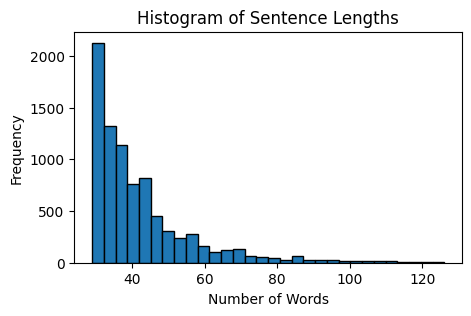

,Statistic,Value
0,Min,29.000000
1,Max,126.000000
2,Median,37.000000
3,Mode,30.000000
4,Mean,42.174694


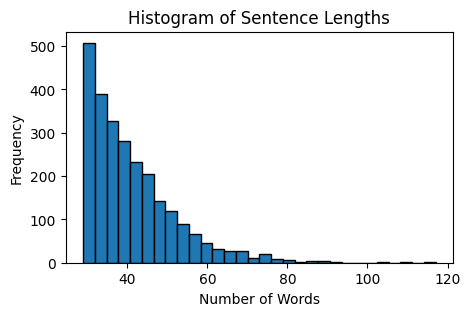

,Statistic,Value
0,Min,29.000000
1,Max,117.000000
2,Median,38.000000
3,Mode,29.000000
4,Mean,40.862745


In [ ]:
# Plot distribution and display table of passage length statistics
plot_passage_lengths(datasets['catalyst']['train'])
display_passage_stats(datasets['catalyst']['train'])
plot_passage_lengths(datasets['battery']['train'])
display_passage_stats(datasets['battery']['train'])

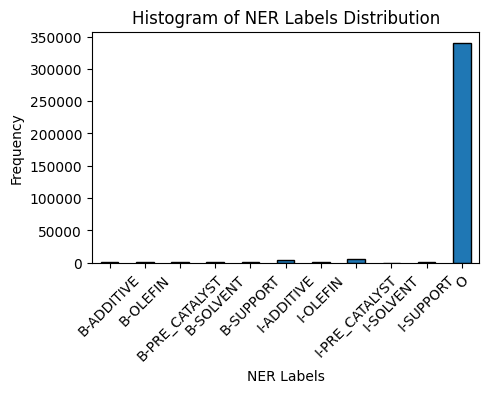

CATALYST,eval,train,val
Tag,,,
B-ADDITIVE,153,821,126
B-OLEFIN,356,1137,150
B-PRE_CATALYST,71,314,51
B-SOLVENT,131,352,50
B-SUPPORT,83,392,25
I-ADDITIVE,620,3785,669
I-OLEFIN,163,656,83
I-PRE_CATALYST,1350,6199,1041
I-SOLVENT,39,85,17


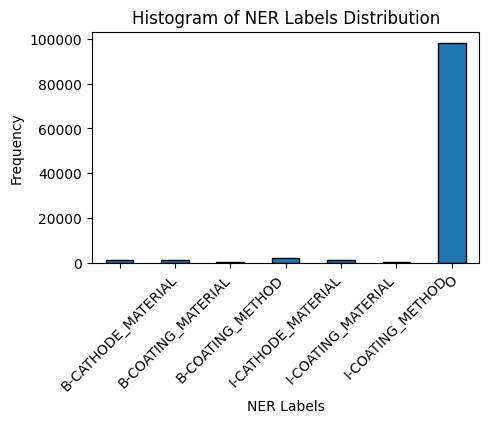

BATTERY,eval,train,val
Tag,,,
B-CATHODE_MATERIAL,402,1188,223
B-COATING_MATERIAL,359,1304,206
B-COATING_METHOD,134,352,57
I-CATHODE_MATERIAL,624,1872,362
I-COATING_MATERIAL,285,958,147
I-COATING_METHOD,91,212,34
O,28838,98314,16791


In [ ]:
# Plot distribution of label counts
plot_label_counts(datasets['catalyst']['train'])
# Generate counts for the catalyst dataset
catalyst_counts = display_label_counts(datasets['catalyst'])
# Create a DataFrame from the counts
catalyst_counts_df = pd.DataFrame(catalyst_counts, columns=['CATALYST', 'Tag', 'Count'])
# Pivot the DataFrame to have Split as the column hierarchy
catalyst_counts_pivot = catalyst_counts_df.pivot(index='Tag',
                                               columns='CATALYST',
                                               values='Count').fillna(0)
# Display the updated DataFrame
display(catalyst_counts_pivot)

print('\n')

# Plot distribution of label counts
plot_label_counts(datasets['battery']['train'])
# Generate counts for the battery dataset
battery_counts = display_label_counts(datasets['battery'])
# Create a DataFrame from the counts
battery_counts_df = pd.DataFrame(battery_counts, columns=['BATTERY', 'Tag', 'Count'])
# Pivot the DataFrame to have Split as the column hierarchy
battery_counts_pivot = battery_counts_df.pivot(index='Tag',
                                               columns='BATTERY',
                                               values='Count').fillna(0)
# Display the updated DataFrame
display(battery_counts_pivot)

In [ ]:
# Inspect Catalyst dataset
print('\n___CATALYST___')
print(f"Features:\n\t{datasets['catalyst']['val'].features.keys()}")
print(f"Example:\n\t{datasets['catalyst']['val'][113]}") # 101, 113 (19 for train)

# Inspect Catalyst labels
catalyst_label_list = sorted(list(set(tag for tags in datasets['catalyst']['val']['ner_tags'] for tag in tags)))
catalyst_label2id = create_label2id_mapping(datasets['catalyst']['val'])
catalyst_id2label = {id: label for label, id in catalyst_label2id.items()}
print(f"Catalyst labels:\n\t{catalyst_label2id}")

# Inspect Battery dataset
print('\n___BATTERY___')
print(f"Features:\n\t{datasets['battery']['val'].features.keys()}")
print(f"Example:\n\t{datasets['battery']['val'][18]}") # 18, 45 (19 for train)

# Inspect Battery labels
battery_label_list = sorted(list(set(tag for tags in datasets['battery']['val']['ner_tags'] for tag in tags)))
battery_label2id = create_label2id_mapping(datasets['battery']['val'])
battery_id2label = {id: label for label, id in battery_label2id.items()}
print(f"Battery labels:\n\t{battery_label2id}")



___CATALYST___
Features:
	dict_keys(['id', 'tokens', 'ner_tags', '__index_level_0__'])
Example:
	{'id': 7876, 'tokens': ['0', 'bar', 'ethylene', 'pressure', ',', '500', 'ml', 'n', '-', 'pentane', ',', '1', '.', '0', 'ml', 'TIBA', '(', '1', '.', '6', 'M', 'in', 'n', '-', 'hexane', ')', ',', '70', '?', 'C', ','], 'ner_tags': ['O', 'O', 'B-OLEFIN', 'O', 'O', 'O', 'O', 'B-SOLVENT', 'I-SOLVENT', 'I-SOLVENT', 'O', 'O', 'O', 'O', 'O', 'B-ADDITIVE', 'O', 'O', 'O', 'O', 'O', 'O', 'B-SOLVENT', 'I-SOLVENT', 'I-SOLVENT', 'O', 'O', 'O', 'O', 'O', 'O'], '__index_level_0__': 7876}
Catalyst labels:
	{'O': 0, 'B-ADDITIVE': 1, 'B-OLEFIN': 3, 'B-PRE_CATALYST': 5, 'B-SOLVENT': 7, 'B-SUPPORT': 9, 'I-ADDITIVE': 2, 'I-OLEFIN': 4, 'I-PRE_CATALYST': 6, 'I-SOLVENT': 8, 'I-SUPPORT': 10}

___BATTERY___
Features:
	dict_keys(['id', 'tokens', 'ner_tags', '__index_level_0__'])
Example:
	{'id': 2738, 'tokens': ['ALD', '-', 'ZnO', 'coated', 'NCM', '-', '523', 'has', 'a', 'high', 'discharge', 'capacity', 'of', '256', '

In [ ]:
# Update the NER datasets with analogous integer labels
datasets['catalyst']['train'] = datasets['catalyst']['train'].map(lambda x: add_ner_ids(x, catalyst_label2id))
datasets['catalyst']['val'] = datasets['catalyst']['val'].map(lambda x: add_ner_ids(x, catalyst_label2id))
datasets['catalyst']['eval'] = datasets['catalyst']['eval'].map(lambda x: add_ner_ids(x, catalyst_label2id))
datasets['battery']['train'] = datasets['battery']['train'].map(lambda x: add_ner_ids(x, battery_label2id))
datasets['battery']['val'] = datasets['battery']['val'].map(lambda x: add_ner_ids(x, battery_label2id))
datasets['battery']['eval'] = datasets['battery']['eval'].map(lambda x: add_ner_ids(x, battery_label2id))

Map:   0%|          | 0/8409 [00:00<?, ? examples/s]

Map:   0%|          | 0/1485 [00:00<?, ? examples/s]

Map:   0%|          | 0/2550 [00:00<?, ? examples/s]

Map:   0%|          | 0/450 [00:00<?, ? examples/s]

# 6. Modeling pipeline

## Setup pipeline

In [ ]:
# Specify constants

MAX_LEN = 256
LABEL_PAD_TOKEN_ID = -100

DENSE_SIZE = 256
DROPOUT = 0.1
WEIGHT_DECAY = 0.01

RANDOM_SEEDS = [5, 31, 121]
NUM_EPOCHS = 3

In [ ]:
# Function to run models
def run_models(checkpoint='bert-base-cased', # ['bert-base-cased', 'allenai/scibert_scivocab_cased', 'SpanBERT/spanbert-base-cased', 'dmis-lab/biobert-base-cased-v1.2']
               name_prefix='C_',
               dataset='battery', # ['battery', 'catalyst']
               train_strategy='all', # ['none', 'some', 'all']
               retrain_layers=[],
               feedforward_strategies=['last', 'concat'],
               concat_layers=[8,9,10,11],
               batch_sizes=[16,32],
               init_lrs=[2e-5,5e-5]):

    global TOKENIZER
    TOKENIZER = AutoTokenizer.from_pretrained(checkpoint)

    if checkpoint == 'bert-base-cased':
        model_name = name_prefix + 'basebert'
    elif checkpoint == 'allenai/scibert_scivocab_cased':
        model_name = name_prefix + 'scibert'
    elif checkpoint == 'SpanBERT/spanbert-base-cased':
        model_name = name_prefix + 'spanbert'
    elif checkpoint == 'dmis-lab/biobert-base-cased-v1.2':
        model_name = name_prefix + 'biobert'

    if dataset == 'battery':
        battery_train = datasets['battery']['train'].map(tokenize_and_align_labels, batched=True)
        battery_val = datasets['battery']['val'].map(tokenize_and_align_labels, batched=True)
        battery_eval = datasets['battery']['eval'].map(tokenize_and_align_labels, batched=True)
        tf_battery_train, tf_battery_val, tf_battery_eval = prepare_tf_datasets(
            battery_train, battery_val, battery_eval, TOKENIZER)
        hf_train, hf_val, hf_eval = battery_train, battery_val, battery_eval
        tf_train, tf_val, tf_eval = tf_battery_train, tf_battery_val, tf_battery_eval
        NUM_SAMPLES = len(battery_train)
        LABEL_LIST = battery_label_list
        ID2LABEL = battery_id2label
        LABEL2ID = battery_label2id
    elif dataset == 'catalyst':
        catalyst_train = datasets['catalyst']['train'].map(tokenize_and_align_labels, batched=True)
        catalyst_val = datasets['catalyst']['val'].map(tokenize_and_align_labels, batched=True)
        catalyst_eval = datasets['catalyst']['eval'].map(tokenize_and_align_labels, batched=True)
        tf_catalyst_train, tf_catalyst_val, tf_catalyst_eval = prepare_tf_datasets(
            catalyst_train, catalyst_val, catalyst_eval, TOKENIZER)
        hf_train, hf_val, hf_eval = catalyst_train, catalyst_val, catalyst_eval
        tf_train, tf_val, tf_eval = tf_catalyst_train, tf_catalyst_val, tf_catalyst_eval
        NUM_SAMPLES = len(catalyst_train)
        LABEL_LIST = catalyst_label_list
        ID2LABEL = catalyst_id2label
        LABEL2ID = catalyst_label2id

    global NUM_CLASSES
    NUM_CLASSES = len(LABEL_LIST)

    # Create a list to store all models' scores
    all_scores = []

    for ff_strategy in feedforward_strategies:

        for batch_size in batch_sizes:

            for init_lr in init_lrs:

                for i, seed in enumerate(RANDOM_SEEDS):

                    # Update the model name
                    model_replicate_name = f"{model_name}_{dataset}_{train_strategy}_{ff_strategy}_{batch_size}_{init_lr}_r{i+1}"

                    # Clean memory of prior models
                    tf.keras.backend.clear_session()

                    # Set seed for random initializations
                    tf.keras.utils.set_random_seed(seed)

                    print(f"""
                    ======================================================================
                    ======================================================================
                    \t\t{model_replicate_name}
                    ======================================================================
                    ======================================================================""")

                    # Load the BERT model
                    bert_config = BertConfig.from_pretrained(
                        checkpoint,
                        output_hidden_states=True)
                    bert_model = TFBertModel.from_pretrained(
                        checkpoint,
                        config=bert_config, from_pt=True)

                    # Specify procedure for retraining BERT layers
                    if train_strategy == 'none':
                        # Freeze all BERT layers
                        bert_model.trainable = False
                    elif train_strategy == 'all':
                        # Unfreeze all BERT layers
                        bert_model.trainable = True
                    elif train_strategy == 'some':
                        # Specify which layers to unfreeze
                        # eg. retrain all layers:  RETRAIN_LAYERS=list(range(12))
                        # eg. retrain last 4 layers:  [8,9,10,11]
                        for i, layer in enumerate(bert_model.bert.encoder.layer):
                            if i in retrain_layers:
                                layer.trainable = True
                            else:
                                layer.trainable = False

                    # Input layer
                    input_ids = tf.keras.layers.Input(
                        shape=(MAX_LEN,),
                        dtype=tf.int32,
                        name='input_ids')
                    token_type_ids = tf.keras.layers.Input(
                        shape=(MAX_LEN,),
                        dtype=tf.int32,
                        name='token_type_ids')
                    attention_mask = tf.keras.layers.Input(
                        shape=(MAX_LEN,),
                        dtype=tf.int32,
                        name='attention_mask')
                    bert_inputs = {
                        'input_ids': input_ids,
                        'token_type_ids': token_type_ids,
                        'attention_mask': attention_mask}

                    # BERT outputs
                    bert_outputs = bert_model(bert_inputs)

                    # Specify architecture for classification head
                    if ff_strategy == 'last':
                        # Directly use last hidden layer
                        bert_output = bert_outputs['hidden_states'][11]
                        hidden_layer = tf.keras.layers.Dense(
                            DENSE_SIZE, activation='relu',
                            name='hidden_layer')(bert_output)
                    elif ff_strategy == 'concat':
                        """# Concatenate specified layers and feed directly into a dense layer
                        selected_layers = [bert_outputs['hidden_states'][i] for i in concat_layers]
                        bert_output = tf.keras.layers.Concatenate(
                            axis=-1,name='concat_layer')(selected_layers)
                        hidden_layer = tf.keras.layers.Dense(
                            DENSE_SIZE,
                            activation='relu',
                            name='hidden_layer')(bert_output)"""
                        # Concatenate specified layers and feed into 1 BiLSTM then a dense layer
                        selected_layers = [bert_outputs['hidden_states'][i] for i in concat_layers]
                        bert_output = tf.keras.layers.Concatenate(
                            axis=-1, name='concat_layer')(selected_layers)
                        bilstm_layer = tf.keras.layers.Bidirectional(
                            tf.keras.layers.LSTM(768, return_sequences=True),
                            name='bilstm_layer')(bert_output)
                        hidden_layer = tf.keras.layers.Dense(
                            DENSE_SIZE,
                            activation='relu',
                            name='hidden_layer')(bilstm_layer)
                        """# Concatenate specified layers and feed into 2 BiLSTM then a dense layer
                        selected_layers = [bert_outputs['hidden_states'][i] for i in concat_layers]
                        bert_output = tf.keras.layers.Concatenate(
                            axis=-1, name='concat_layer')(selected_layers)
                        bilstm_layer1 = tf.keras.layers.Bidirectional(
                            tf.keras.layers.LSTM(768, return_sequences=True),
                            name='bilstm1_layer')(bert_output)
                        bilstm_layer2 = tf.keras.layers.Bidirectional(
                            tf.keras.layers.LSTM(768, return_sequences=True),
                            name='bilstm2_layer')(bilstm_layer1)
                        hidden_layer = tf.keras.layers.Dense(
                            DENSE_SIZE,
                            activation='relu',
                            name='hidden_layer')(bilstm_layer2)"""

                    # Add a dropout layer
                    dropout_layer = tf.keras.layers.Dropout(
                        DROPOUT,
                        name='dropout_layer')(hidden_layer)

                    # Output layer for classification
                    # NOTE: specify activation for the final output layer (predictions will be probabilities not logits)
                    output_layer = tf.keras.layers.Dense(
                        NUM_CLASSES,
                        activation='softmax',
                        name='labels')(dropout_layer)

                    # Define losses and their weights
                    losses = {
                        "labels": hf_ner_loss}
                    lossWeights = {
                        "labels": 1.0}

                    # Build and compile the model
                    model = tf.keras.Model(
                        inputs=bert_inputs,
                        outputs=output_layer,
                        name=model_replicate_name)

                    # Specify the optimizer
                    optimizer, _ = create_optimizer(
                        init_lr=init_lr,
                        num_train_steps=(NUM_SAMPLES // batch_size) * NUM_EPOCHS,
                        weight_decay_rate=WEIGHT_DECAY,
                        num_warmup_steps=0.1*((NUM_SAMPLES // batch_size) * NUM_EPOCHS))

                    # Compile the model with the defined losses and optimizer
                    model.compile(
                        optimizer=optimizer,
                        metrics=[custom_acc_orig_tokens, custom_acc_orig_non_other_tokens],
                        loss=losses)

                    # Display the model architecture
                    """tf.keras.utils.plot_model(
                        model,
                        to_file=f'{model_replicate_name}.png',
                        show_shapes=False,
                        show_layer_names=True,
                        dpi=90)
                    display(Image(filename=f'{model_replicate_name}.png'))"""

                    # Show the model summary
                    """model.summary()"""

                    # Define a custom callback for seqeval metrics
                    metric_callback = KerasMetricCallback(
                        metric_fn=lambda p: compute_metrics(p, LABEL_LIST),
                        eval_dataset=tf_val)

                    # Train and evaluate the model
                    history = model.fit(
                        tf_train,
                        validation_data=tf_val,
                        epochs=NUM_EPOCHS,
                        batch_size=batch_size,
                        callbacks=[metric_callback])

                    # Plot model metrics as subplots
                    plot_metrics(history)

                    # Predict labels from datasets
                    train_predictions = save_predictions(
                        model, tf_train, hf_train, TOKENIZER, ID2LABEL,
                        model_replicate_name+'_train_predictions.json', upload_choice=True)
                    val_predictions = save_predictions(
                        model, tf_val, hf_val, TOKENIZER, ID2LABEL,
                        model_replicate_name+'_val_predictions.json', upload_choice=True)
                    eval_predictions = save_predictions(
                        model, tf_eval, hf_eval, TOKENIZER, ID2LABEL,
                        model_replicate_name+'_eval_predictions.json', upload_choice=True)

                    # Store predictions as dictionaries
                    """passage_predictions = {
                        'train': train_predictions,
                        'val': val_predictions,
                        'eval': eval_predictions}"""

                    # Convert predictions from list of dicts to dict of lists
                    """train_pred_dict = convert_predictions_to_dict(train_predictions)
                    val_pred_dict = convert_predictions_to_dict(val_predictions)"""
                    eval_pred_dict = convert_predictions_to_dict(eval_predictions)

                    # Compute MCC score
                    mcc_score_train = compute_MCC.compute_MCC_jsonl(
                        hf_train, train_predictions, id_col='id')
                    mcc_score_val = compute_MCC.compute_MCC_jsonl(
                        hf_val, val_predictions, id_col='id')
                    mcc_score_eval = compute_MCC.compute_MCC_jsonl(
                        hf_eval, eval_predictions, id_col='id')

                    # Compute Seqeval scores
                    seqeval_scores_train = compute_seqeval.compute_seqeval_jsonl(
                        hf_train, train_predictions, id_col='id')
                    seqeval_scores_val = compute_seqeval.compute_seqeval_jsonl(
                        hf_val, val_predictions, id_col='id')
                    seqeval_scores_eval = compute_seqeval.compute_seqeval_jsonl(
                        hf_eval, eval_predictions, id_col='id')

                    # Display final evaluation metrics
                    print("\nFinal evaluation metrics for train set")
                    scores_train = display_metrics_details(mcc_score_train, seqeval_scores_train, show=False)
                    print("\nFinal evaluation metrics for validation set")
                    scores_val = display_metrics_details(mcc_score_val, seqeval_scores_val, show=False)
                    print("\nFinal evaluation metrics for evaluation set")
                    scores_eval = display_metrics_details(mcc_score_eval, seqeval_scores_eval, show=True)

                    # Store scores as dataframes
                    scores = {
                        'train': scores_train,
                        'val': scores_val,
                        'eval': scores_eval}

                    # Save the evaluation metrics
                    save_metrics_details(
                        scores_train, model_replicate_name+'_train_scores', upload_choice=False)
                    save_metrics_details(
                        scores_val, model_replicate_name+'_val_scores', upload_choice=False)
                    save_metrics_details(
                        scores_eval, model_replicate_name+'_eval_scores', upload_choice=False)

                    # Generate confusion matrix for the evaluation split
                    plot_confusion_matrix(hf_eval, eval_pred_dict, LABEL_LIST)

                    # Inspect passages with mismatched tokens for the evaluation split
                    display_mismatched_passages(hf_eval, eval_pred_dict, N=5)

                    # Append the model data to all_models
                    model_data = {
                        'model_prefix': model_name,
                        'dataset': dataset,
                        'train_strategy': train_strategy,
                        'ff_strategy': ff_strategy,
                        'batch_size': batch_size,
                        'init_lr': init_lr,
                        'replicate': i+1,
                        'scores': scores}
                    all_scores.append(model_data)

    # Save all_scores to local workspace
    with open(f"{model_name}_{dataset}_{train_strategy}_scores.pkl", 'wb') as f:
        pickle.dump(all_scores, f)

    # Upload all_Scores file to GitHub
    save_pickle(all_scores, f"{model_name}_{dataset}_{train_strategy}_scores", upload_choice=True)

    return all_scores

## SpanBERT

### battery_feature-based

In [ ]:
# Battery dataset -- feature-based appraoch w/ concatenation of last 4 hidden layers (9 hyperparameter combinations)

start_time = timeit.default_timer()

spanbert_models1 = run_models(
    checkpoint='SpanBERT/spanbert-base-cased',
    name_prefix='B_',
    dataset='battery',
    train_strategy='none', # ['none', 'some', 'all']
    retrain_layers=list(range(12)),  # []
    feedforward_strategies=['concat'],  # ['last', 'concat']
    concat_layers=[8,9,10,11],
    batch_sizes=[16,32,64], # [16,32,64]
    init_lrs=[2e-5,5e-5,8e-5]) # [2e-5,5e-5,8e-5]


elapsed = timeit.default_timer() - start_time
print(f"\n\n{elapsed} seconds")
# A100:  5960s/27replicates = 3.7mins/replicate

### battery_fine-tune(1-layer)

In [ ]:
# Battery dataset -- fine-tune appraoch w/ last hidden layer (9 hyperparameter combinations)

start_time = timeit.default_timer()

spanbert_models2 = run_models(
    checkpoint='SpanBERT/spanbert-base-cased',
    name_prefix='B_',
    dataset='battery',
    train_strategy='all', # ['none', 'some', 'all']
    retrain_layers=list(range(12)),  # []
    feedforward_strategies=['last'],  # ['last', 'concat']
    concat_layers=[8,9,10,11],
    batch_sizes=[16,32,64], # [16,32,64]
    init_lrs=[2e-5,5e-5,8e-5]) # [2e-5,5e-5,8e-5]


elapsed = timeit.default_timer() - start_time
print(f"\n\n{elapsed} seconds")
# A100:  7406s/27replicates = 4.6min/replicate

### catalyst_feature-based

In [ ]:
# Catalyst dataset -- feature-based appraoch w/ concatenation of last 4 hidden layers (9 hyperparameter combinations)

start_time = timeit.default_timer()

spanbert_models3 = run_models(
    checkpoint='SpanBERT/spanbert-base-cased',
    name_prefix='B_',
    dataset='catalyst',
    train_strategy='none', # ['none', 'some', 'all']
    retrain_layers=list(range(12)),  # []
    feedforward_strategies=['concat'],  # ['last', 'concat']
    concat_layers=[8,9,10,11],
    batch_sizes=[16,32,64], # [16,32,64]
    init_lrs=[2e-5,5e-5,8e-5]) # [2e-5,5e-5,8e-5]


elapsed = timeit.default_timer() - start_time
print(f"\n\n{elapsed} seconds")
# A100:  14846s/27replicates = 9.1min/replicate

### catalyst_fine-tune(1-layer)

In [ ]:
# Catalyst dataset -- fine-tune appraoch w/ last hidden layer (9 hyperparameter combinations)

start_time = timeit.default_timer()

spanbert_models4 = run_models(
    checkpoint='SpanBERT/spanbert-base-cased',
    name_prefix='B_',
    dataset='catalyst',
    train_strategy='all', # ['none', 'some', 'all']
    retrain_layers=list(range(12)),  # []
    feedforward_strategies=['last'],  # ['last', 'concat']
    concat_layers=[8,9,10,11],
    batch_sizes=[16,32,64], # [16,32,64]
    init_lrs=[2e-5,5e-5,8e-5]) # [2e-5,5e-5,8e-5]


elapsed = timeit.default_timer() - start_time
print(f"\n\n{elapsed} seconds")
# A100:  18579s/27replicates = 11.5min/replicate

### battery_fine-tune(4-layer)

config.json:   0%|          | 0.00/413 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

Map:   0%|          | 0/2550 [00:00<?, ? examples/s]

Map:   0%|          | 0/450 [00:00<?, ? examples/s]

Map:   0%|          | 0/750 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/datasets/arrow_dataset.py:410: FutureWarning: The output of `to_tf_dataset` will change when a passing single element list for `labels` or `columns` in the next datasets version. To return a tuple structure rather than dict, pass a single string.
Old behaviour: columns=['a'], labels=['labels'] -> (tf.Tensor, tf.Tensor)  
             : columns='a', labels='labels' -> (tf.Tensor, tf.Tensor)  
New behaviour: columns=['a'],labels=['labels'] -> ({'a': tf.Tensor}, {'labels': tf.Tensor})  
             : columns='a', labels='labels' -> (tf.Tensor, tf.Tensor) 
  warnings.warn(



                    		C_spanbert_battery_all_concat_16_2e-05_r1


pytorch_model.bin:   0%|          | 0.00/215M [00:00<?, ?B/s]

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 216ms/step - loss: 0.4389 - custom_acc_orig_tokens: 0.8790 - custom_acc_orig_non_other_tokens: 0.0753 - val_loss: 0.1408 - val_custom_acc_orig_tokens: 0.9597 - val_custom_acc_orig_non_other_tokens: 0.3147 - precision: 0.9518 - recall: 0.9634 - f1: 0.9576 - accuracy: 0.9599
Epoch 2/3
160/160 [==============================] - 25s 153ms/step - loss: 0.1159 - custom_acc_orig_tokens: 0.9660 - custom_acc_orig_non_other_tokens: 0.5008 - val_loss: 0.0891 - val_custom_acc_orig_tokens: 0.9730 - val_custom_acc_orig_non_other_tokens: 0.6344 - precision: 0.9678 - recall: 0.9718 - f1: 0.9698 - accuracy: 0.9722
Epoch 3/3
160/160 [==============================] - 24s 153ms/step - loss: 0.0830 - custom_acc_orig_tokens: 0.9743 - custom_acc_orig_non_other_tokens: 0.6487 - val_loss: 0.0824 - val_custom_acc_orig_tokens: 0.9750 - val_custom_acc_orig_non_other_tokens: 0.7580 - precision: 0.9721 - recall: 0.9712 - f1: 0.9717 - accuracy: 0.9742


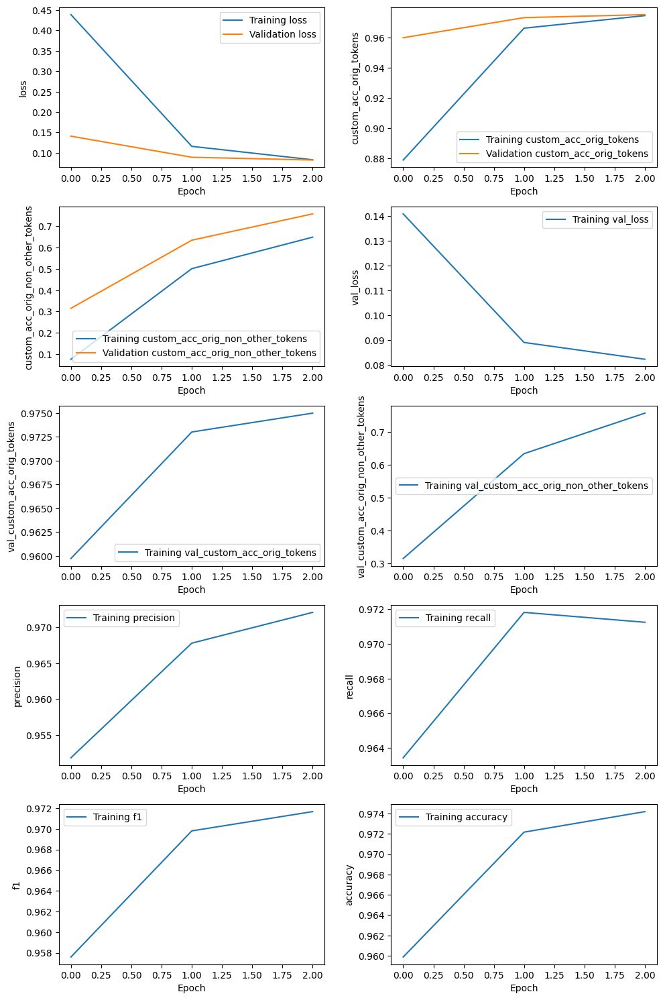

160/160 [==============================] - 13s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r1_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.621,0.774,0.689,420,,
COATING_MATERIAL,0.492,0.682,0.572,359,,
COATING_METHOD,0.878,0.269,0.411,134,,
OVERALL,0.571,0.664,0.614,,0.968,0.734


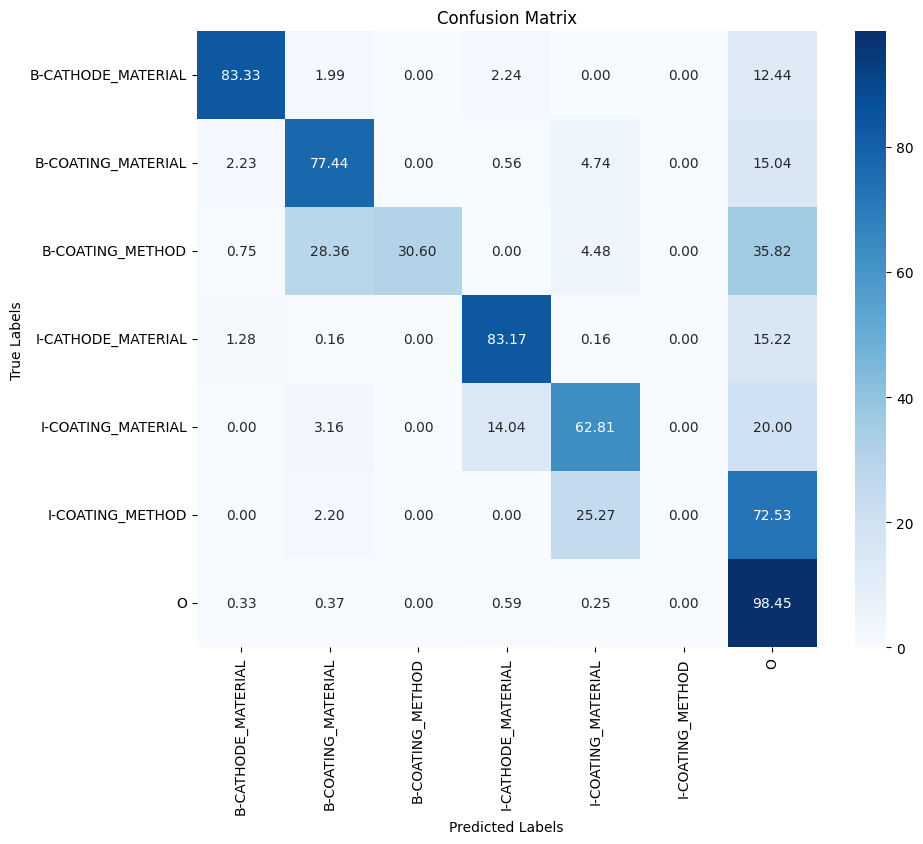

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 53s 215ms/step - loss: 0.4109 - custom_acc_orig_tokens: 0.8904 - custom_acc_orig_non_other_tokens: 0.0979 - val_loss: 0.1309 - val_custom_acc_orig_tokens: 0.9648 - val_custom_acc_orig_non_other_tokens: 0.4921 - precision: 0.9590 - recall: 0.9641 - f1: 0.9616 - accuracy: 0.9643
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.1096 - custom_acc_orig_tokens: 0.9673 - custom_acc_orig_non_other_tokens: 0.5292 - val_loss: 0.0846 - val_custom_acc_orig_tokens: 0.9751 - val_custom_acc_orig_non_other_tokens: 0.6677 - precision: 0.9710 - recall: 0.9736 - f1: 0.9723 - accuracy: 0.9744
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0793 - custom_acc_orig_tokens: 0.9764 - custom_acc_orig_non_other_tokens: 0.6908 - val_loss: 0.0789 - val_custom_acc_orig_tokens: 0.9765 - val_custom_acc_orig_non_other_tokens: 0.7737 - precision: 0.9736 - recall: 0.9732 - f1: 0.9734 - accuracy: 0.9757


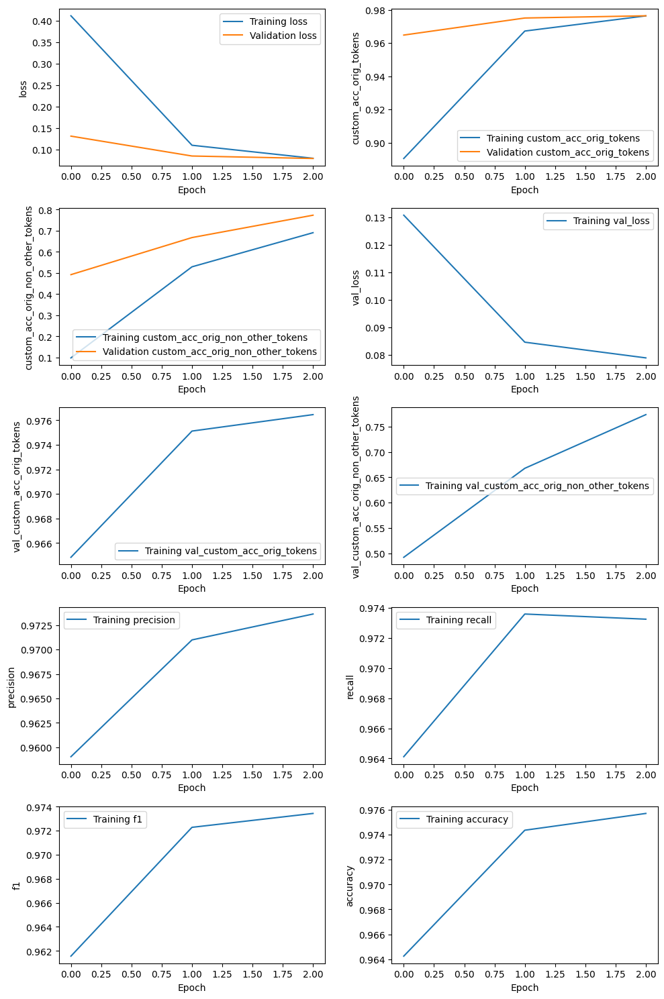

160/160 [==============================] - 12s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r2_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.629,0.748,0.683,420,,
COATING_MATERIAL,0.519,0.719,0.603,359,,
COATING_METHOD,0.855,0.485,0.619,134,,
OVERALL,0.594,0.698,0.642,,0.969,0.745


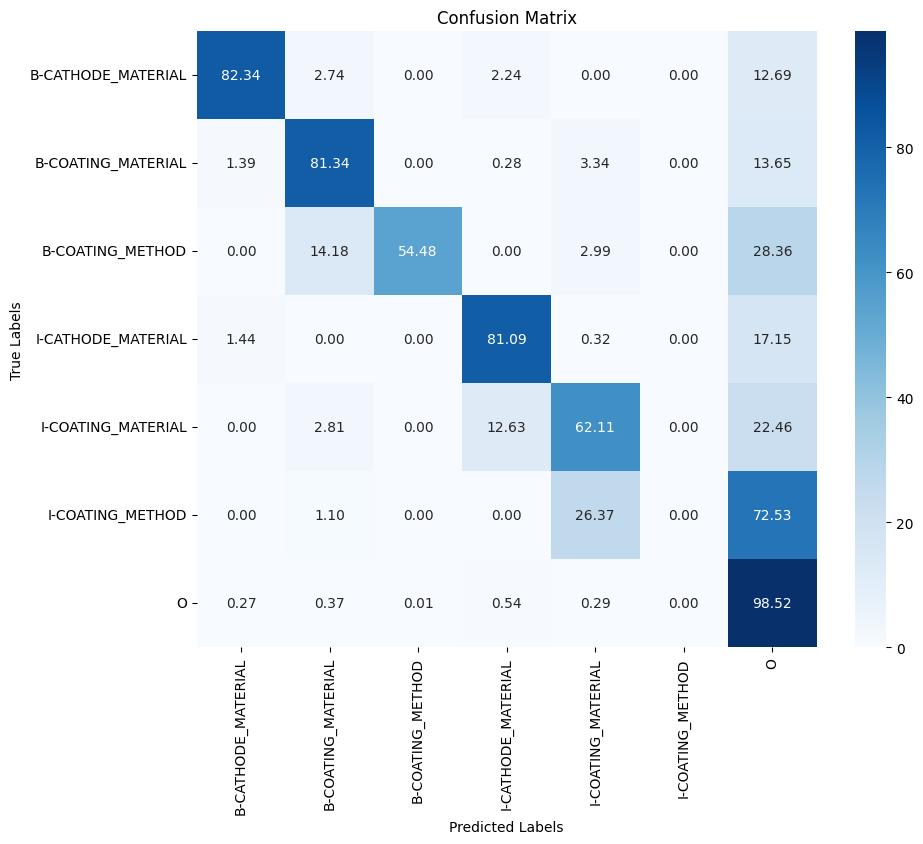

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 54s 216ms/step - loss: 0.4056 - custom_acc_orig_tokens: 0.8928 - custom_acc_orig_non_other_tokens: 0.1013 - val_loss: 0.1324 - val_custom_acc_orig_tokens: 0.9631 - val_custom_acc_orig_non_other_tokens: 0.4367 - precision: 0.9559 - recall: 0.9639 - f1: 0.9599 - accuracy: 0.9625
Epoch 2/3
160/160 [==============================] - 25s 154ms/step - loss: 0.1121 - custom_acc_orig_tokens: 0.9672 - custom_acc_orig_non_other_tokens: 0.5193 - val_loss: 0.0859 - val_custom_acc_orig_tokens: 0.9749 - val_custom_acc_orig_non_other_tokens: 0.6707 - precision: 0.9699 - recall: 0.9738 - f1: 0.9719 - accuracy: 0.9741
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0811 - custom_acc_orig_tokens: 0.9755 - custom_acc_orig_non_other_tokens: 0.6680 - val_loss: 0.0819 - val_custom_acc_orig_tokens: 0.9763 - val_custom_acc_orig_non_other_tokens: 0.7916 - precision: 0.9731 - recall: 0.9727 - f1: 0.9729 - accuracy: 0.9755


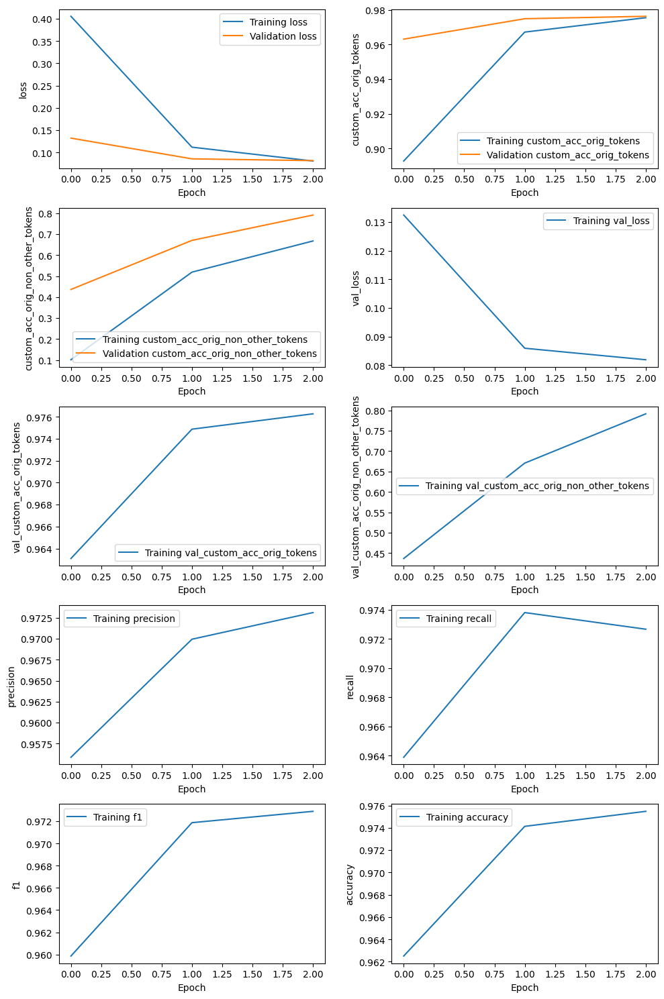

160/160 [==============================] - 14s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_2e-05_r3_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.616,0.771,0.685,420,,
COATING_MATERIAL,0.505,0.705,0.588,359,,
COATING_METHOD,0.817,0.433,0.566,134,,
OVERALL,0.578,0.696,0.632,,0.968,0.739


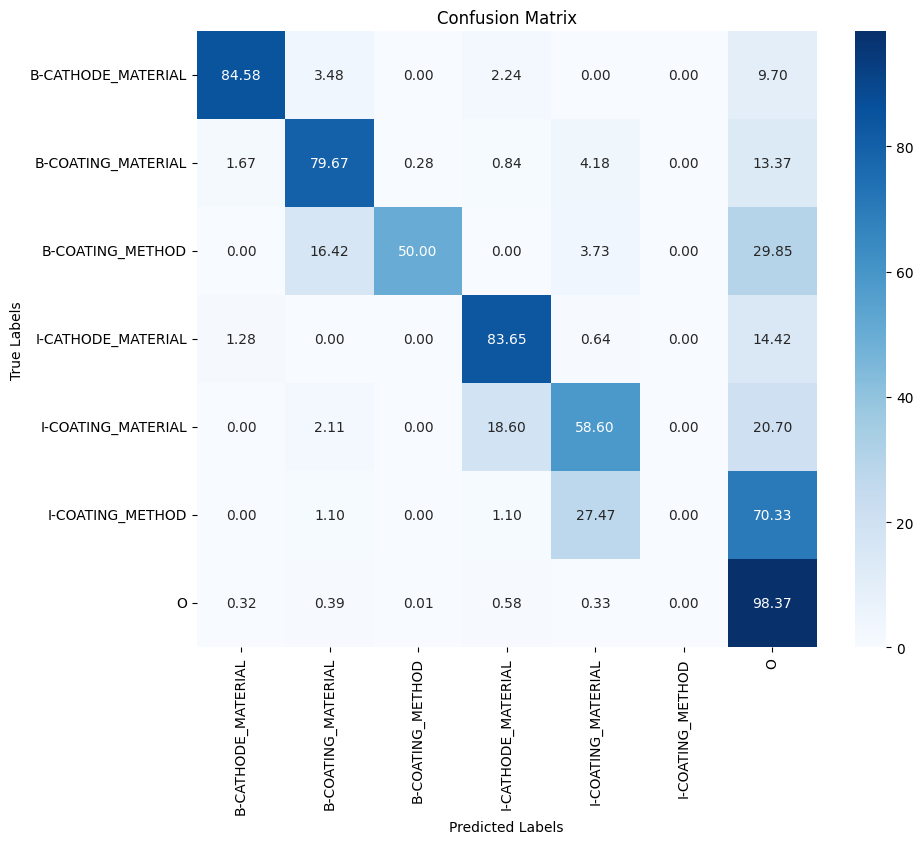

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 53s 214ms/step - loss: 0.3300 - custom_acc_orig_tokens: 0.9083 - custom_acc_orig_non_other_tokens: 0.2466 - val_loss: 0.0912 - val_custom_acc_orig_tokens: 0.9725 - val_custom_acc_orig_non_other_tokens: 0.6781 - precision: 0.9674 - recall: 0.9712 - f1: 0.9693 - accuracy: 0.9717
Epoch 2/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0715 - custom_acc_orig_tokens: 0.9771 - custom_acc_orig_non_other_tokens: 0.7260 - val_loss: 0.0541 - val_custom_acc_orig_tokens: 0.9823 - val_custom_acc_orig_non_other_tokens: 0.8096 - precision: 0.9795 - recall: 0.9817 - f1: 0.9806 - accuracy: 0.9818
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0448 - custom_acc_orig_tokens: 0.9855 - custom_acc_orig_non_other_tokens: 0.8440 - val_loss: 0.0535 - val_custom_acc_orig_tokens: 0.9815 - val_custom_acc_orig_non_other_tokens: 0.8716 - precision: 0.9811 - recall: 0.9786 - f1: 0.9799 - accuracy: 0.9809


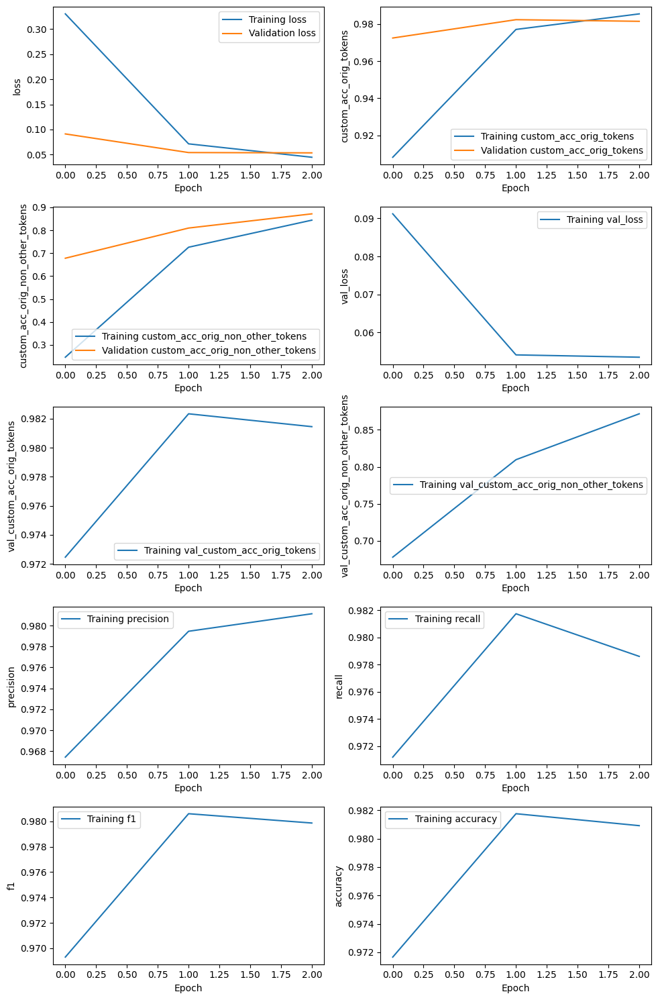

160/160 [==============================] - 12s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r1_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.690,0.829,0.753,420,,
COATING_MATERIAL,0.676,0.830,0.745,359,,
COATING_METHOD,0.734,0.701,0.718,134,,
OVERALL,0.690,0.811,0.745,,0.978,0.822


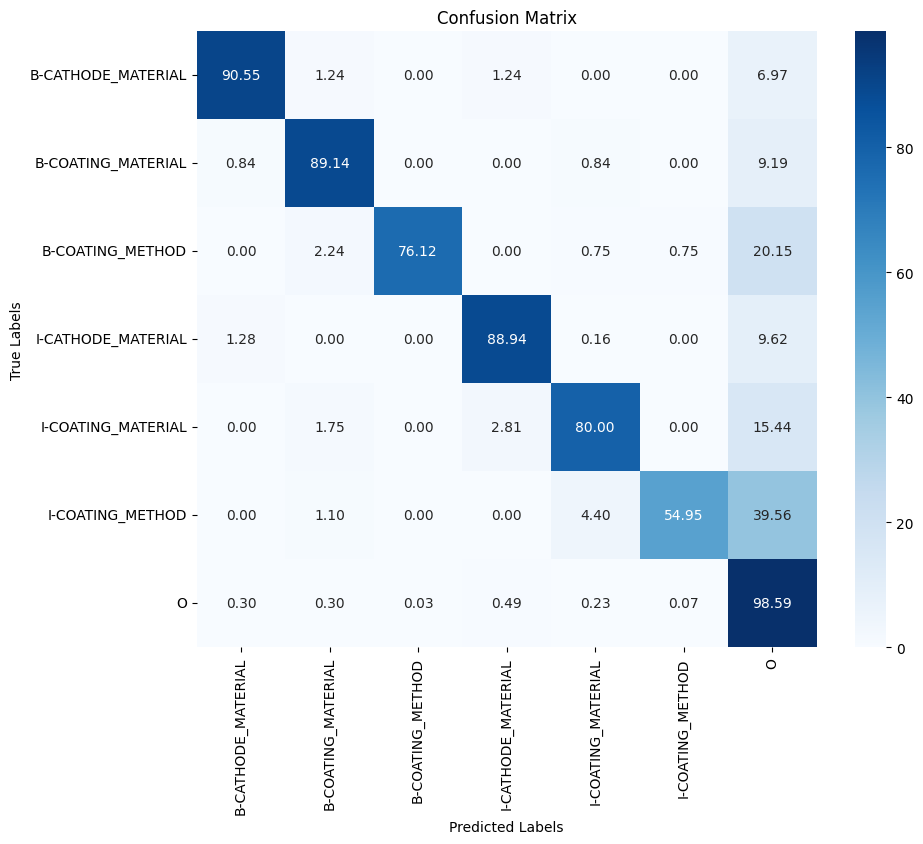

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relative

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 216ms/step - loss: 0.3135 - custom_acc_orig_tokens: 0.9160 - custom_acc_orig_non_other_tokens: 0.2570 - val_loss: 0.0892 - val_custom_acc_orig_tokens: 0.9741 - val_custom_acc_orig_non_other_tokens: 0.6996 - precision: 0.9692 - recall: 0.9726 - f1: 0.9709 - accuracy: 0.9733
Epoch 2/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0711 - custom_acc_orig_tokens: 0.9772 - custom_acc_orig_non_other_tokens: 0.7276 - val_loss: 0.0555 - val_custom_acc_orig_tokens: 0.9823 - val_custom_acc_orig_non_other_tokens: 0.7981 - precision: 0.9792 - recall: 0.9823 - f1: 0.9807 - accuracy: 0.9817
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0449 - custom_acc_orig_tokens: 0.9850 - custom_acc_orig_non_other_tokens: 0.8369 - val_loss: 0.0533 - val_custom_acc_orig_tokens: 0.9821 - val_custom_acc_orig_non_other_tokens: 0.8568 - precision: 0.9808 - recall: 0.9805 - f1: 0.9806 - accuracy: 0.9816


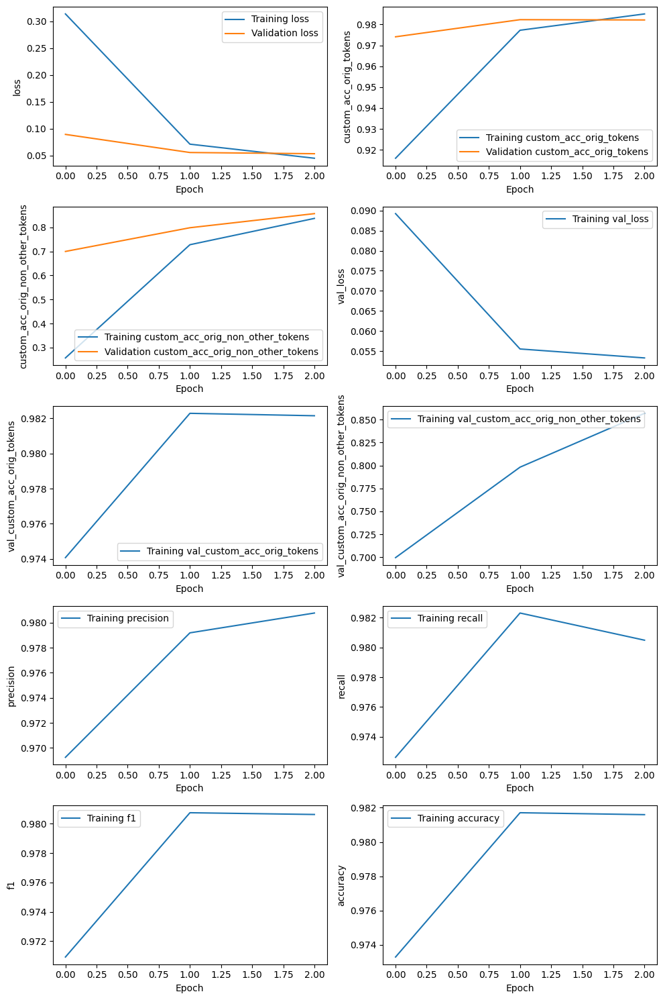

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r2_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.703,0.833,0.763,420,,
COATING_MATERIAL,0.655,0.811,0.725,359,,
COATING_METHOD,0.662,0.642,0.652,134,,
OVERALL,0.678,0.796,0.732,,0.977,0.816


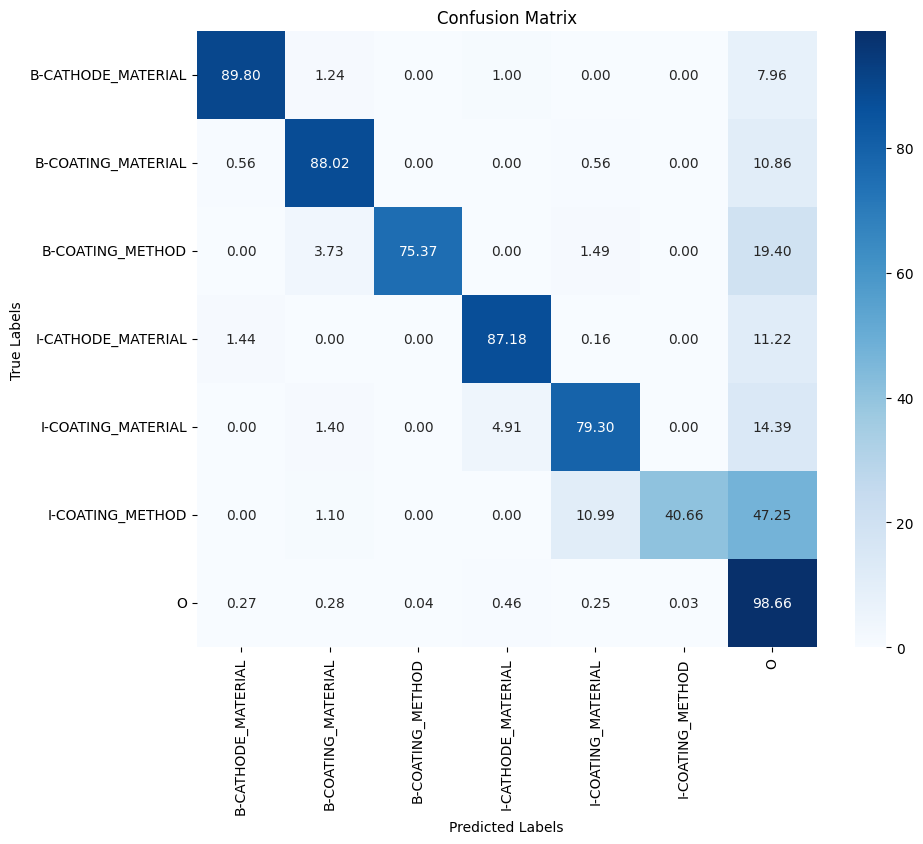

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relative

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 54s 221ms/step - loss: 0.3119 - custom_acc_orig_tokens: 0.9172 - custom_acc_orig_non_other_tokens: 0.2533 - val_loss: 0.0896 - val_custom_acc_orig_tokens: 0.9750 - val_custom_acc_orig_non_other_tokens: 0.6991 - precision: 0.9701 - recall: 0.9742 - f1: 0.9721 - accuracy: 0.9742
Epoch 2/3
160/160 [==============================] - 25s 153ms/step - loss: 0.0725 - custom_acc_orig_tokens: 0.9769 - custom_acc_orig_non_other_tokens: 0.7211 - val_loss: 0.0555 - val_custom_acc_orig_tokens: 0.9822 - val_custom_acc_orig_non_other_tokens: 0.7932 - precision: 0.9790 - recall: 0.9823 - f1: 0.9807 - accuracy: 0.9816
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0463 - custom_acc_orig_tokens: 0.9851 - custom_acc_orig_non_other_tokens: 0.8352 - val_loss: 0.0540 - val_custom_acc_orig_tokens: 0.9822 - val_custom_acc_orig_non_other_tokens: 0.8721 - precision: 0.9814 - recall: 0.9795 - f1: 0.9804 - accuracy: 0.9816


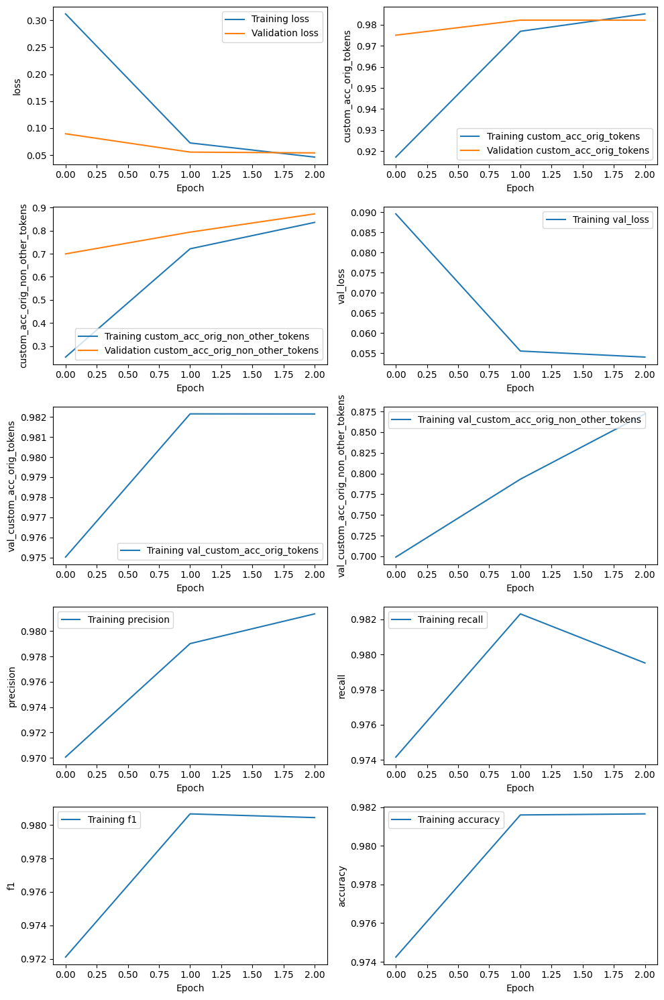

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_5e-05_r3_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.708,0.824,0.761,420,,
COATING_MATERIAL,0.610,0.819,0.699,359,,
COATING_METHOD,0.634,0.619,0.626,134,,
OVERALL,0.656,0.792,0.718,,0.977,0.814


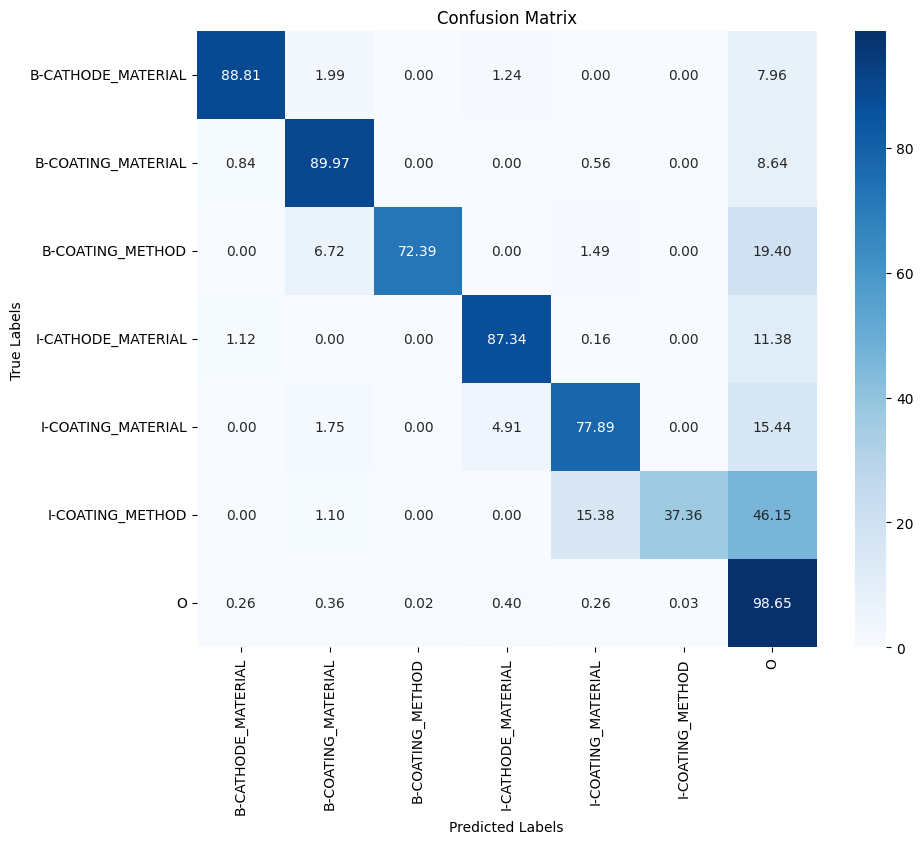

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-COATING_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relative

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 217ms/step - loss: 0.2898 - custom_acc_orig_tokens: 0.9203 - custom_acc_orig_non_other_tokens: 0.3302 - val_loss: 0.0742 - val_custom_acc_orig_tokens: 0.9769 - val_custom_acc_orig_non_other_tokens: 0.7418 - precision: 0.9721 - recall: 0.9775 - f1: 0.9748 - accuracy: 0.9762
Epoch 2/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0591 - custom_acc_orig_tokens: 0.9803 - custom_acc_orig_non_other_tokens: 0.7814 - val_loss: 0.0486 - val_custom_acc_orig_tokens: 0.9838 - val_custom_acc_orig_non_other_tokens: 0.8389 - precision: 0.9817 - recall: 0.9828 - f1: 0.9822 - accuracy: 0.9833
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0353 - custom_acc_orig_tokens: 0.9885 - custom_acc_orig_non_other_tokens: 0.8895 - val_loss: 0.0488 - val_custom_acc_orig_tokens: 0.9829 - val_custom_acc_orig_non_other_tokens: 0.8859 - precision: 0.9829 - recall: 0.9805 - f1: 0.9817 - accuracy: 0.9824


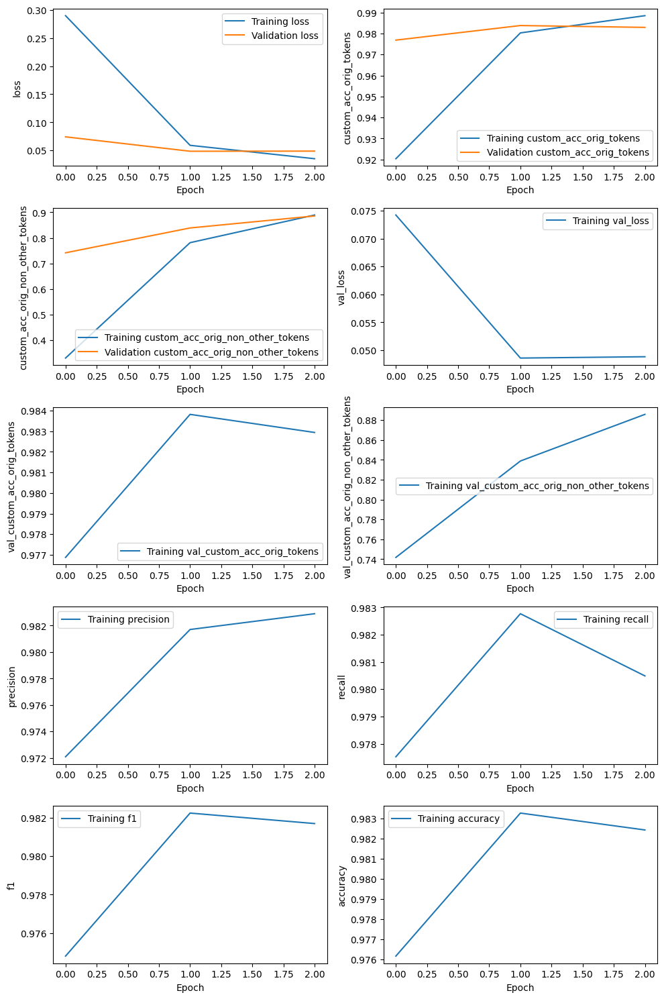

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r1_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.718,0.836,0.772,420,,
COATING_MATERIAL,0.711,0.822,0.762,359,,
COATING_METHOD,0.734,0.784,0.758,134,,
OVERALL,0.717,0.823,0.766,,0.980,0.837


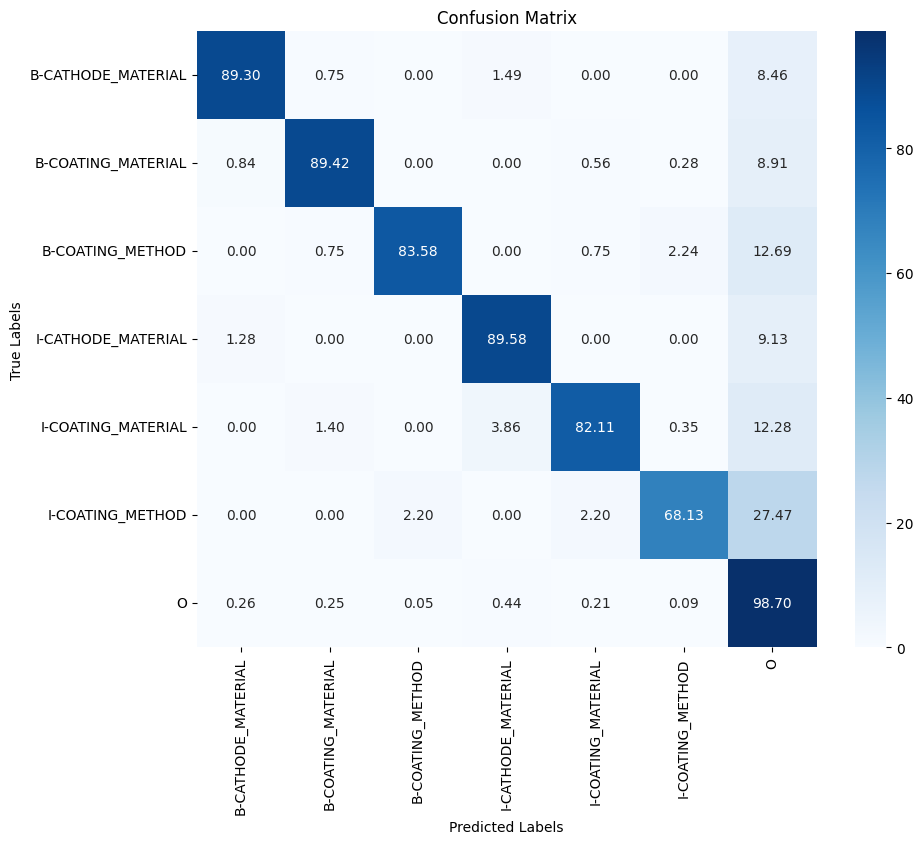

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relative

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 54s 221ms/step - loss: 0.2754 - custom_acc_orig_tokens: 0.9265 - custom_acc_orig_non_other_tokens: 0.3359 - val_loss: 0.0716 - val_custom_acc_orig_tokens: 0.9790 - val_custom_acc_orig_non_other_tokens: 0.7566 - precision: 0.9751 - recall: 0.9793 - f1: 0.9772 - accuracy: 0.9783
Epoch 2/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0604 - custom_acc_orig_tokens: 0.9802 - custom_acc_orig_non_other_tokens: 0.7813 - val_loss: 0.0504 - val_custom_acc_orig_tokens: 0.9843 - val_custom_acc_orig_non_other_tokens: 0.8421 - precision: 0.9825 - recall: 0.9835 - f1: 0.9830 - accuracy: 0.9837
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0360 - custom_acc_orig_tokens: 0.9882 - custom_acc_orig_non_other_tokens: 0.8820 - val_loss: 0.0491 - val_custom_acc_orig_tokens: 0.9841 - val_custom_acc_orig_non_other_tokens: 0.8680 - precision: 0.9828 - recall: 0.9825 - f1: 0.9827 - accuracy: 0.9835


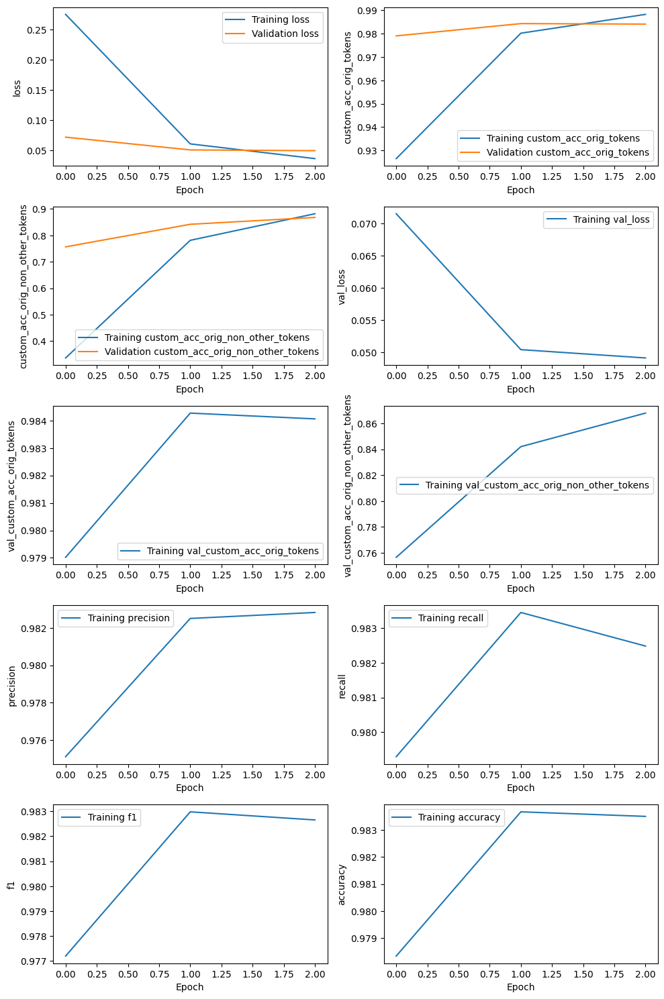

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r2_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.732,0.838,0.781,420,,
COATING_MATERIAL,0.729,0.825,0.774,359,,
COATING_METHOD,0.752,0.746,0.749,134,,
OVERALL,0.733,0.819,0.774,,0.980,0.837


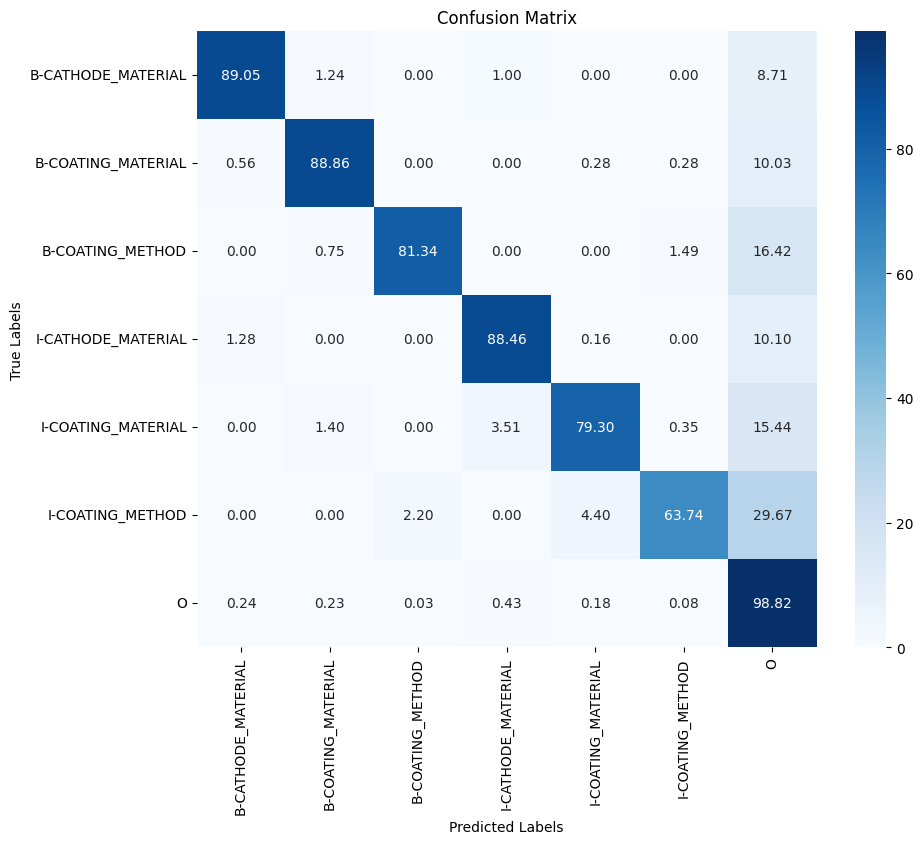

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relative

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 218ms/step - loss: 0.2762 - custom_acc_orig_tokens: 0.9265 - custom_acc_orig_non_other_tokens: 0.3241 - val_loss: 0.0728 - val_custom_acc_orig_tokens: 0.9787 - val_custom_acc_orig_non_other_tokens: 0.7427 - precision: 0.9749 - recall: 0.9784 - f1: 0.9766 - accuracy: 0.9781
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0608 - custom_acc_orig_tokens: 0.9798 - custom_acc_orig_non_other_tokens: 0.7704 - val_loss: 0.0497 - val_custom_acc_orig_tokens: 0.9840 - val_custom_acc_orig_non_other_tokens: 0.8212 - precision: 0.9816 - recall: 0.9836 - f1: 0.9826 - accuracy: 0.9834
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0365 - custom_acc_orig_tokens: 0.9883 - custom_acc_orig_non_other_tokens: 0.8818 - val_loss: 0.0482 - val_custom_acc_orig_tokens: 0.9836 - val_custom_acc_orig_non_other_tokens: 0.8777 - precision: 0.9832 - recall: 0.9813 - f1: 0.9822 - accuracy: 0.9832


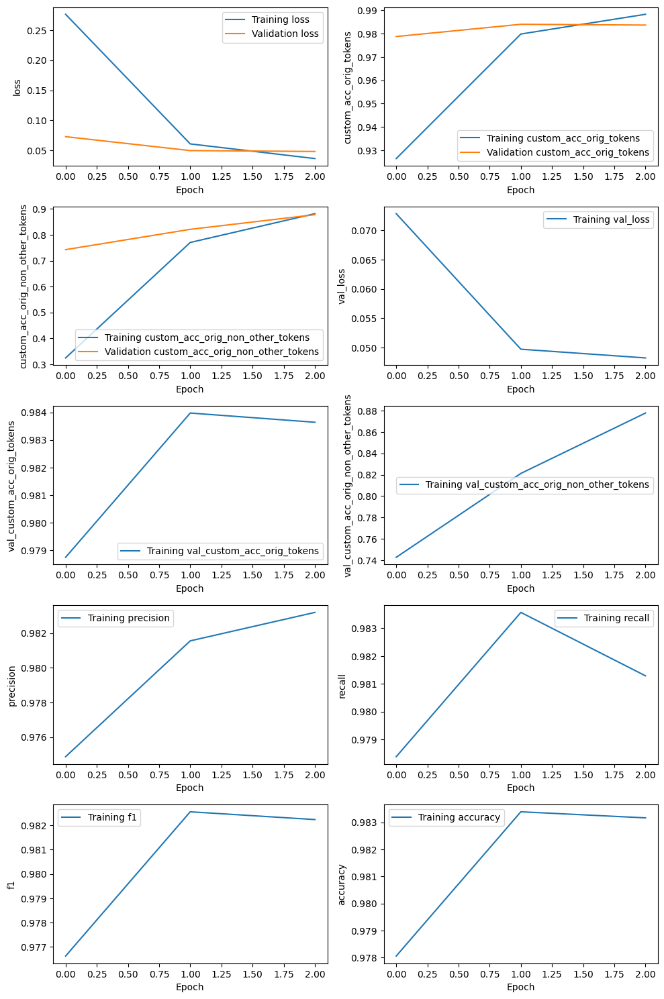

160/160 [==============================] - 12s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_16_8e-05_r3_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.739,0.829,0.781,420,,
COATING_MATERIAL,0.685,0.816,0.745,359,,
COATING_METHOD,0.761,0.761,0.761,134,,
OVERALL,0.719,0.814,0.764,,0.980,0.836


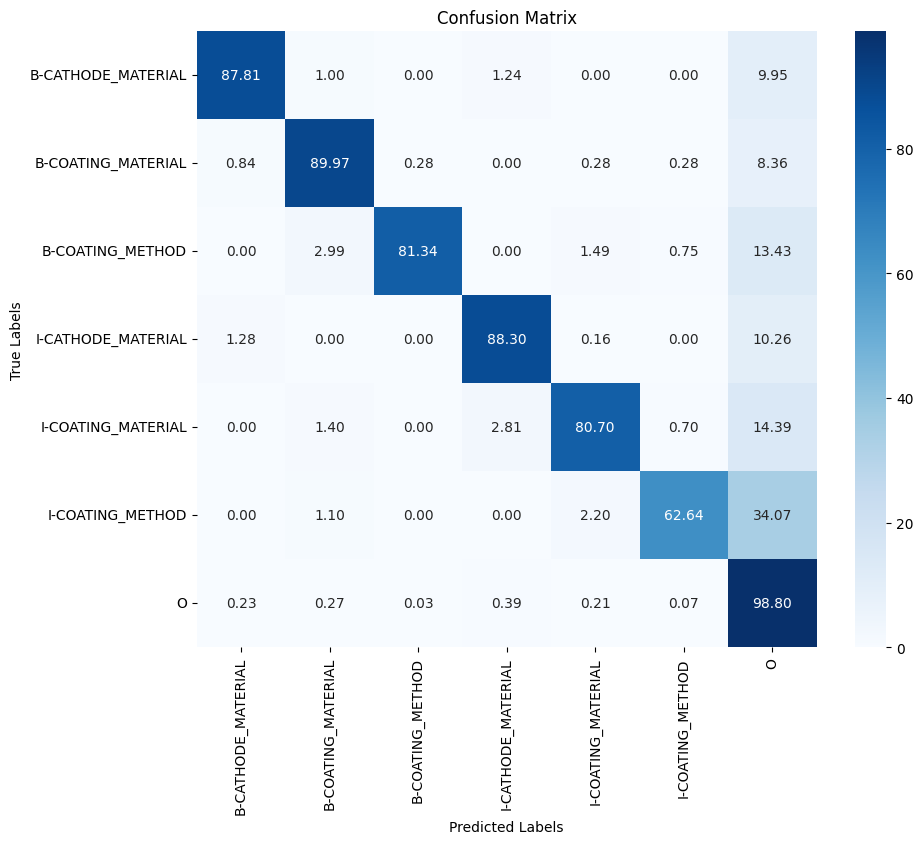

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-COATING_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relative

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 54s 217ms/step - loss: 0.3825 - custom_acc_orig_tokens: 0.8972 - custom_acc_orig_non_other_tokens: 0.0702 - val_loss: 0.1494 - val_custom_acc_orig_tokens: 0.9578 - val_custom_acc_orig_non_other_tokens: 0.2737 - precision: 0.9489 - recall: 0.9621 - f1: 0.9555 - accuracy: 0.9579
Epoch 2/3
160/160 [==============================] - 25s 154ms/step - loss: 0.1418 - custom_acc_orig_tokens: 0.9588 - custom_acc_orig_non_other_tokens: 0.3309 - val_loss: 0.1376 - val_custom_acc_orig_tokens: 0.9628 - val_custom_acc_orig_non_other_tokens: 0.4778 - precision: 0.9547 - recall: 0.9628 - f1: 0.9588 - accuracy: 0.9616
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.1378 - custom_acc_orig_tokens: 0.9601 - custom_acc_orig_non_other_tokens: 0.3567 - val_loss: 0.1376 - val_custom_acc_orig_tokens: 0.9628 - val_custom_acc_orig_non_other_tokens: 0.4778 - precision: 0.9547 - recall: 0.9628 - f1: 0.9588 - accuracy: 0.9616


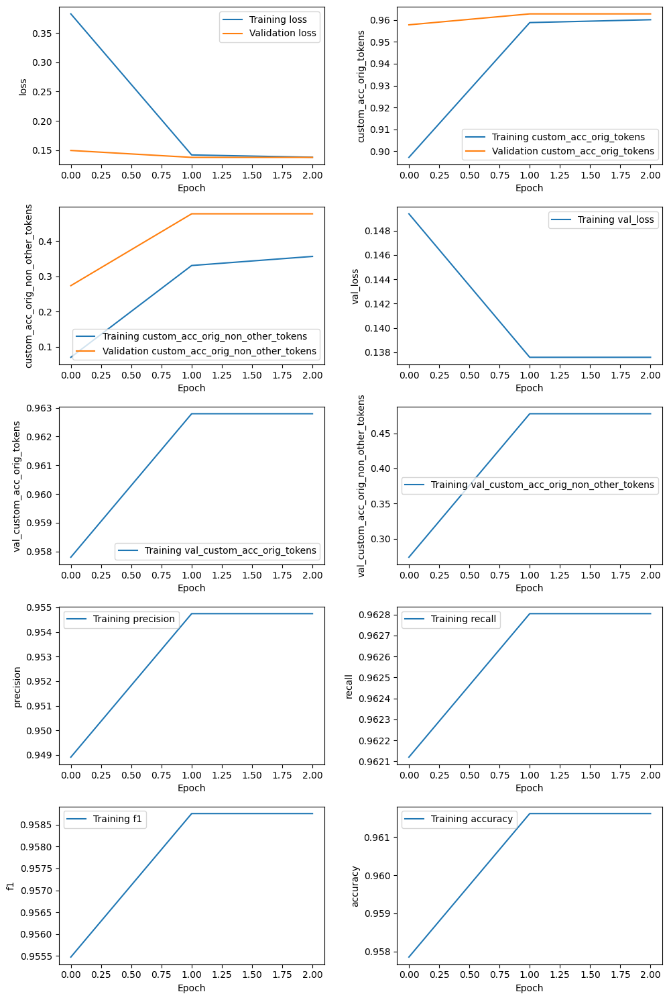

160/160 [==============================] - 13s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r1_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.493,0.512,0.502,420,,
COATING_MATERIAL,0.491,0.312,0.382,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.492,0.358,0.415,,0.956,0.572


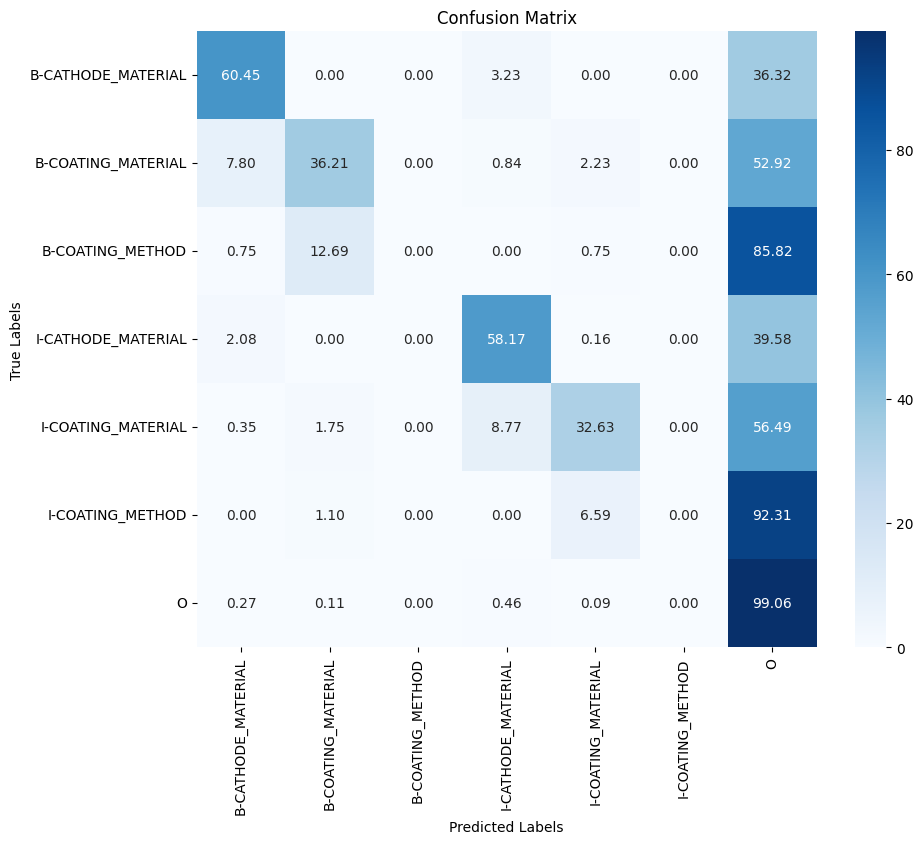

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 54s 217ms/step - loss: 0.3618 - custom_acc_orig_tokens: 0.9053 - custom_acc_orig_non_other_tokens: 0.0841 - val_loss: 0.1405 - val_custom_acc_orig_tokens: 0.9604 - val_custom_acc_orig_non_other_tokens: 0.3439 - precision: 0.9523 - recall: 0.9635 - f1: 0.9579 - accuracy: 0.9602
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.1351 - custom_acc_orig_tokens: 0.9607 - custom_acc_orig_non_other_tokens: 0.3822 - val_loss: 0.1308 - val_custom_acc_orig_tokens: 0.9643 - val_custom_acc_orig_non_other_tokens: 0.5338 - precision: 0.9574 - recall: 0.9639 - f1: 0.9607 - accuracy: 0.9632
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.1308 - custom_acc_orig_tokens: 0.9624 - custom_acc_orig_non_other_tokens: 0.4151 - val_loss: 0.1308 - val_custom_acc_orig_tokens: 0.9643 - val_custom_acc_orig_non_other_tokens: 0.5338 - precision: 0.9574 - recall: 0.9639 - f1: 0.9607 - accuracy: 0.9632


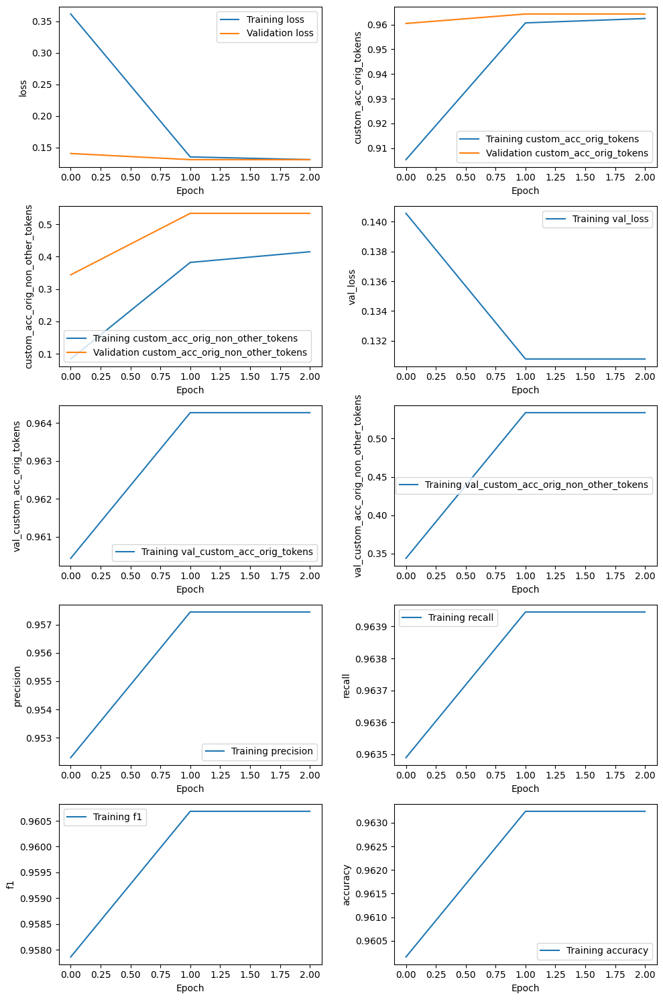

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r2_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.520,0.579,0.548,420,,
COATING_MATERIAL,0.518,0.448,0.481,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.519,0.442,0.478,,0.958,0.609


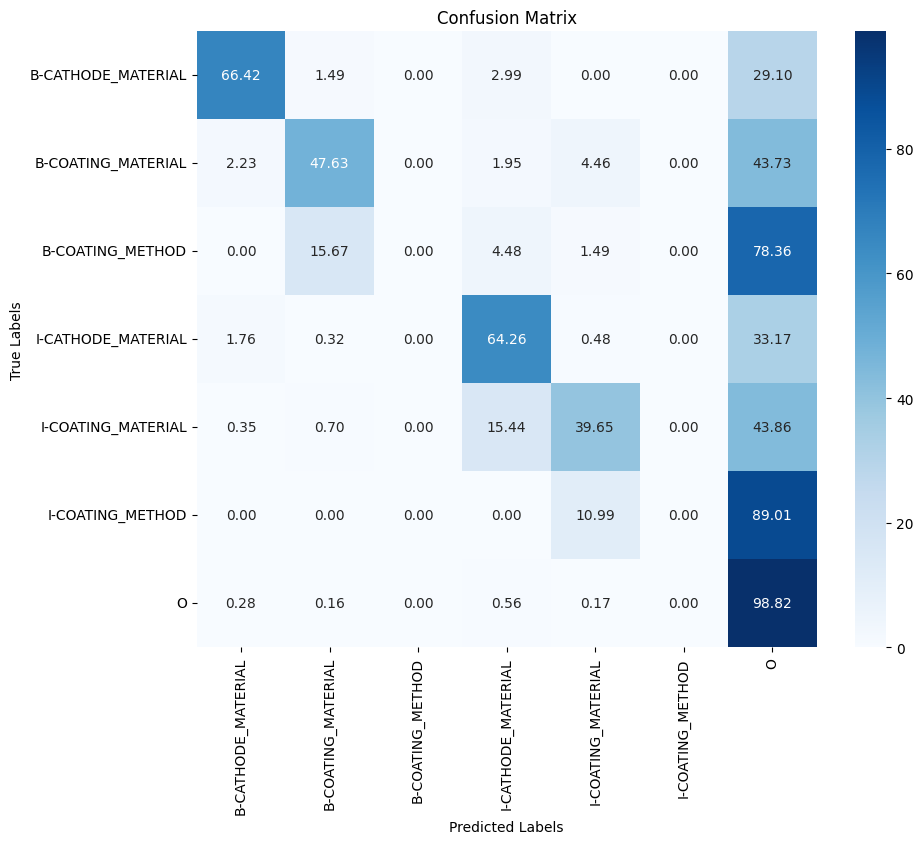

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 217ms/step - loss: 0.3623 - custom_acc_orig_tokens: 0.9072 - custom_acc_orig_non_other_tokens: 0.0842 - val_loss: 0.1457 - val_custom_acc_orig_tokens: 0.9587 - val_custom_acc_orig_non_other_tokens: 0.3130 - precision: 0.9499 - recall: 0.9617 - f1: 0.9557 - accuracy: 0.9584
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.1394 - custom_acc_orig_tokens: 0.9598 - custom_acc_orig_non_other_tokens: 0.3490 - val_loss: 0.1365 - val_custom_acc_orig_tokens: 0.9632 - val_custom_acc_orig_non_other_tokens: 0.5111 - precision: 0.9561 - recall: 0.9630 - f1: 0.9595 - accuracy: 0.9621
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.1352 - custom_acc_orig_tokens: 0.9611 - custom_acc_orig_non_other_tokens: 0.3860 - val_loss: 0.1365 - val_custom_acc_orig_tokens: 0.9632 - val_custom_acc_orig_non_other_tokens: 0.5111 - precision: 0.9561 - recall: 0.9630 - f1: 0.9595 - accuracy: 0.9621


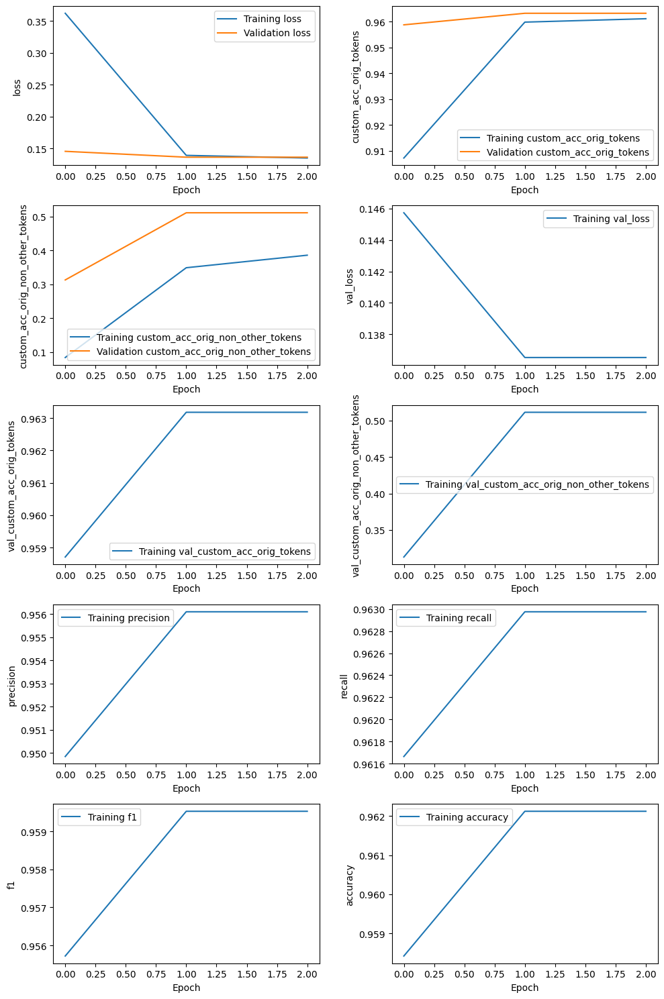

160/160 [==============================] - 13s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_2e-05_r3_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.493,0.526,0.509,420,,
COATING_MATERIAL,0.493,0.396,0.439,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.493,0.398,0.440,,0.957,0.596


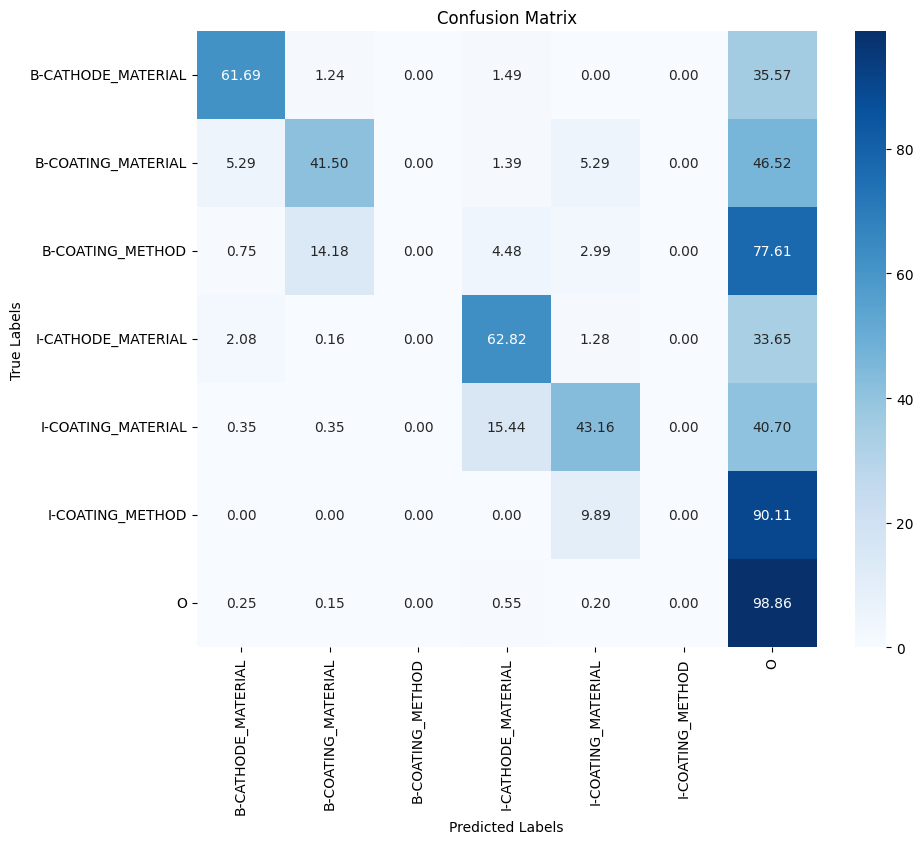

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 54s 217ms/step - loss: 0.2945 - custom_acc_orig_tokens: 0.9201 - custom_acc_orig_non_other_tokens: 0.2361 - val_loss: 0.0975 - val_custom_acc_orig_tokens: 0.9713 - val_custom_acc_orig_non_other_tokens: 0.6113 - precision: 0.9663 - recall: 0.9706 - f1: 0.9684 - accuracy: 0.9705
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0896 - custom_acc_orig_tokens: 0.9729 - custom_acc_orig_non_other_tokens: 0.6459 - val_loss: 0.0891 - val_custom_acc_orig_tokens: 0.9739 - val_custom_acc_orig_non_other_tokens: 0.7371 - precision: 0.9705 - recall: 0.9701 - f1: 0.9703 - accuracy: 0.9731
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0850 - custom_acc_orig_tokens: 0.9745 - custom_acc_orig_non_other_tokens: 0.6735 - val_loss: 0.0891 - val_custom_acc_orig_tokens: 0.9739 - val_custom_acc_orig_non_other_tokens: 0.7371 - precision: 0.9705 - recall: 0.9701 - f1: 0.9703 - accuracy: 0.9731


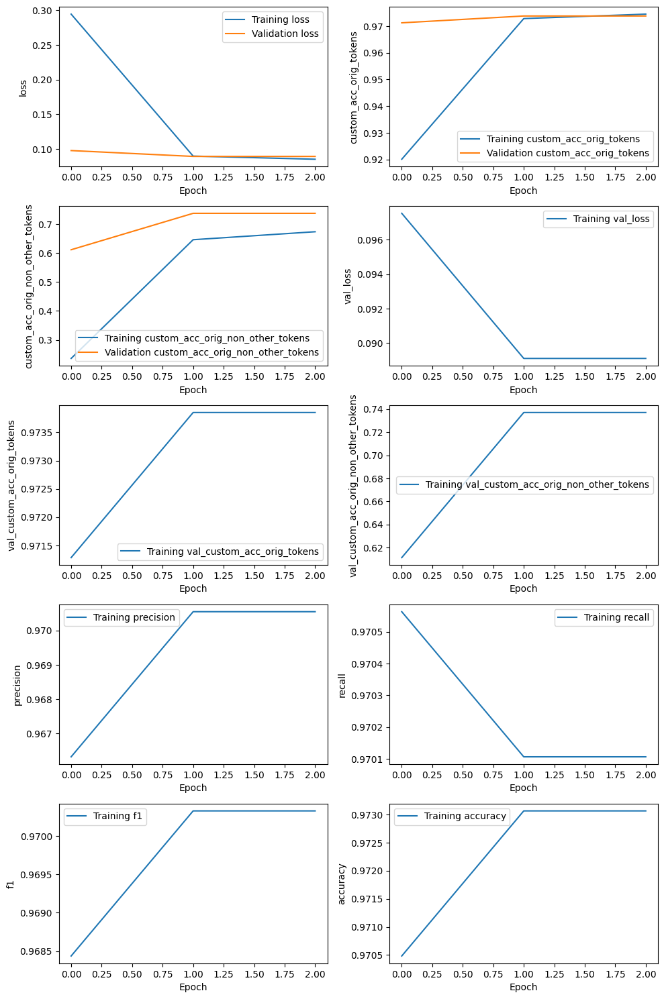

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r1_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.610,0.752,0.674,420,,
COATING_MATERIAL,0.494,0.688,0.575,359,,
COATING_METHOD,0.903,0.209,0.339,134,,
OVERALL,0.563,0.647,0.602,,0.967,0.722


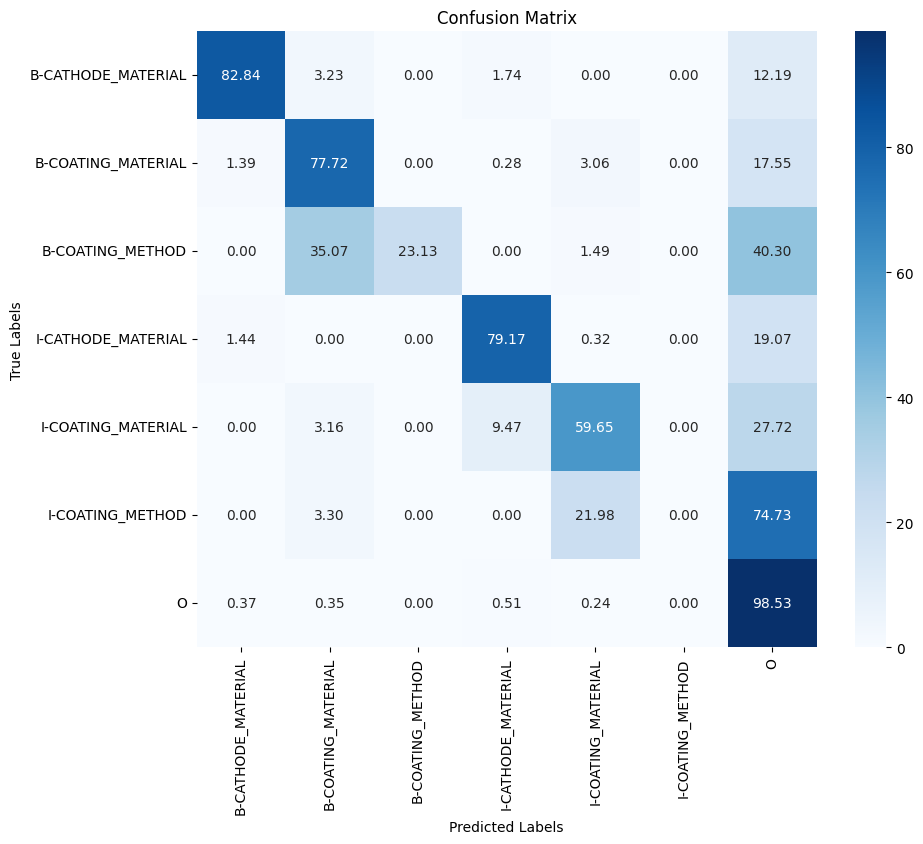

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 217ms/step - loss: 0.2775 - custom_acc_orig_tokens: 0.9260 - custom_acc_orig_non_other_tokens: 0.2691 - val_loss: 0.0952 - val_custom_acc_orig_tokens: 0.9721 - val_custom_acc_orig_non_other_tokens: 0.6527 - precision: 0.9678 - recall: 0.9702 - f1: 0.9690 - accuracy: 0.9713
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0872 - custom_acc_orig_tokens: 0.9738 - custom_acc_orig_non_other_tokens: 0.6645 - val_loss: 0.0865 - val_custom_acc_orig_tokens: 0.9748 - val_custom_acc_orig_non_other_tokens: 0.7490 - precision: 0.9716 - recall: 0.9712 - f1: 0.9714 - accuracy: 0.9740
Epoch 3/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0822 - custom_acc_orig_tokens: 0.9759 - custom_acc_orig_non_other_tokens: 0.6989 - val_loss: 0.0865 - val_custom_acc_orig_tokens: 0.9748 - val_custom_acc_orig_non_other_tokens: 0.7490 - precision: 0.9716 - recall: 0.9712 - f1: 0.9714 - accuracy: 0.9740


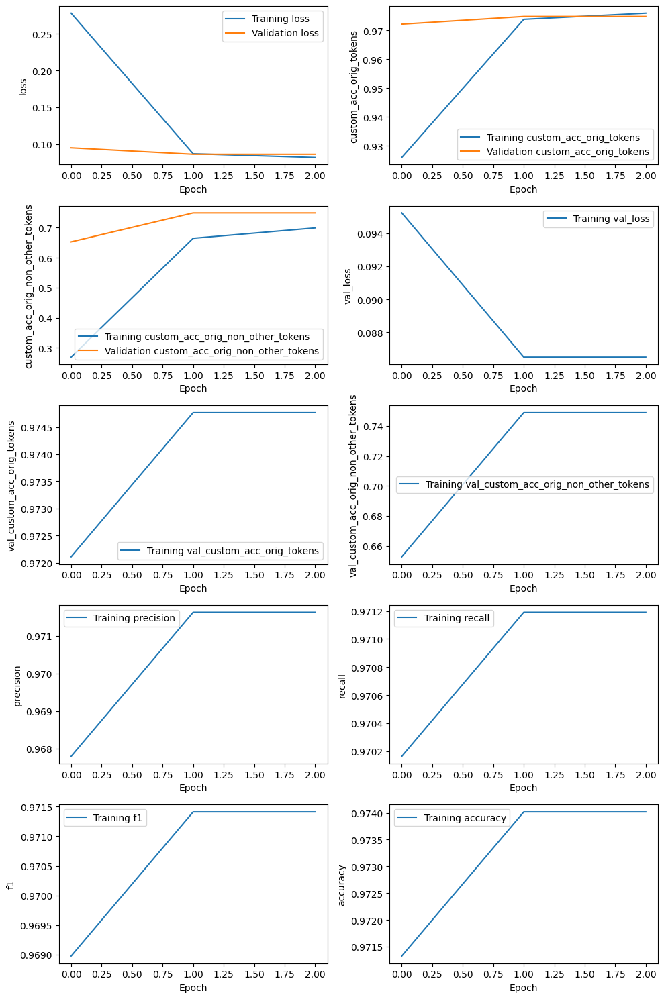

160/160 [==============================] - 13s 62ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r2_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.607,0.748,0.670,420,,
COATING_MATERIAL,0.508,0.702,0.589,359,,
COATING_METHOD,0.883,0.396,0.546,134,,
OVERALL,0.577,0.678,0.623,,0.968,0.728


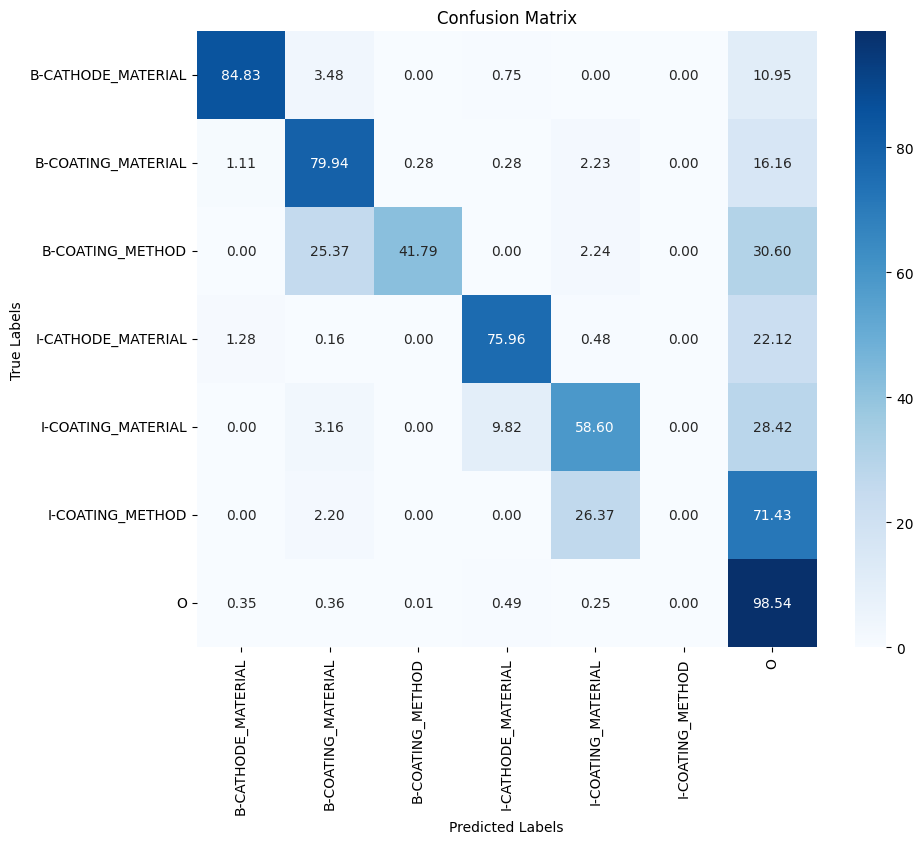

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 54s 222ms/step - loss: 0.2834 - custom_acc_orig_tokens: 0.9255 - custom_acc_orig_non_other_tokens: 0.2384 - val_loss: 0.0990 - val_custom_acc_orig_tokens: 0.9710 - val_custom_acc_orig_non_other_tokens: 0.6009 - precision: 0.9661 - recall: 0.9696 - f1: 0.9679 - accuracy: 0.9702
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0926 - custom_acc_orig_tokens: 0.9728 - custom_acc_orig_non_other_tokens: 0.6400 - val_loss: 0.0916 - val_custom_acc_orig_tokens: 0.9741 - val_custom_acc_orig_non_other_tokens: 0.7463 - precision: 0.9709 - recall: 0.9700 - f1: 0.9704 - accuracy: 0.9733
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0884 - custom_acc_orig_tokens: 0.9742 - custom_acc_orig_non_other_tokens: 0.6794 - val_loss: 0.0916 - val_custom_acc_orig_tokens: 0.9741 - val_custom_acc_orig_non_other_tokens: 0.7463 - precision: 0.9709 - recall: 0.9700 - f1: 0.9704 - accuracy: 0.9733


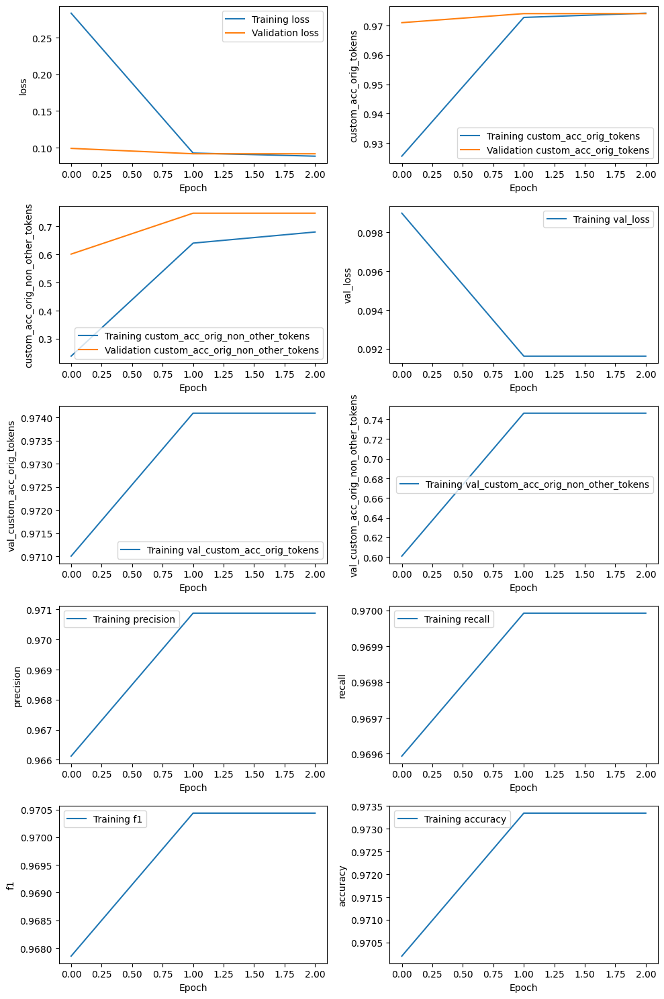

160/160 [==============================] - 12s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_5e-05_r3_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.592,0.738,0.657,420,,
COATING_MATERIAL,0.482,0.682,0.565,359,,
COATING_METHOD,0.872,0.306,0.453,134,,
OVERALL,0.552,0.653,0.598,,0.966,0.717


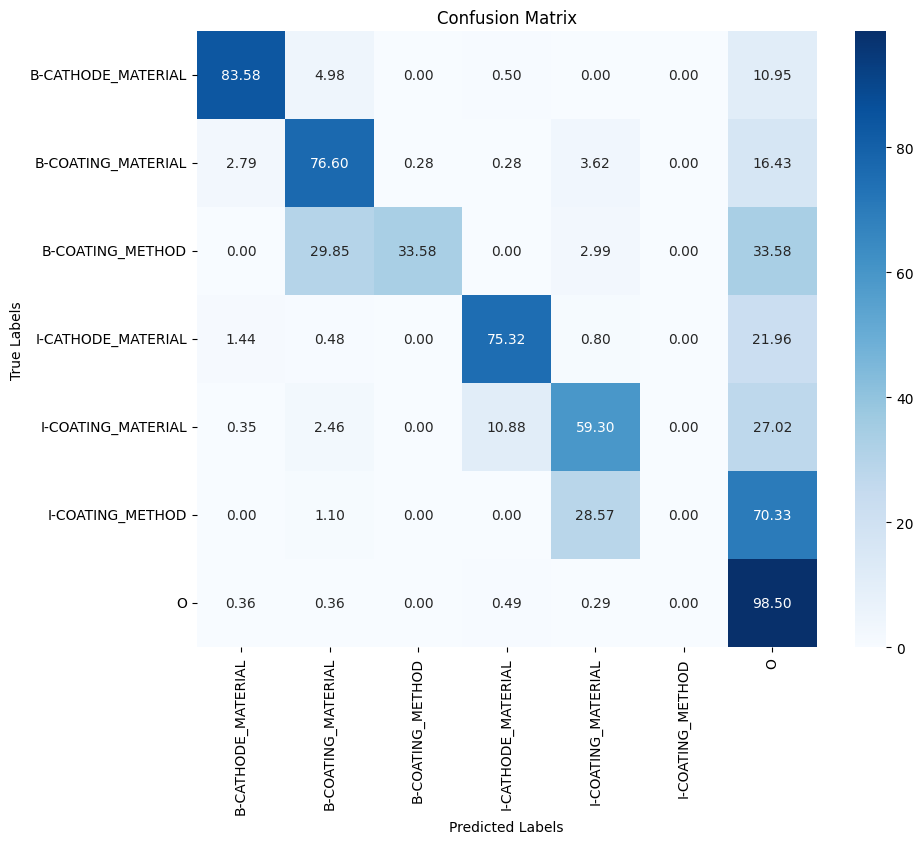

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 56s 218ms/step - loss: 0.2569 - custom_acc_orig_tokens: 0.9297 - custom_acc_orig_non_other_tokens: 0.3319 - val_loss: 0.0813 - val_custom_acc_orig_tokens: 0.9761 - val_custom_acc_orig_non_other_tokens: 0.7458 - precision: 0.9721 - recall: 0.9747 - f1: 0.9734 - accuracy: 0.9753
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0705 - custom_acc_orig_tokens: 0.9778 - custom_acc_orig_non_other_tokens: 0.7462 - val_loss: 0.0709 - val_custom_acc_orig_tokens: 0.9779 - val_custom_acc_orig_non_other_tokens: 0.8078 - precision: 0.9753 - recall: 0.9750 - f1: 0.9752 - accuracy: 0.9772
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0651 - custom_acc_orig_tokens: 0.9799 - custom_acc_orig_non_other_tokens: 0.7771 - val_loss: 0.0709 - val_custom_acc_orig_tokens: 0.9779 - val_custom_acc_orig_non_other_tokens: 0.8078 - precision: 0.9753 - recall: 0.9750 - f1: 0.9752 - accuracy: 0.9772


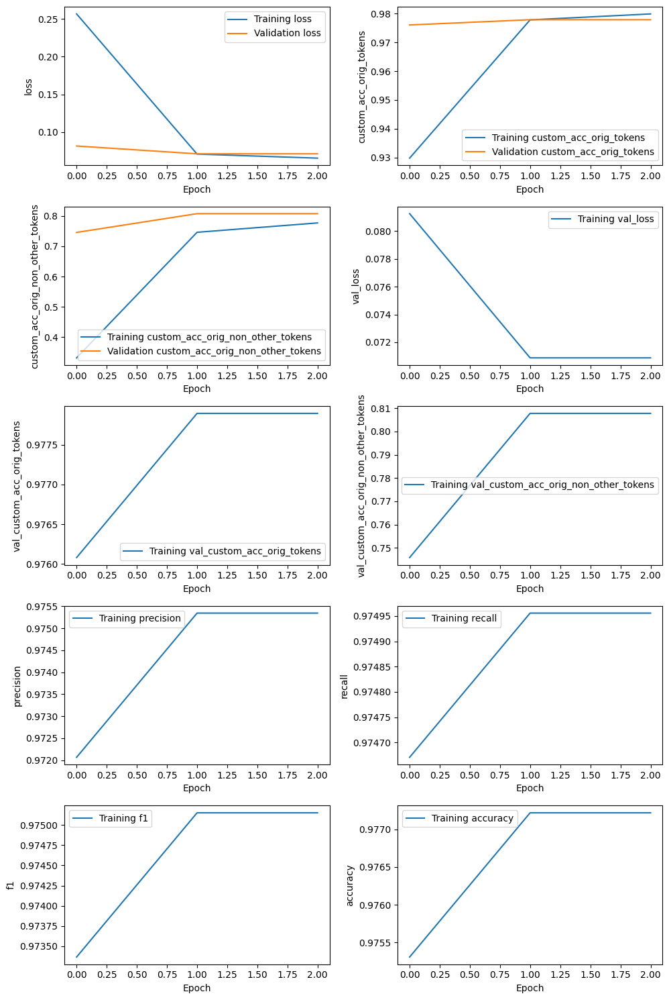

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r1_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.651,0.812,0.722,420,,
COATING_MATERIAL,0.531,0.760,0.625,359,,
COATING_METHOD,0.821,0.515,0.633,134,,
OVERALL,0.609,0.748,0.671,,0.971,0.761


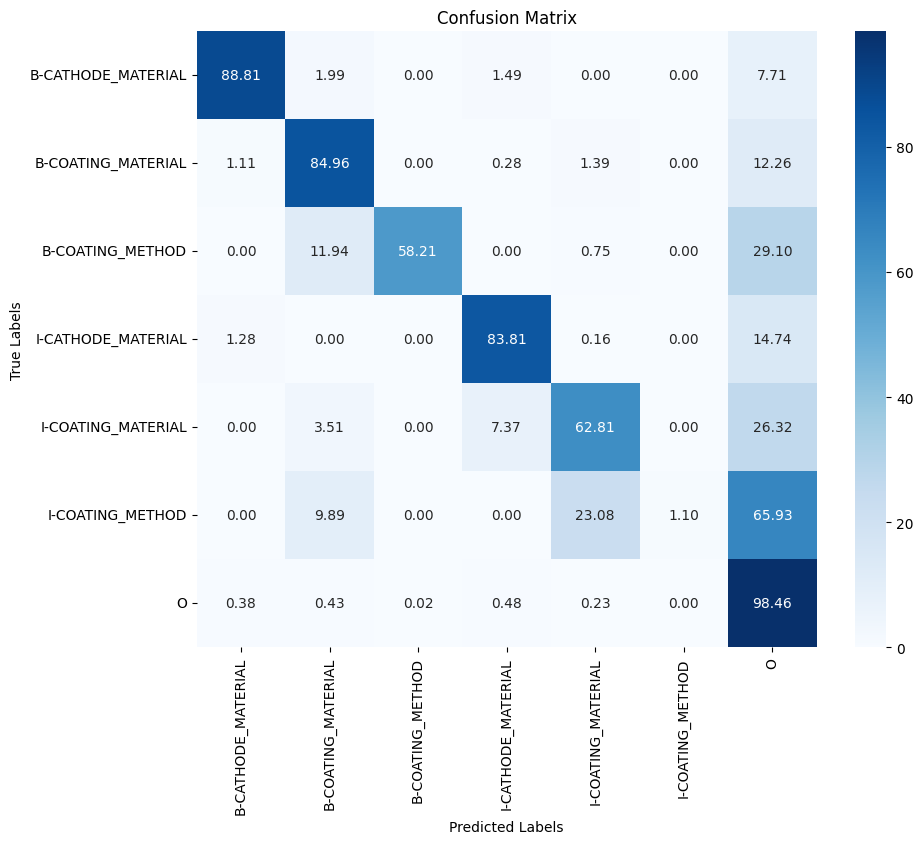

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 54s 222ms/step - loss: 0.2466 - custom_acc_orig_tokens: 0.9338 - custom_acc_orig_non_other_tokens: 0.3453 - val_loss: 0.0836 - val_custom_acc_orig_tokens: 0.9770 - val_custom_acc_orig_non_other_tokens: 0.7963 - precision: 0.9740 - recall: 0.9754 - f1: 0.9747 - accuracy: 0.9763
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0715 - custom_acc_orig_tokens: 0.9776 - custom_acc_orig_non_other_tokens: 0.7487 - val_loss: 0.0716 - val_custom_acc_orig_tokens: 0.9780 - val_custom_acc_orig_non_other_tokens: 0.8069 - precision: 0.9757 - recall: 0.9755 - f1: 0.9756 - accuracy: 0.9774
Epoch 3/3
160/160 [==============================] - 25s 154ms/step - loss: 0.0658 - custom_acc_orig_tokens: 0.9798 - custom_acc_orig_non_other_tokens: 0.7849 - val_loss: 0.0716 - val_custom_acc_orig_tokens: 0.9780 - val_custom_acc_orig_non_other_tokens: 0.8069 - precision: 0.9757 - recall: 0.9755 - f1: 0.9756 - accuracy: 0.9774


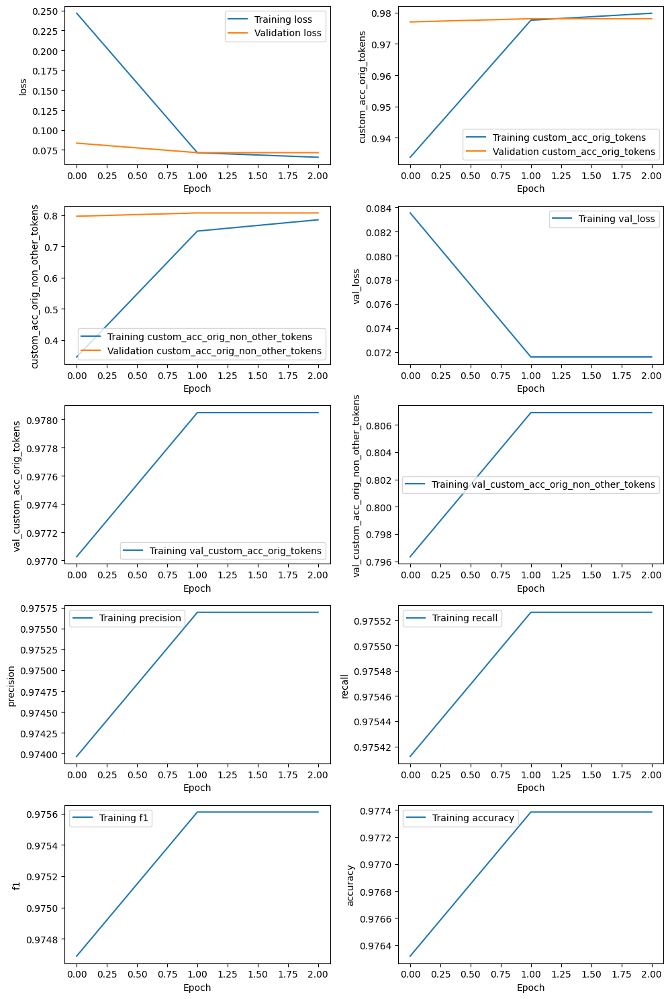

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 56ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r2_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.651,0.814,0.724,420,,
COATING_MATERIAL,0.542,0.755,0.631,359,,
COATING_METHOD,0.841,0.552,0.667,134,,
OVERALL,0.617,0.752,0.678,,0.971,0.760


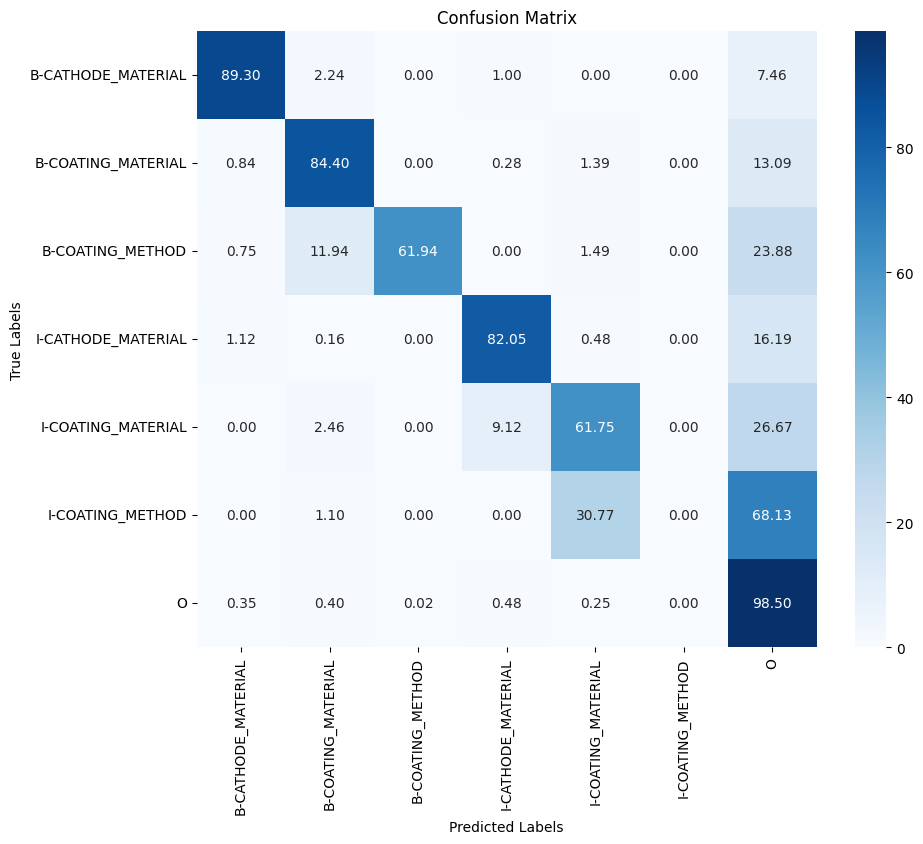

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 56s 219ms/step - loss: 0.2491 - custom_acc_orig_tokens: 0.9334 - custom_acc_orig_non_other_tokens: 0.3196 - val_loss: 0.0846 - val_custom_acc_orig_tokens: 0.9764 - val_custom_acc_orig_non_other_tokens: 0.7453 - precision: 0.9733 - recall: 0.9747 - f1: 0.9740 - accuracy: 0.9756
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0727 - custom_acc_orig_tokens: 0.9778 - custom_acc_orig_non_other_tokens: 0.7400 - val_loss: 0.0742 - val_custom_acc_orig_tokens: 0.9778 - val_custom_acc_orig_non_other_tokens: 0.8150 - precision: 0.9756 - recall: 0.9749 - f1: 0.9753 - accuracy: 0.9771
Epoch 3/3
160/160 [==============================] - 25s 155ms/step - loss: 0.0681 - custom_acc_orig_tokens: 0.9793 - custom_acc_orig_non_other_tokens: 0.7755 - val_loss: 0.0742 - val_custom_acc_orig_tokens: 0.9778 - val_custom_acc_orig_non_other_tokens: 0.8150 - precision: 0.9756 - recall: 0.9749 - f1: 0.9753 - accuracy: 0.9771


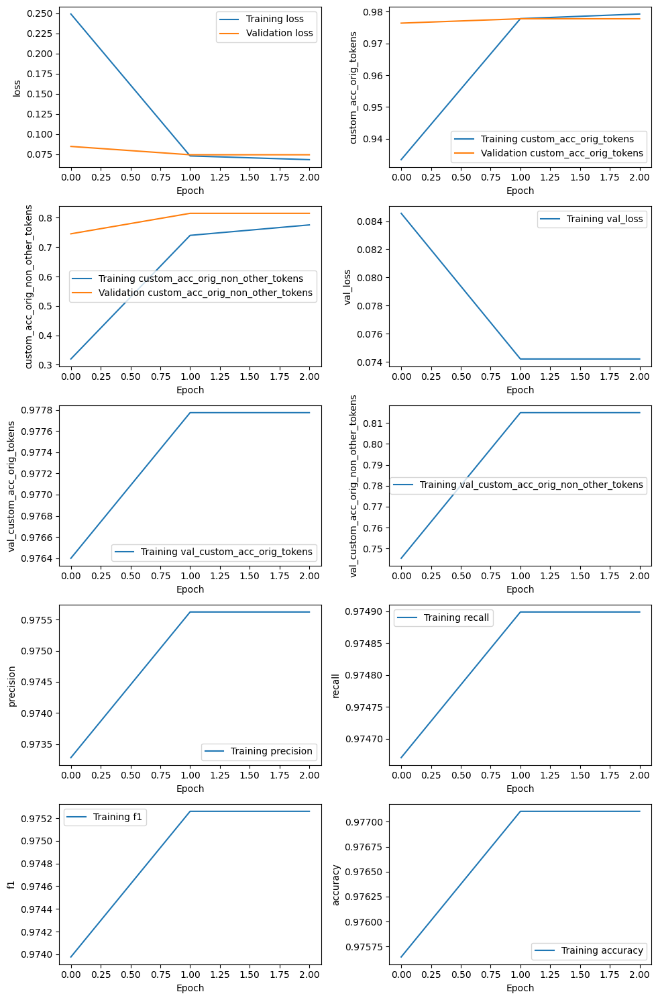

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 56ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_32_8e-05_r3_eval_predictions.json in the repository.



,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.619,0.793,0.695,420,,
COATING_MATERIAL,0.548,0.769,0.640,359,,
COATING_METHOD,0.826,0.530,0.645,134,,
OVERALL,0.603,0.745,0.666,,0.971,0.759


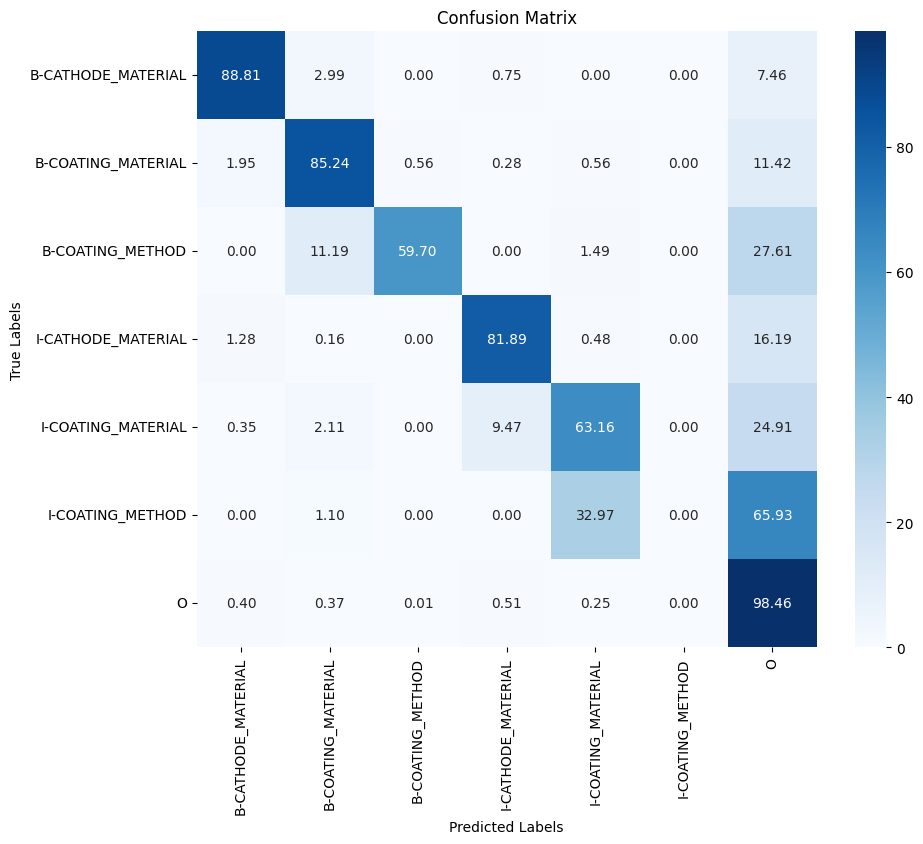

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-COATING_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relative

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - ETA: 0s - loss: 0.3615 - custom_acc_orig_tokens: 0.9078 - custom_acc_orig_non_other_tokens: 0.0115

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


160/160 [==============================] - 55s 218ms/step - loss: 0.3615 - custom_acc_orig_tokens: 0.9078 - custom_acc_orig_non_other_tokens: 0.0115 - val_loss: 0.2119 - val_custom_acc_orig_tokens: 0.9461 - val_custom_acc_orig_non_other_tokens: 0.0576 - precision: 0.9355 - recall: 0.9510 - f1: 0.9432 - accuracy: 0.9460
Epoch 2/3
160/160 [==============================] - 25s 156ms/step - loss: 0.2171 - custom_acc_orig_tokens: 0.9448 - custom_acc_orig_non_other_tokens: 0.0254 - val_loss: 0.2119 - val_custom_acc_orig_tokens: 0.9461 - val_custom_acc_orig_non_other_tokens: 0.0576 - precision: 0.9355 - recall: 0.9510 - f1: 0.9432 - accuracy: 0.9460
Epoch 3/3
160/160 [==============================] - 25s 156ms/step - loss: 0.2171 - custom_acc_orig_tokens: 0.9450 - custom_acc_orig_non_other_tokens: 0.0278 - val_loss: 0.2119 - val_custom_acc_orig_tokens: 0.9461 - val_custom_acc_orig_non_other_tokens: 0.0576 - precision: 0.9355 - recall: 0.9510 - f1: 0.9432 - accuracy: 0.9460


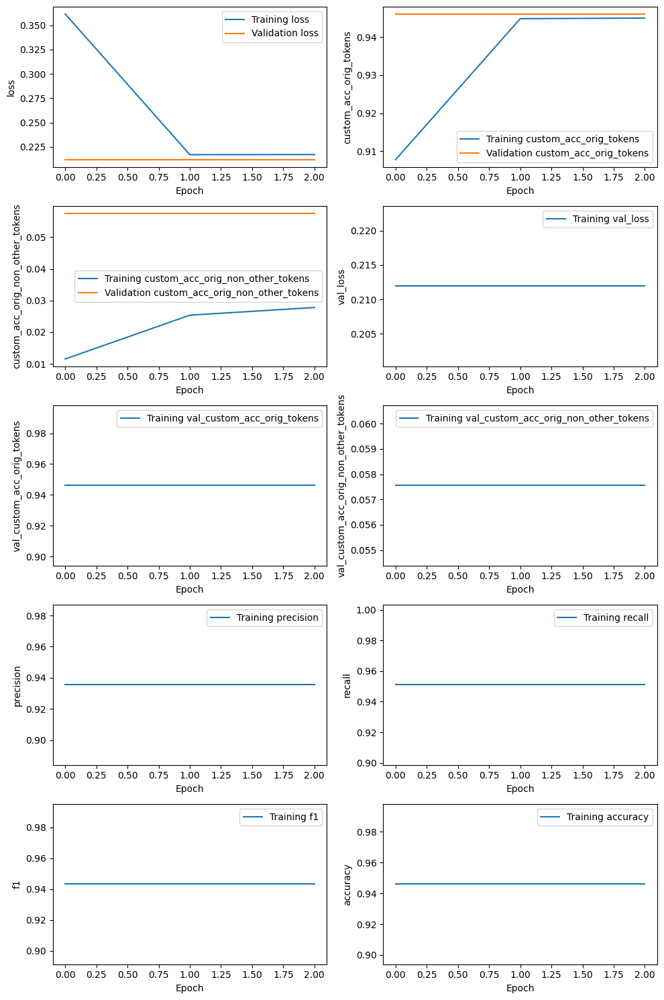

160/160 [==============================] - 13s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r1_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.000,0.000,0.000,420,,
COATING_MATERIAL,0.000,0.000,0.000,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.000,0.000,0.000,,0.941,0.223


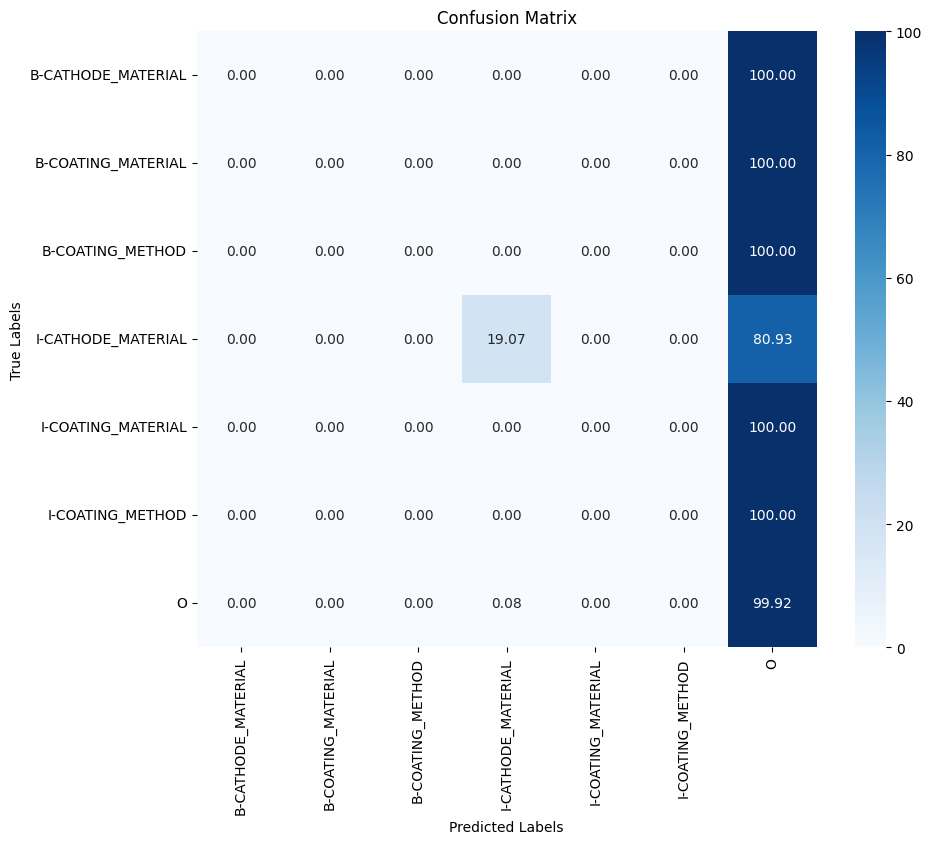

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - ETA: 0s - loss: 0.3485 - custom_acc_orig_tokens: 0.9142 - custom_acc_orig_non_other_tokens: 0.0233

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


160/160 [==============================] - 55s 219ms/step - loss: 0.3485 - custom_acc_orig_tokens: 0.9142 - custom_acc_orig_non_other_tokens: 0.0233 - val_loss: 0.2084 - val_custom_acc_orig_tokens: 0.9487 - val_custom_acc_orig_non_other_tokens: 0.1005 - precision: 0.9380 - recall: 0.9536 - f1: 0.9458 - accuracy: 0.9486
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.2147 - custom_acc_orig_tokens: 0.9467 - custom_acc_orig_non_other_tokens: 0.0586 - val_loss: 0.2084 - val_custom_acc_orig_tokens: 0.9487 - val_custom_acc_orig_non_other_tokens: 0.1005 - precision: 0.9380 - recall: 0.9536 - f1: 0.9458 - accuracy: 0.9486
Epoch 3/3
160/160 [==============================] - 25s 155ms/step - loss: 0.2143 - custom_acc_orig_tokens: 0.9467 - custom_acc_orig_non_other_tokens: 0.0594 - val_loss: 0.2084 - val_custom_acc_orig_tokens: 0.9487 - val_custom_acc_orig_non_other_tokens: 0.1005 - precision: 0.9380 - recall: 0.9536 - f1: 0.9458 - accuracy: 0.9486


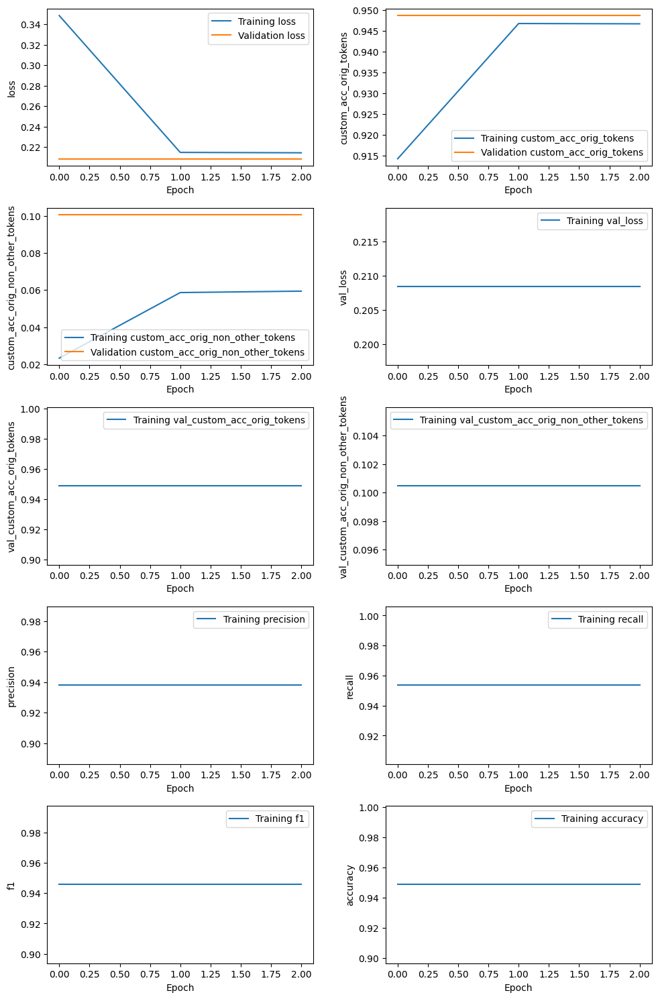

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r2_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.000,0.000,0.000,420,,
COATING_MATERIAL,0.000,0.000,0.000,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.000,0.000,0.000,,0.944,0.288


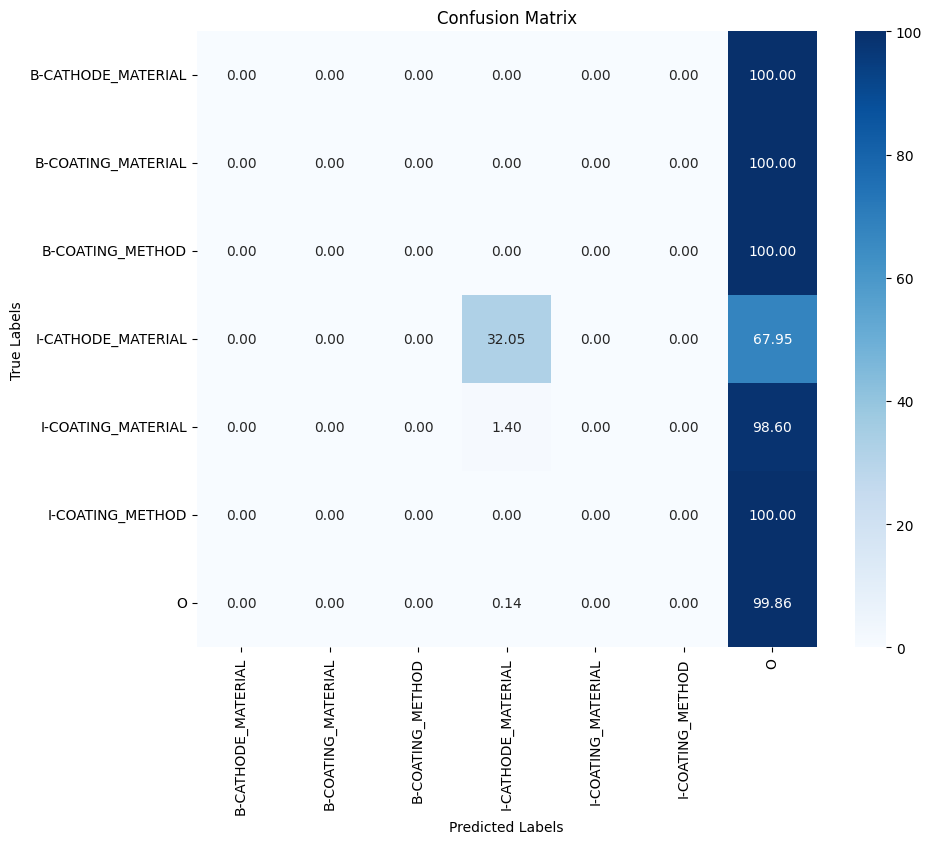

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - ETA: 0s - loss: 0.3520 - custom_acc_orig_tokens: 0.9141 - custom_acc_orig_non_other_tokens: 0.0133

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


160/160 [==============================] - 56s 219ms/step - loss: 0.3520 - custom_acc_orig_tokens: 0.9141 - custom_acc_orig_non_other_tokens: 0.0133 - val_loss: 0.2148 - val_custom_acc_orig_tokens: 0.9467 - val_custom_acc_orig_non_other_tokens: 0.0653 - precision: 0.9361 - recall: 0.9516 - f1: 0.9438 - accuracy: 0.9466
Epoch 2/3
160/160 [==============================] - 25s 155ms/step - loss: 0.2221 - custom_acc_orig_tokens: 0.9445 - custom_acc_orig_non_other_tokens: 0.0181 - val_loss: 0.2148 - val_custom_acc_orig_tokens: 0.9467 - val_custom_acc_orig_non_other_tokens: 0.0653 - precision: 0.9361 - recall: 0.9516 - f1: 0.9438 - accuracy: 0.9466
Epoch 3/3
160/160 [==============================] - 25s 155ms/step - loss: 0.2217 - custom_acc_orig_tokens: 0.9446 - custom_acc_orig_non_other_tokens: 0.0204 - val_loss: 0.2148 - val_custom_acc_orig_tokens: 0.9467 - val_custom_acc_orig_non_other_tokens: 0.0653 - precision: 0.9361 - recall: 0.9516 - f1: 0.9438 - accuracy: 0.9466


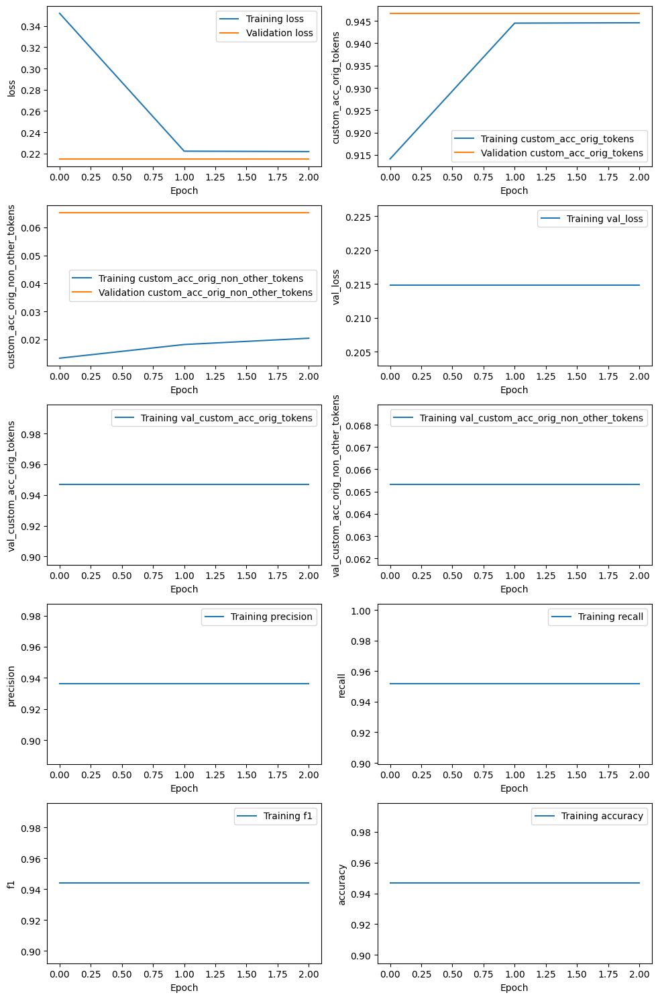

160/160 [==============================] - 14s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_2e-05_r3_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.000,0.000,0.000,420,,
COATING_MATERIAL,0.000,0.000,0.000,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.000,0.000,0.000,,0.942,0.239


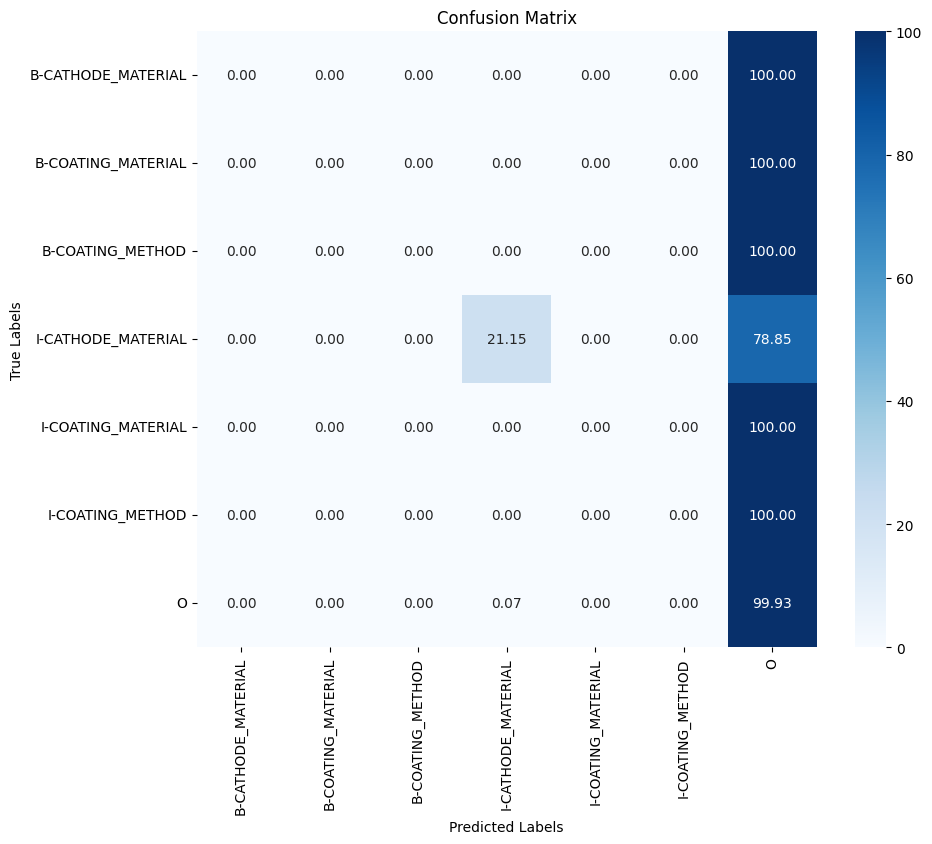

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 219ms/step - loss: 0.2810 - custom_acc_orig_tokens: 0.9247 - custom_acc_orig_non_other_tokens: 0.1598 - val_loss: 0.1505 - val_custom_acc_orig_tokens: 0.9592 - val_custom_acc_orig_non_other_tokens: 0.4470 - precision: 0.9513 - recall: 0.9599 - f1: 0.9556 - accuracy: 0.9580
Epoch 2/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1505 - custom_acc_orig_tokens: 0.9559 - custom_acc_orig_non_other_tokens: 0.3104 - val_loss: 0.1505 - val_custom_acc_orig_tokens: 0.9592 - val_custom_acc_orig_non_other_tokens: 0.4470 - precision: 0.9513 - recall: 0.9599 - f1: 0.9556 - accuracy: 0.9580
Epoch 3/3
160/160 [==============================] - 25s 155ms/step - loss: 0.1506 - custom_acc_orig_tokens: 0.9559 - custom_acc_orig_non_other_tokens: 0.3099 - val_loss: 0.1505 - val_custom_acc_orig_tokens: 0.9592 - val_custom_acc_orig_non_other_tokens: 0.4470 - precision: 0.9513 - recall: 0.9599 - f1: 0.9556 - accuracy: 0.9580


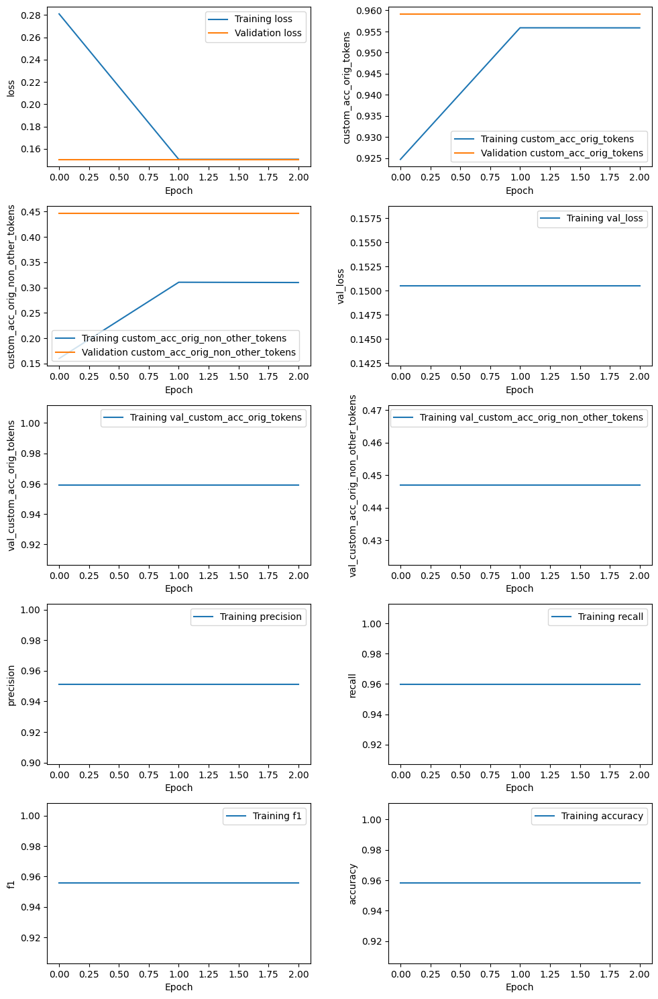

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r1_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.395,0.419,0.406,420,,
COATING_MATERIAL,0.481,0.281,0.355,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.422,0.303,0.353,,0.951,0.524


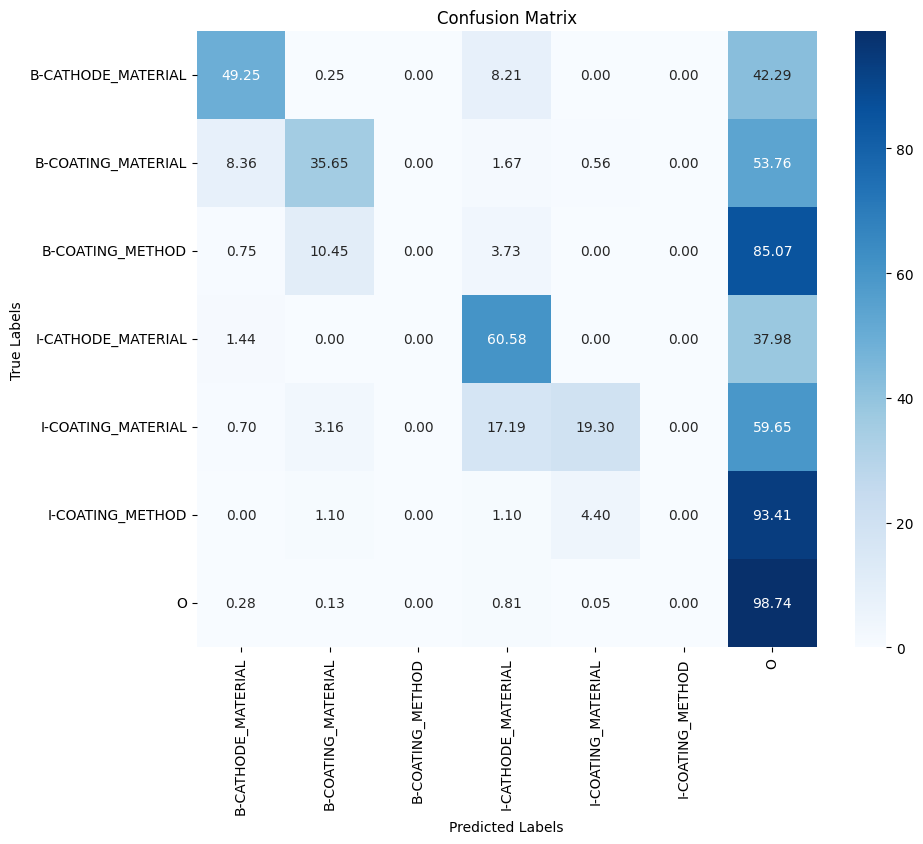

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 56s 219ms/step - loss: 0.2706 - custom_acc_orig_tokens: 0.9288 - custom_acc_orig_non_other_tokens: 0.1889 - val_loss: 0.1465 - val_custom_acc_orig_tokens: 0.9596 - val_custom_acc_orig_non_other_tokens: 0.4723 - precision: 0.9529 - recall: 0.9593 - f1: 0.9561 - accuracy: 0.9586
Epoch 2/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1459 - custom_acc_orig_tokens: 0.9577 - custom_acc_orig_non_other_tokens: 0.3518 - val_loss: 0.1465 - val_custom_acc_orig_tokens: 0.9596 - val_custom_acc_orig_non_other_tokens: 0.4723 - precision: 0.9529 - recall: 0.9593 - f1: 0.9561 - accuracy: 0.9586
Epoch 3/3
160/160 [==============================] - 25s 155ms/step - loss: 0.1455 - custom_acc_orig_tokens: 0.9578 - custom_acc_orig_non_other_tokens: 0.3513 - val_loss: 0.1465 - val_custom_acc_orig_tokens: 0.9596 - val_custom_acc_orig_non_other_tokens: 0.4723 - precision: 0.9529 - recall: 0.9593 - f1: 0.9561 - accuracy: 0.9586


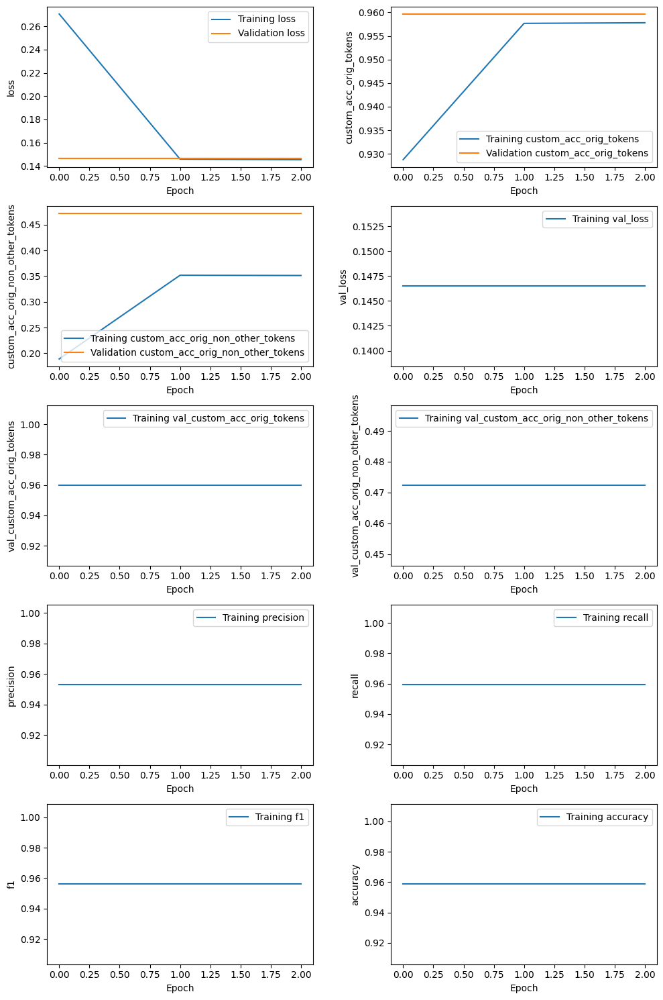

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r2_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.417,0.486,0.449,420,,
COATING_MATERIAL,0.403,0.376,0.389,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.411,0.371,0.390,,0.953,0.559


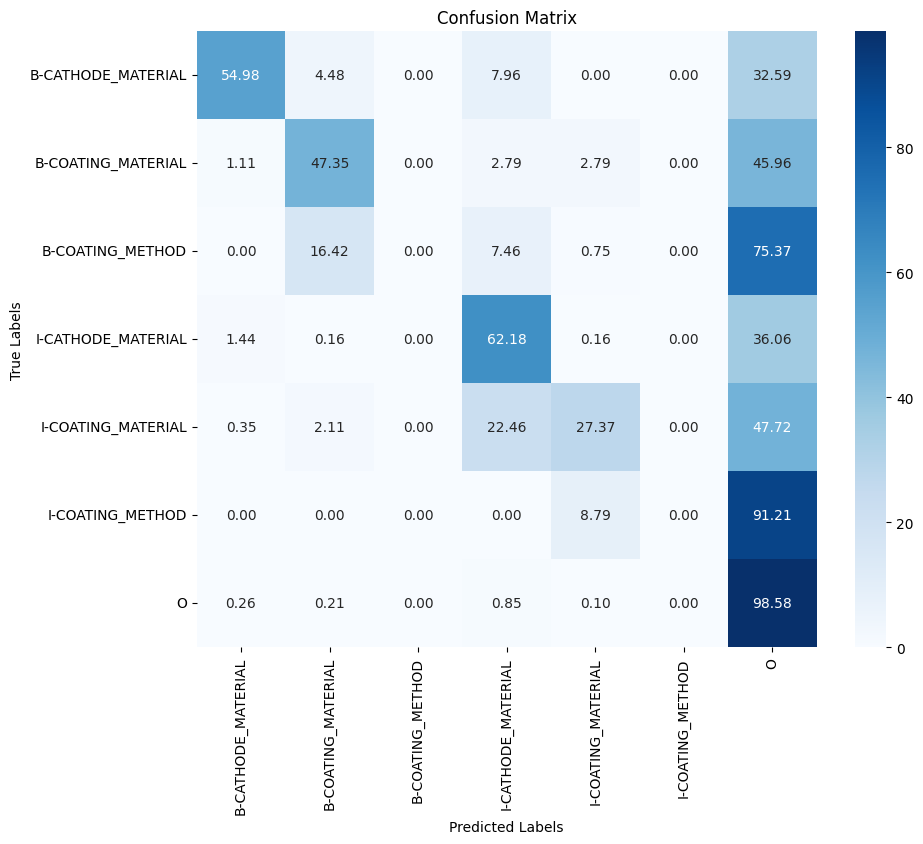

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 224ms/step - loss: 0.2728 - custom_acc_orig_tokens: 0.9285 - custom_acc_orig_non_other_tokens: 0.1620 - val_loss: 0.1513 - val_custom_acc_orig_tokens: 0.9572 - val_custom_acc_orig_non_other_tokens: 0.4023 - precision: 0.9494 - recall: 0.9592 - f1: 0.9543 - accuracy: 0.9565
Epoch 2/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1511 - custom_acc_orig_tokens: 0.9549 - custom_acc_orig_non_other_tokens: 0.2858 - val_loss: 0.1513 - val_custom_acc_orig_tokens: 0.9572 - val_custom_acc_orig_non_other_tokens: 0.4023 - precision: 0.9494 - recall: 0.9592 - f1: 0.9543 - accuracy: 0.9565
Epoch 3/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1517 - custom_acc_orig_tokens: 0.9546 - custom_acc_orig_non_other_tokens: 0.2831 - val_loss: 0.1513 - val_custom_acc_orig_tokens: 0.9572 - val_custom_acc_orig_non_other_tokens: 0.4023 - precision: 0.9494 - recall: 0.9592 - f1: 0.9543 - accuracy: 0.9565


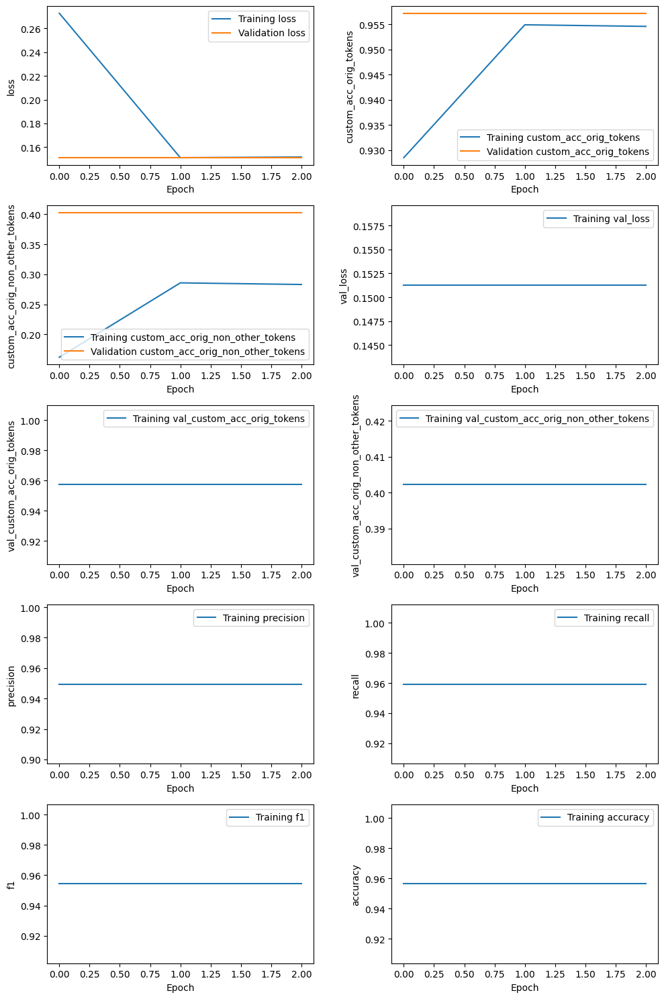

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_5e-05_r3_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.341,0.400,0.368,420,,
COATING_MATERIAL,0.353,0.214,0.267,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.345,0.268,0.302,,0.950,0.513


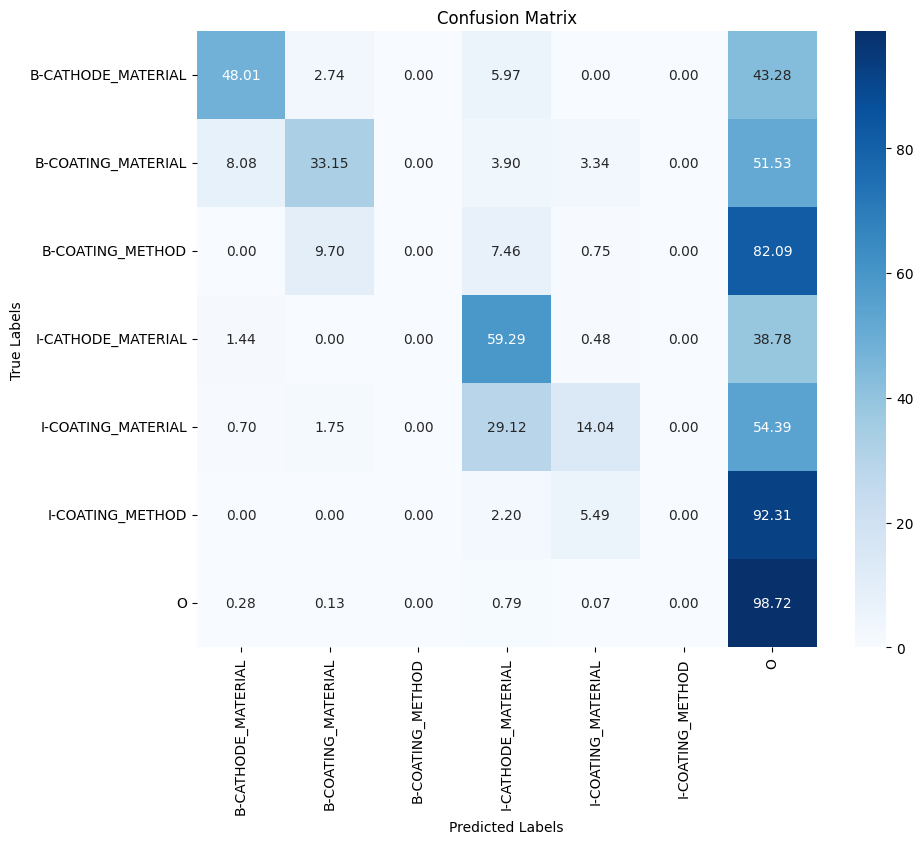

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 57s 221ms/step - loss: 0.2508 - custom_acc_orig_tokens: 0.9325 - custom_acc_orig_non_other_tokens: 0.2684 - val_loss: 0.1296 - val_custom_acc_orig_tokens: 0.9637 - val_custom_acc_orig_non_other_tokens: 0.5684 - precision: 0.9576 - recall: 0.9629 - f1: 0.9602 - accuracy: 0.9627
Epoch 2/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1285 - custom_acc_orig_tokens: 0.9624 - custom_acc_orig_non_other_tokens: 0.4742 - val_loss: 0.1296 - val_custom_acc_orig_tokens: 0.9637 - val_custom_acc_orig_non_other_tokens: 0.5684 - precision: 0.9576 - recall: 0.9629 - f1: 0.9602 - accuracy: 0.9627
Epoch 3/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1286 - custom_acc_orig_tokens: 0.9621 - custom_acc_orig_non_other_tokens: 0.4646 - val_loss: 0.1296 - val_custom_acc_orig_tokens: 0.9637 - val_custom_acc_orig_non_other_tokens: 0.5684 - precision: 0.9576 - recall: 0.9629 - f1: 0.9602 - accuracy: 0.9627


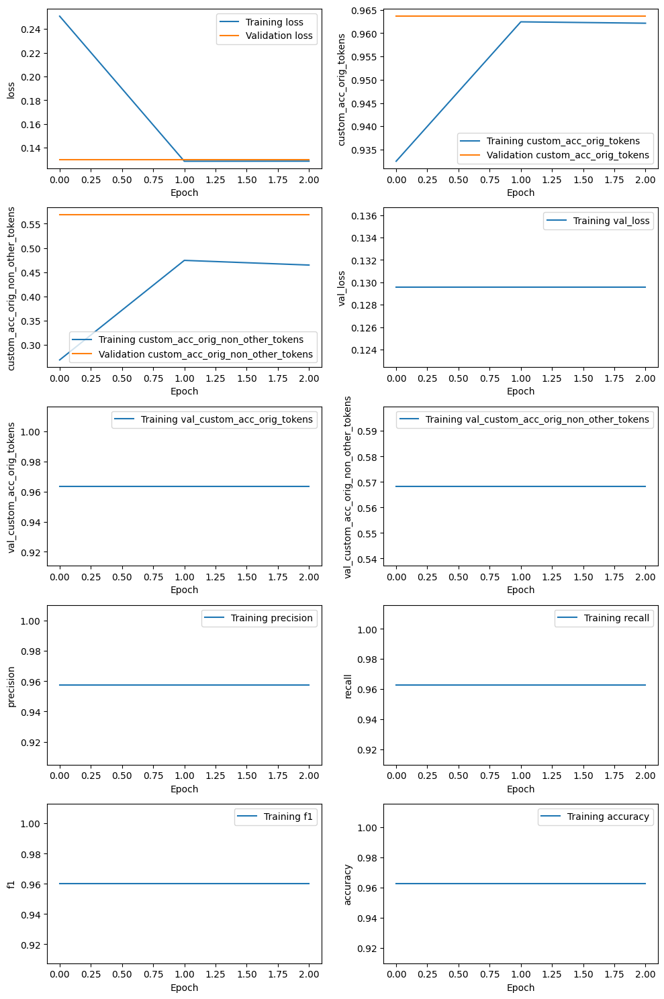

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r1_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r1_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r1_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.478,0.650,0.551,420,,
COATING_MATERIAL,0.486,0.446,0.465,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.481,0.474,0.478,,0.956,0.608


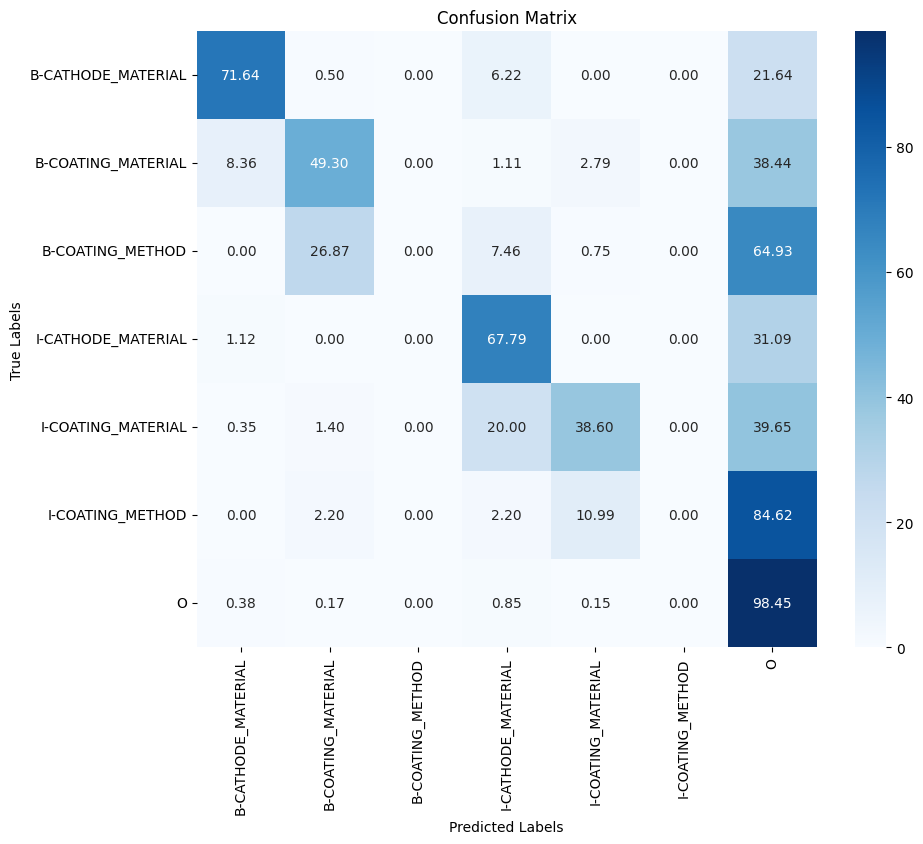

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 55s 224ms/step - loss: 0.2492 - custom_acc_orig_tokens: 0.9339 - custom_acc_orig_non_other_tokens: 0.2409 - val_loss: 0.1350 - val_custom_acc_orig_tokens: 0.9629 - val_custom_acc_orig_non_other_tokens: 0.5472 - precision: 0.9562 - recall: 0.9626 - f1: 0.9594 - accuracy: 0.9618
Epoch 2/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1332 - custom_acc_orig_tokens: 0.9607 - custom_acc_orig_non_other_tokens: 0.4358 - val_loss: 0.1350 - val_custom_acc_orig_tokens: 0.9629 - val_custom_acc_orig_non_other_tokens: 0.5472 - precision: 0.9562 - recall: 0.9626 - f1: 0.9594 - accuracy: 0.9618
Epoch 3/3
160/160 [==============================] - 25s 155ms/step - loss: 0.1327 - custom_acc_orig_tokens: 0.9607 - custom_acc_orig_non_other_tokens: 0.4327 - val_loss: 0.1350 - val_custom_acc_orig_tokens: 0.9629 - val_custom_acc_orig_non_other_tokens: 0.5472 - precision: 0.9562 - recall: 0.9626 - f1: 0.9594 - accuracy: 0.9618


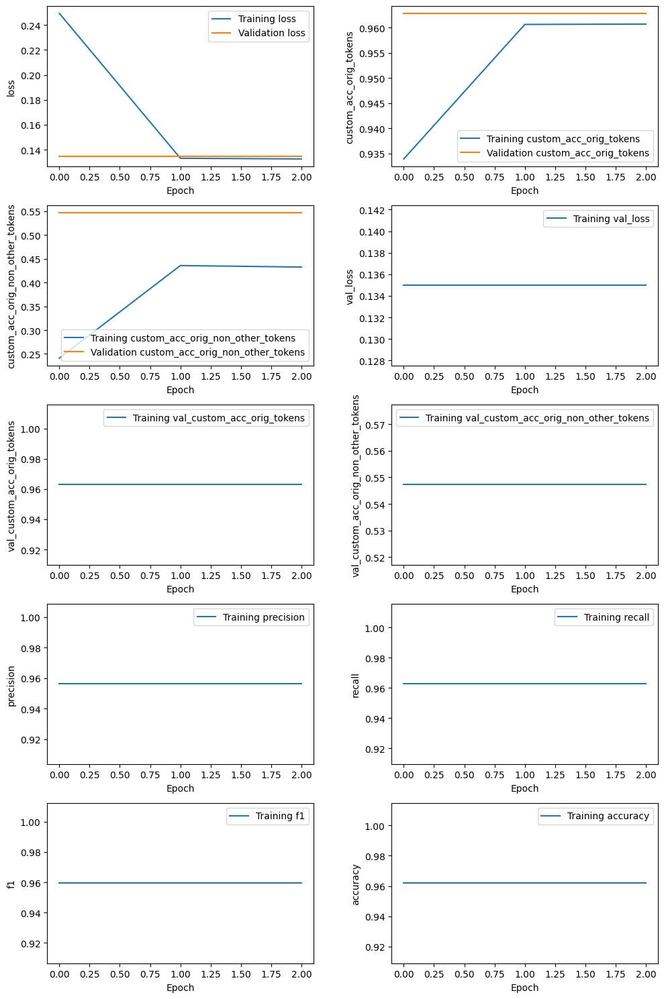

160/160 [==============================] - 12s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r2_train_predictions.json in the repository.
29/29 [==============================] - 2s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r2_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r2_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.437,0.621,0.513,420,,
COATING_MATERIAL,0.434,0.396,0.414,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.436,0.441,0.439,,0.955,0.593


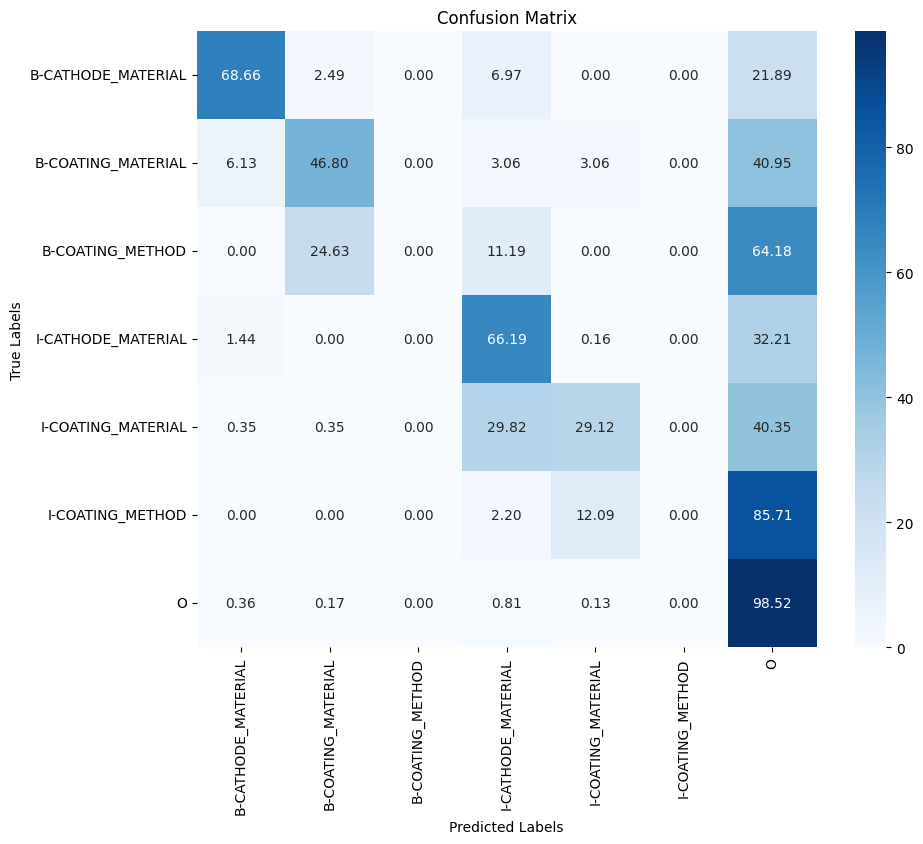

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


160/160 [==============================] - 57s 221ms/step - loss: 0.2519 - custom_acc_orig_tokens: 0.9337 - custom_acc_orig_non_other_tokens: 0.2288 - val_loss: 0.1411 - val_custom_acc_orig_tokens: 0.9602 - val_custom_acc_orig_non_other_tokens: 0.5111 - precision: 0.9532 - recall: 0.9610 - f1: 0.9571 - accuracy: 0.9591
Epoch 2/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1384 - custom_acc_orig_tokens: 0.9585 - custom_acc_orig_non_other_tokens: 0.3941 - val_loss: 0.1411 - val_custom_acc_orig_tokens: 0.9602 - val_custom_acc_orig_non_other_tokens: 0.5111 - precision: 0.9532 - recall: 0.9610 - f1: 0.9571 - accuracy: 0.9591
Epoch 3/3
160/160 [==============================] - 25s 156ms/step - loss: 0.1387 - custom_acc_orig_tokens: 0.9587 - custom_acc_orig_non_other_tokens: 0.3946 - val_loss: 0.1411 - val_custom_acc_orig_tokens: 0.9602 - val_custom_acc_orig_non_other_tokens: 0.5111 - precision: 0.9532 - recall: 0.9610 - f1: 0.9571 - accuracy: 0.9591


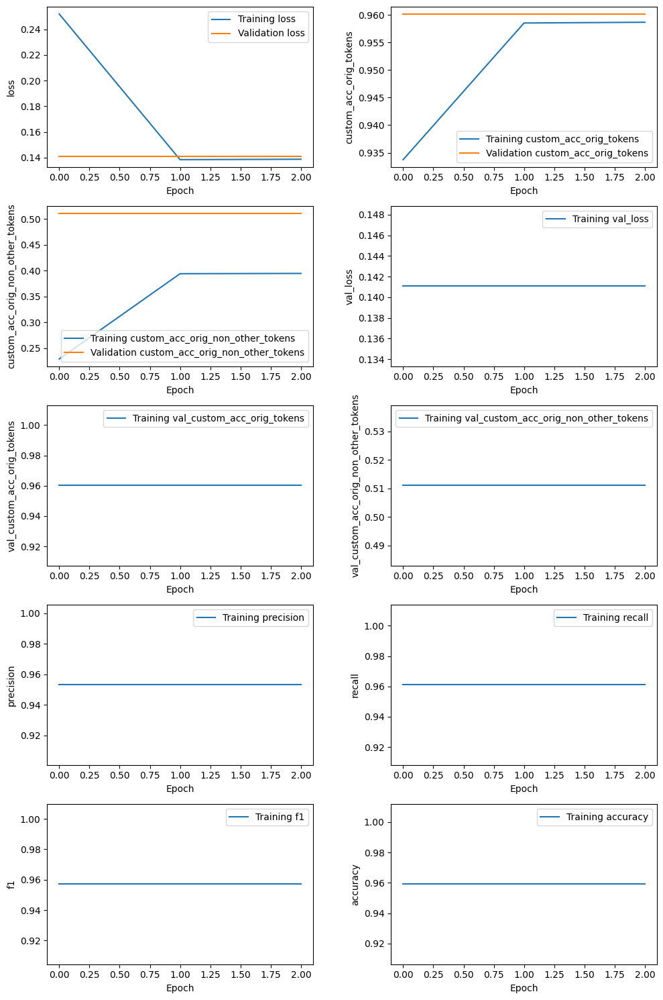

160/160 [==============================] - 12s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r3_train_predictions.json in the repository.
29/29 [==============================] - 2s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r3_val_predictions.json in the repository.
47/47 [==============================] - 3s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_battery_all_concat_64_8e-05_r3_eval_predictions.json in the repository.


/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
CATHODE_MATERIAL,0.402,0.612,0.485,420,,
COATING_MATERIAL,0.418,0.318,0.361,359,,
COATING_METHOD,0.000,0.000,0.000,134,,
OVERALL,0.407,0.406,0.407,,0.953,0.576


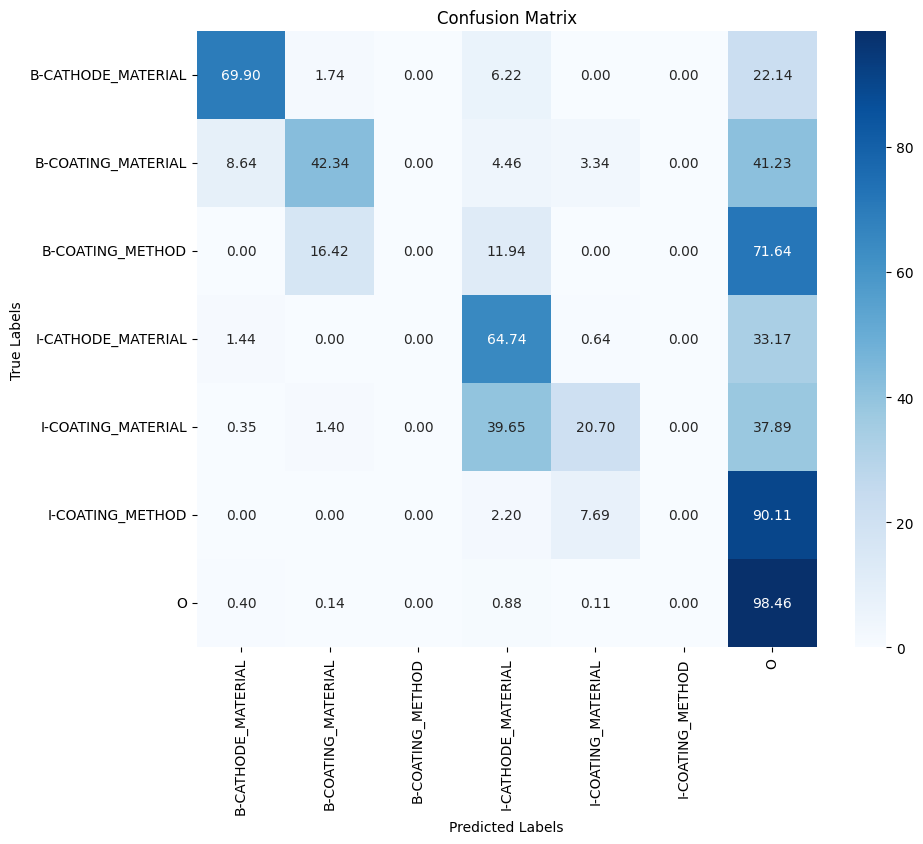

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['However', ',', 'no', 'more', 'cycles', 'have', 'been', 'performed', 'in', 'contrast', 'with', 'Li', '/', 'LiFePO4', 'cell', 'with', 'the', 'same', 'solid', 'electrolyte', '.', 'In', 'turn', ',', 'Choi', 'et', 'al', '.', '[', '118', ']', 'investigated', 'hybrid', 'solid', 'electrolyte', 'based', 'on', 'PEO', '-', 'LiClO4', 'system', 'with', 'addition', 'of', '52', '.']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-CATHODE_MATERIAL', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['The', 'relatively', 'low', 'cont

In [ ]:
# Battery dataset -- fine-tune appraoch w/ concatenation of last 4 hidden layers (9 hyperparameter combinations)

start_time = timeit.default_timer()

scibert_models1 = run_models(
    checkpoint='SpanBERT/spanbert-base-cased',
    name_prefix='C_',
    dataset='battery',
    train_strategy='all', # ['none', 'some', 'all']
    retrain_layers=list(range(12)),  # []
    feedforward_strategies=['concat'],  # ['last', 'concat']
    concat_layers=[8,9,10,11],
    batch_sizes=[16,32,64], # [16,32,64]
    init_lrs=[2e-5,5e-5,8e-5]) # [2e-5,5e-5,8e-5]


elapsed = timeit.default_timer() - start_time
print(f"\n\n{elapsed} seconds")
# A100:  8043s/27replicates = 5.0mins/replicate

### catalyst_fine-tune(4-layer)

Map:   0%|          | 0/8409 [00:00<?, ? examples/s]

Map:   0%|          | 0/1485 [00:00<?, ? examples/s]

Map:   0%|          | 0/2474 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/datasets/arrow_dataset.py:410: FutureWarning: The output of `to_tf_dataset` will change when a passing single element list for `labels` or `columns` in the next datasets version. To return a tuple structure rather than dict, pass a single string.
Old behaviour: columns=['a'], labels=['labels'] -> (tf.Tensor, tf.Tensor)  
             : columns='a', labels='labels' -> (tf.Tensor, tf.Tensor)  
New behaviour: columns=['a'],labels=['labels'] -> ({'a': tf.Tensor}, {'labels': tf.Tensor})  
             : columns='a', labels='labels' -> (tf.Tensor, tf.Tensor) 
  warnings.warn(



                    		C_spanbert_catalyst_all_concat_16_2e-05_r1


All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 175ms/step - loss: 0.2183 - custom_acc_orig_tokens: 0.9613 - custom_acc_orig_non_other_tokens: 0.1738 - val_loss: 0.1001 - val_custom_acc_orig_tokens: 0.9781 - val_custom_acc_orig_non_other_tokens: 0.2057 - precision: 0.9761 - recall: 0.9863 - f1: 0.9812 - accuracy: 0.9770
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0537 - custom_acc_orig_tokens: 0.9806 - custom_acc_orig_non_other_tokens: 0.4536 - val_loss: 0.0484 - val_custom_acc_orig_tokens: 0.9840 - val_custom_acc_orig_non_other_tokens: 0.4579 - precision: 0.9828 - recall: 0.9878 - f1: 0.9853 - accuracy: 0.9831
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0342 - custom_acc_orig_tokens: 0.9870 - custom_acc_orig_non_other_tokens: 0.5932 - val_loss: 0.0340 - val_custom_acc_orig_tokens: 0.9885 - val_custom_acc_orig_non_other_tokens: 0.6017 - precision: 0.9879 - recall: 0.9884 - f1: 0.9882 - accuracy: 0.9877


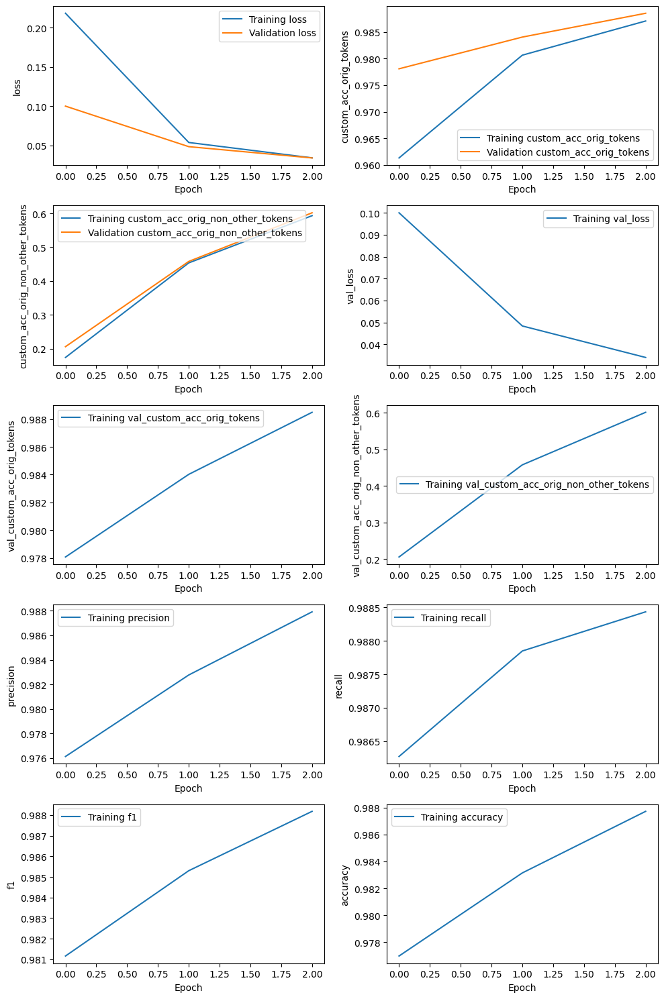

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r1_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.316,0.471,0.378,153,,
OLEFIN,0.568,0.815,0.669,356,,
PRE_CATALYST,0.605,0.732,0.662,71,,
SOLVENT,0.926,0.481,0.633,131,,
SUPPORT,0.505,0.554,0.529,83,,
OVERALL,0.532,0.659,0.588,,0.985,0.743


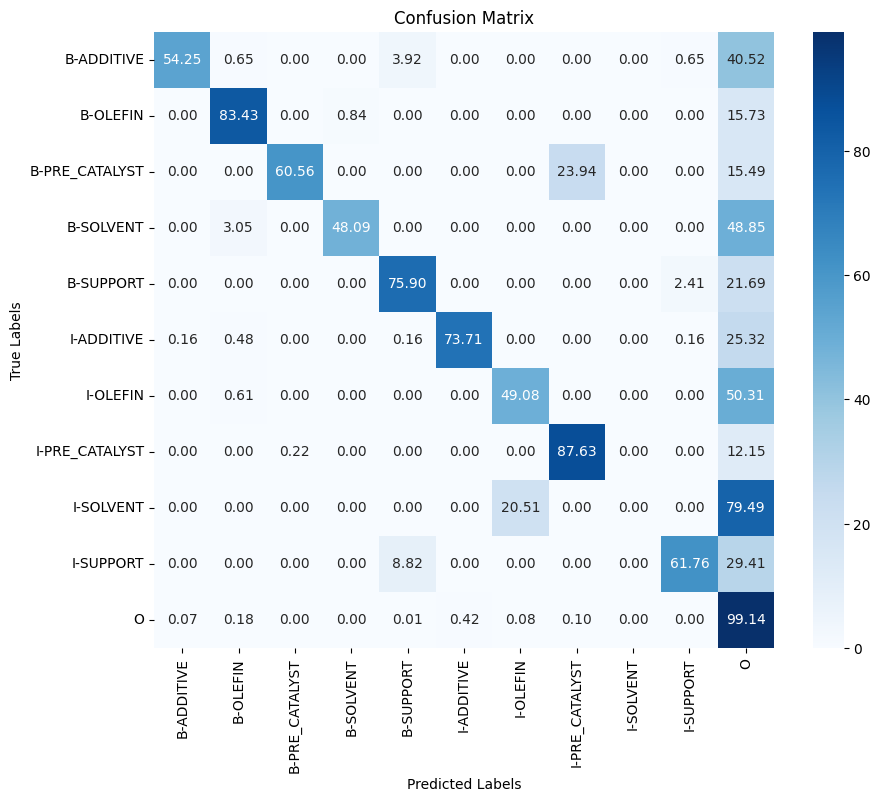

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 173ms/step - loss: 0.2528 - custom_acc_orig_tokens: 0.9420 - custom_acc_orig_non_other_tokens: 0.1760 - val_loss: 0.0958 - val_custom_acc_orig_tokens: 0.9805 - val_custom_acc_orig_non_other_tokens: 0.2607 - precision: 0.9790 - recall: 0.9865 - f1: 0.9828 - accuracy: 0.9796
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0574 - custom_acc_orig_tokens: 0.9803 - custom_acc_orig_non_other_tokens: 0.4279 - val_loss: 0.0465 - val_custom_acc_orig_tokens: 0.9844 - val_custom_acc_orig_non_other_tokens: 0.4418 - precision: 0.9833 - recall: 0.9884 - f1: 0.9858 - accuracy: 0.9836
Epoch 3/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0347 - custom_acc_orig_tokens: 0.9875 - custom_acc_orig_non_other_tokens: 0.5807 - val_loss: 0.0343 - val_custom_acc_orig_tokens: 0.9890 - val_custom_acc_orig_non_other_tokens: 0.5946 - precision: 0.9885 - recall: 0.9885 - f1: 0.9885 - accuracy: 0.9883


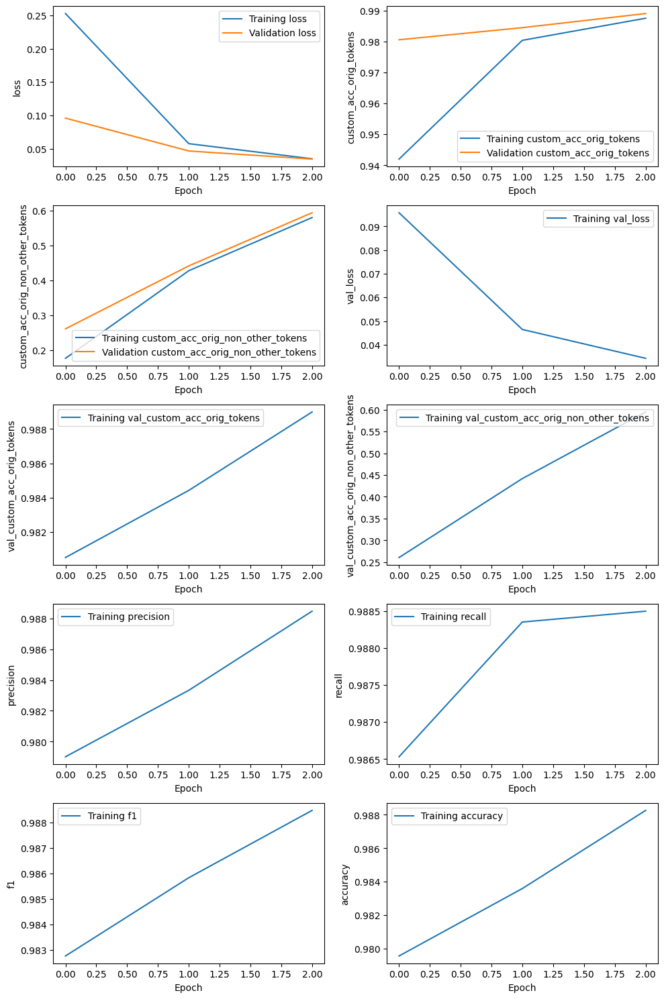

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r2_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.323,0.464,0.381,153,,
OLEFIN,0.584,0.801,0.675,356,,
PRE_CATALYST,0.541,0.648,0.590,71,,
SOLVENT,0.930,0.504,0.653,131,,
SUPPORT,0.494,0.530,0.512,83,,
OVERALL,0.537,0.645,0.586,,0.985,0.749


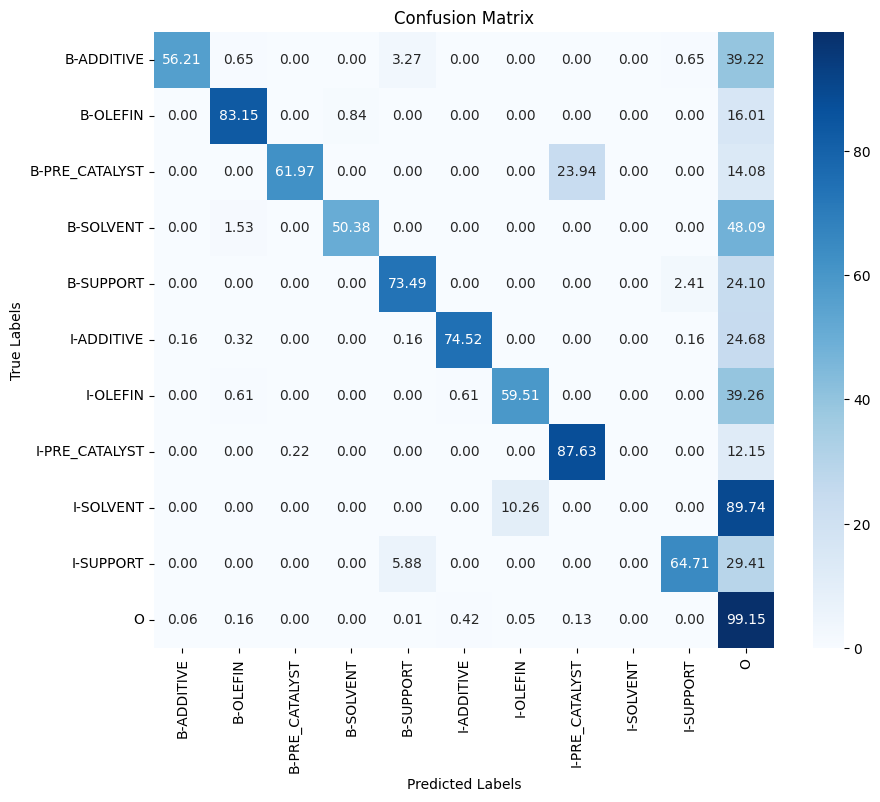

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 176ms/step - loss: 0.2686 - custom_acc_orig_tokens: 0.9276 - custom_acc_orig_non_other_tokens: 0.1660 - val_loss: 0.0782 - val_custom_acc_orig_tokens: 0.9817 - val_custom_acc_orig_non_other_tokens: 0.3101 - precision: 0.9805 - recall: 0.9859 - f1: 0.9832 - accuracy: 0.9807
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0578 - custom_acc_orig_tokens: 0.9801 - custom_acc_orig_non_other_tokens: 0.4302 - val_loss: 0.0521 - val_custom_acc_orig_tokens: 0.9843 - val_custom_acc_orig_non_other_tokens: 0.4191 - precision: 0.9826 - recall: 0.9886 - f1: 0.9856 - accuracy: 0.9835
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0362 - custom_acc_orig_tokens: 0.9870 - custom_acc_orig_non_other_tokens: 0.5748 - val_loss: 0.0347 - val_custom_acc_orig_tokens: 0.9881 - val_custom_acc_orig_non_other_tokens: 0.6178 - precision: 0.9885 - recall: 0.9875 - f1: 0.9880 - accuracy: 0.9874


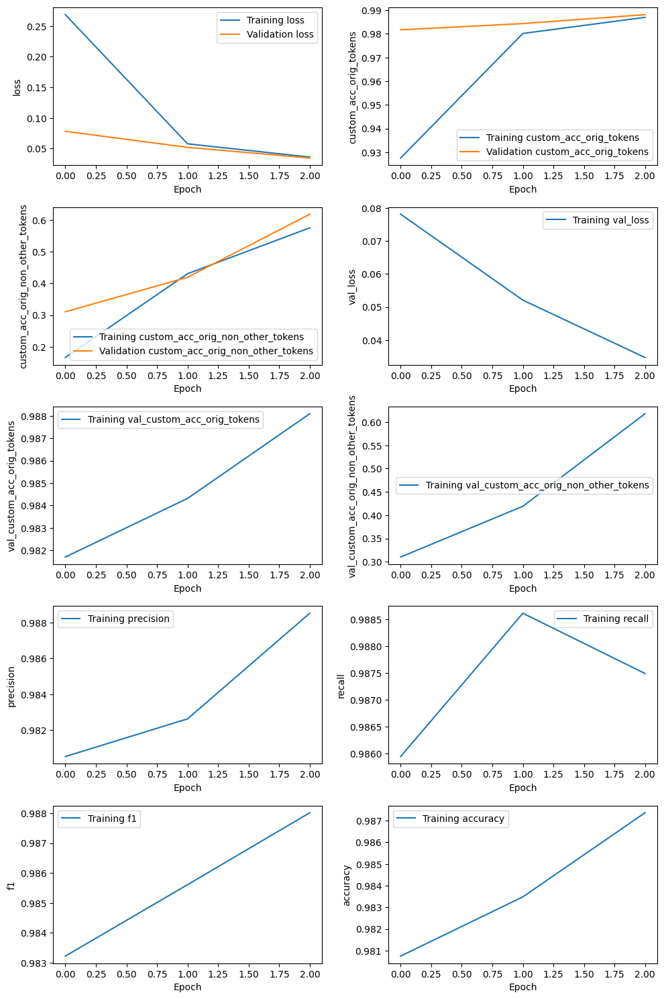

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_2e-05_r3_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.397,0.529,0.454,153,,
OLEFIN,0.573,0.806,0.670,356,,
PRE_CATALYST,0.447,0.535,0.487,71,,
SOLVENT,0.821,0.527,0.642,131,,
SUPPORT,0.442,0.506,0.472,83,,
OVERALL,0.534,0.651,0.587,,0.985,0.757


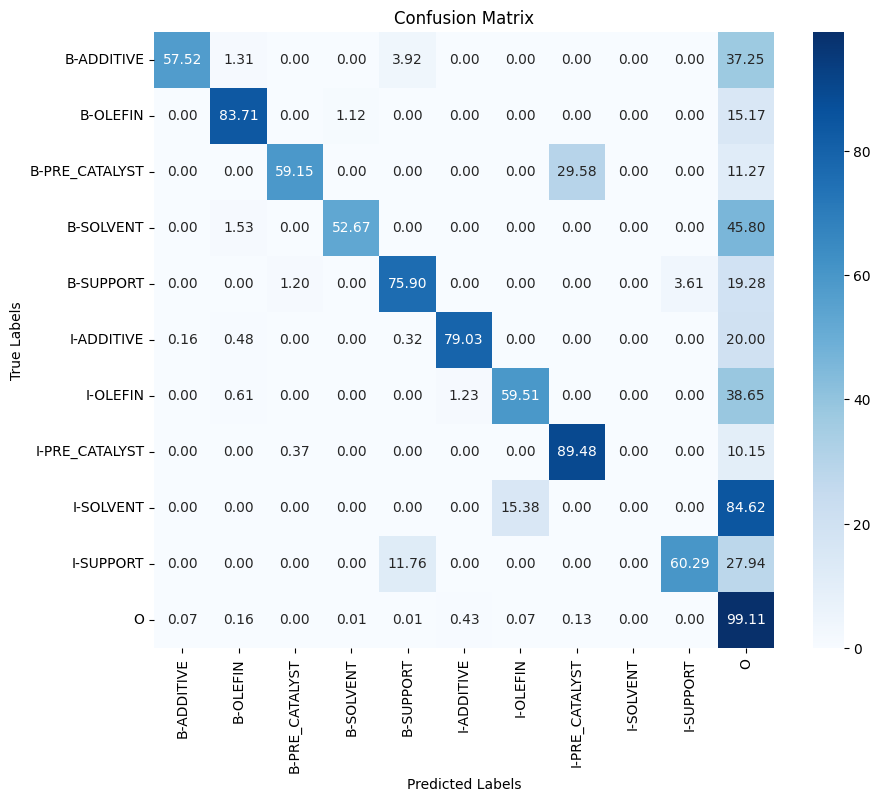

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 175ms/step - loss: 0.1735 - custom_acc_orig_tokens: 0.9656 - custom_acc_orig_non_other_tokens: 0.2480 - val_loss: 0.0877 - val_custom_acc_orig_tokens: 0.9815 - val_custom_acc_orig_non_other_tokens: 0.4167 - precision: 0.9801 - recall: 0.9873 - f1: 0.9837 - accuracy: 0.9806
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0473 - custom_acc_orig_tokens: 0.9825 - custom_acc_orig_non_other_tokens: 0.5472 - val_loss: 0.0468 - val_custom_acc_orig_tokens: 0.9848 - val_custom_acc_orig_non_other_tokens: 0.5530 - precision: 0.9837 - recall: 0.9883 - f1: 0.9860 - accuracy: 0.9839
Epoch 3/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0271 - custom_acc_orig_tokens: 0.9891 - custom_acc_orig_non_other_tokens: 0.6784 - val_loss: 0.0307 - val_custom_acc_orig_tokens: 0.9882 - val_custom_acc_orig_non_other_tokens: 0.6546 - precision: 0.9885 - recall: 0.9881 - f1: 0.9883 - accuracy: 0.9874


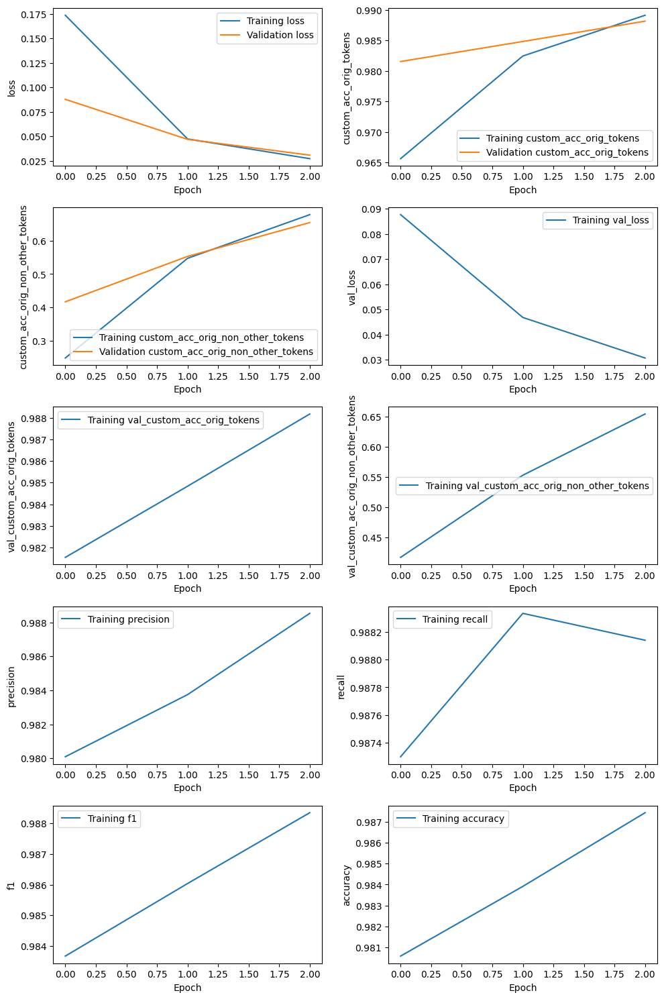

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r1_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.422,0.621,0.503,153,,
OLEFIN,0.588,0.787,0.673,356,,
PRE_CATALYST,0.587,0.761,0.663,71,,
SOLVENT,0.824,0.641,0.721,131,,
SUPPORT,0.676,0.855,0.755,83,,
OVERALL,0.584,0.736,0.651,,0.984,0.741


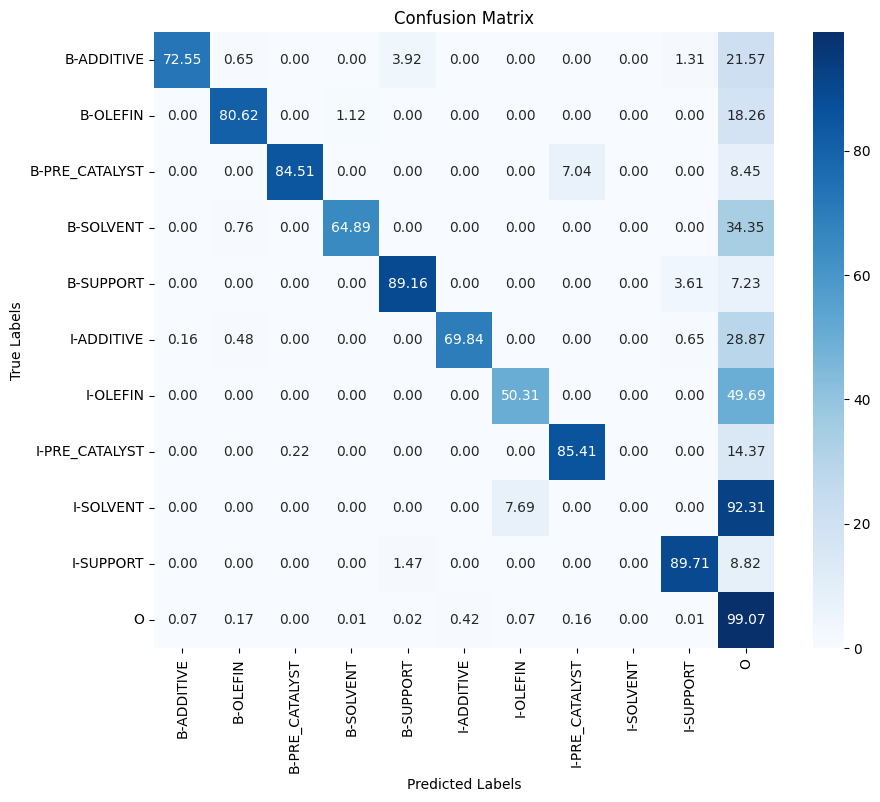

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 174ms/step - loss: 0.1964 - custom_acc_orig_tokens: 0.9535 - custom_acc_orig_non_other_tokens: 0.2435 - val_loss: 0.1457 - val_custom_acc_orig_tokens: 0.9723 - val_custom_acc_orig_non_other_tokens: 0.2469 - precision: 0.9704 - recall: 0.9849 - f1: 0.9776 - accuracy: 0.9711
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0466 - custom_acc_orig_tokens: 0.9835 - custom_acc_orig_non_other_tokens: 0.5409 - val_loss: 0.0370 - val_custom_acc_orig_tokens: 0.9868 - val_custom_acc_orig_non_other_tokens: 0.6418 - precision: 0.9871 - recall: 0.9878 - f1: 0.9874 - accuracy: 0.9861
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0258 - custom_acc_orig_tokens: 0.9897 - custom_acc_orig_non_other_tokens: 0.6882 - val_loss: 0.0286 - val_custom_acc_orig_tokens: 0.9896 - val_custom_acc_orig_non_other_tokens: 0.6705 - precision: 0.9899 - recall: 0.9895 - f1: 0.9897 - accuracy: 0.9889


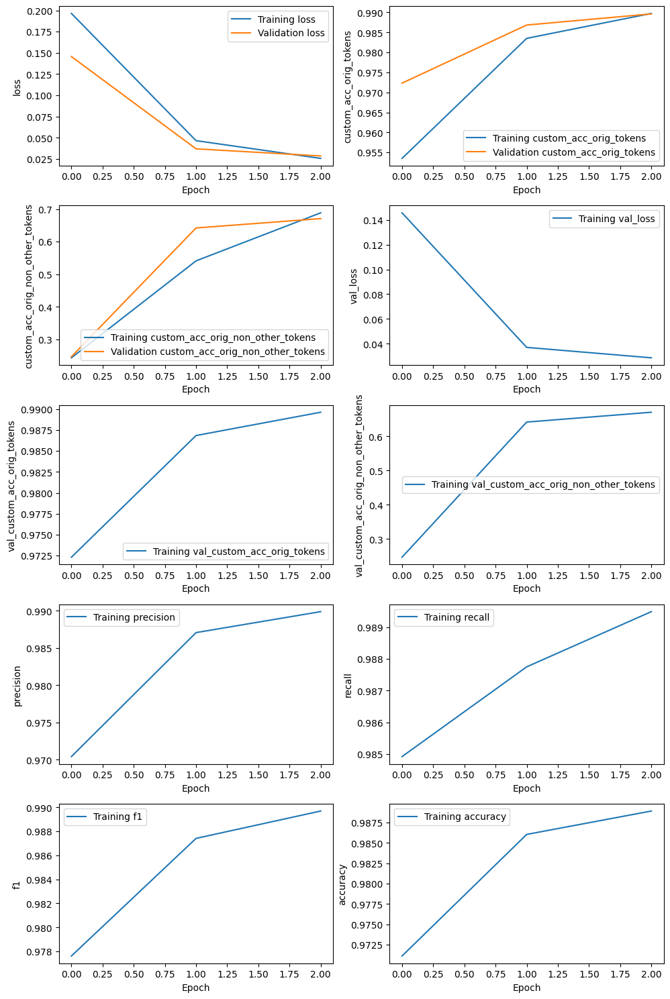

526/526 [==============================] - 32s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r2_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.376,0.601,0.462,153,,
OLEFIN,0.603,0.787,0.683,356,,
PRE_CATALYST,0.648,0.803,0.717,71,,
SOLVENT,0.811,0.656,0.726,131,,
SUPPORT,0.667,0.771,0.715,83,,
OVERALL,0.580,0.729,0.646,,0.985,0.754


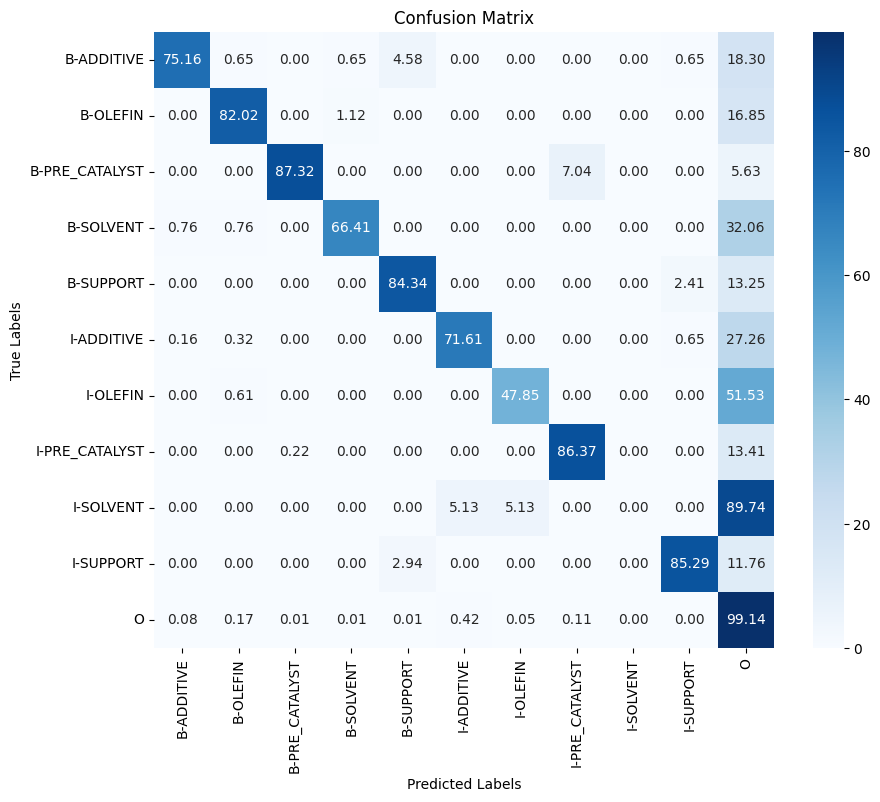

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 173ms/step - loss: 0.2064 - custom_acc_orig_tokens: 0.9431 - custom_acc_orig_non_other_tokens: 0.2403 - val_loss: 0.1210 - val_custom_acc_orig_tokens: 0.9732 - val_custom_acc_orig_non_other_tokens: 0.2711 - precision: 0.9711 - recall: 0.9828 - f1: 0.9769 - accuracy: 0.9720
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0466 - custom_acc_orig_tokens: 0.9828 - custom_acc_orig_non_other_tokens: 0.5534 - val_loss: 0.0413 - val_custom_acc_orig_tokens: 0.9855 - val_custom_acc_orig_non_other_tokens: 0.5928 - precision: 0.9847 - recall: 0.9886 - f1: 0.9866 - accuracy: 0.9846
Epoch 3/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0265 - custom_acc_orig_tokens: 0.9892 - custom_acc_orig_non_other_tokens: 0.6842 - val_loss: 0.0278 - val_custom_acc_orig_tokens: 0.9896 - val_custom_acc_orig_non_other_tokens: 0.6908 - precision: 0.9891 - recall: 0.9899 - f1: 0.9895 - accuracy: 0.9889


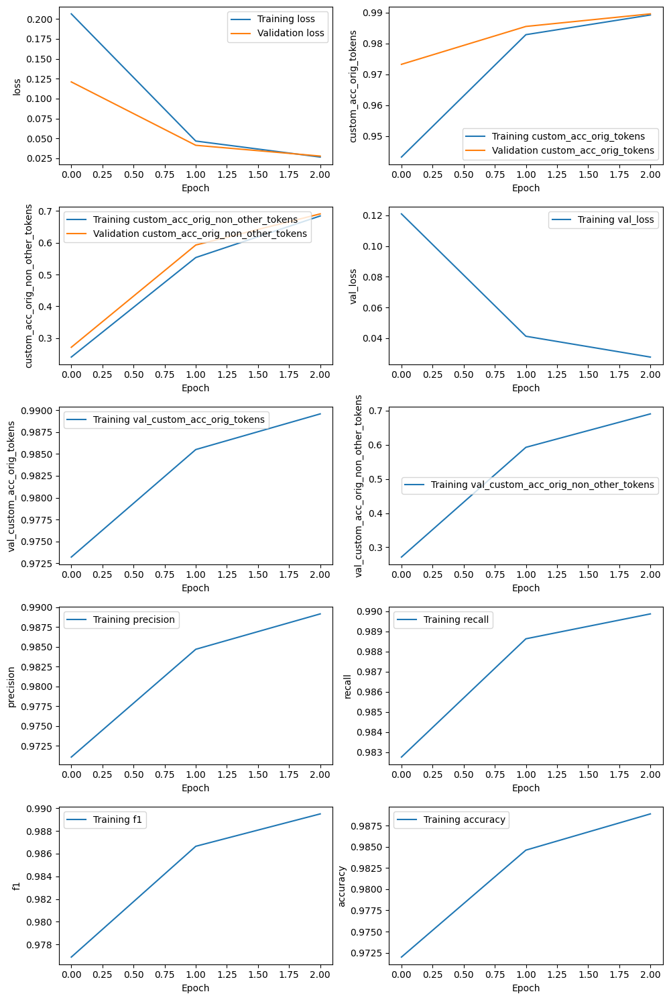

526/526 [==============================] - 33s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 9s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_5e-05_r3_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.420,0.621,0.501,153,,
OLEFIN,0.590,0.789,0.675,356,,
PRE_CATALYST,0.640,0.775,0.701,71,,
SOLVENT,0.848,0.595,0.700,131,,
SUPPORT,0.683,0.831,0.750,83,,
OVERALL,0.589,0.728,0.651,,0.986,0.768


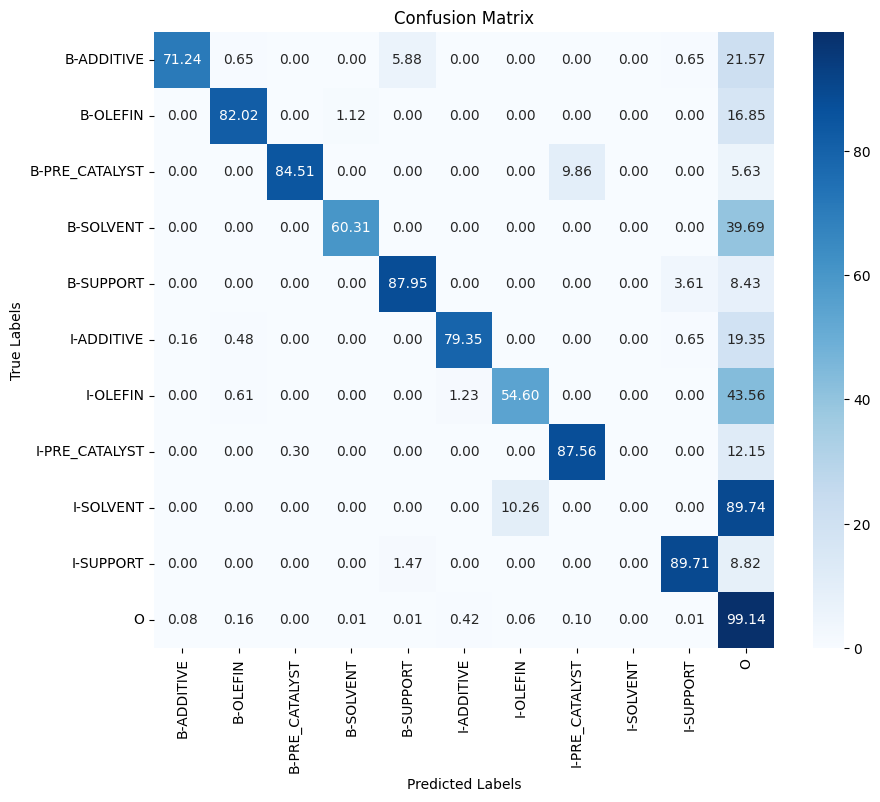

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 112s 176ms/step - loss: 0.1729 - custom_acc_orig_tokens: 0.9622 - custom_acc_orig_non_other_tokens: 0.2000 - val_loss: 0.1253 - val_custom_acc_orig_tokens: 0.9729 - val_custom_acc_orig_non_other_tokens: 0.2920 - precision: 0.9710 - recall: 0.9873 - f1: 0.9791 - accuracy: 0.9717
Epoch 2/3
526/526 [==============================] - 82s 156ms/step - loss: 0.0483 - custom_acc_orig_tokens: 0.9818 - custom_acc_orig_non_other_tokens: 0.5387 - val_loss: 0.0452 - val_custom_acc_orig_tokens: 0.9852 - val_custom_acc_orig_non_other_tokens: 0.5765 - precision: 0.9844 - recall: 0.9881 - f1: 0.9863 - accuracy: 0.9843
Epoch 3/3
526/526 [==============================] - 82s 156ms/step - loss: 0.0273 - custom_acc_orig_tokens: 0.9886 - custom_acc_orig_non_other_tokens: 0.6931 - val_loss: 0.0331 - val_custom_acc_orig_tokens: 0.9894 - val_custom_acc_orig_non_other_tokens: 0.6477 - precision: 0.9889 - recall: 0.9889 - f1: 0.9889 - accuracy: 0.9886


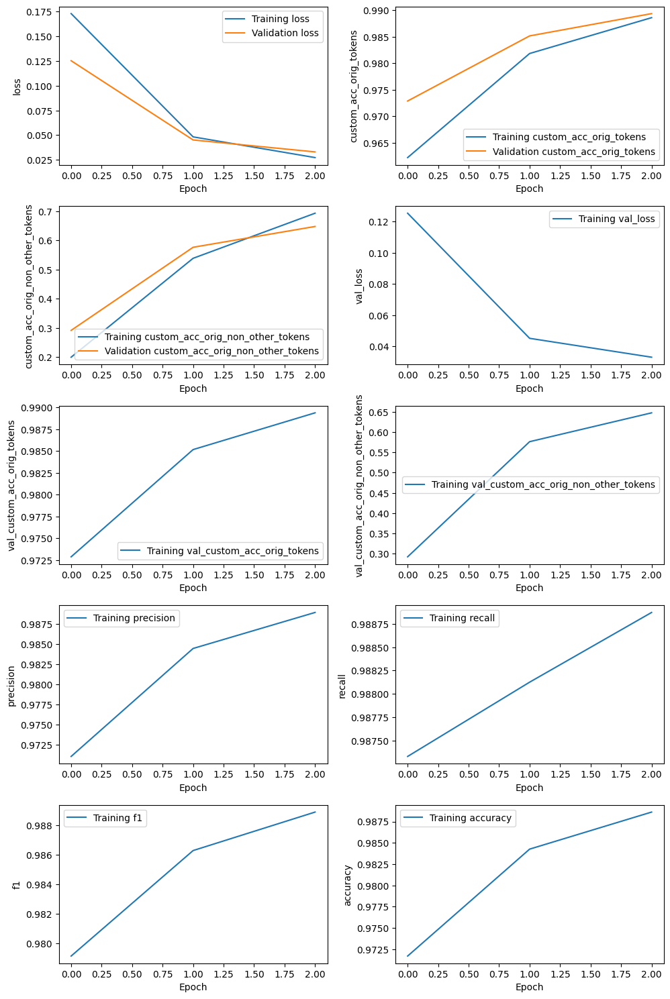

526/526 [==============================] - 33s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 56ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 9s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r1_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.435,0.614,0.509,153,,
OLEFIN,0.579,0.787,0.667,356,,
PRE_CATALYST,0.718,0.789,0.752,71,,
SOLVENT,0.813,0.664,0.731,131,,
SUPPORT,0.645,0.831,0.726,83,,
OVERALL,0.591,0.738,0.656,,0.986,0.763


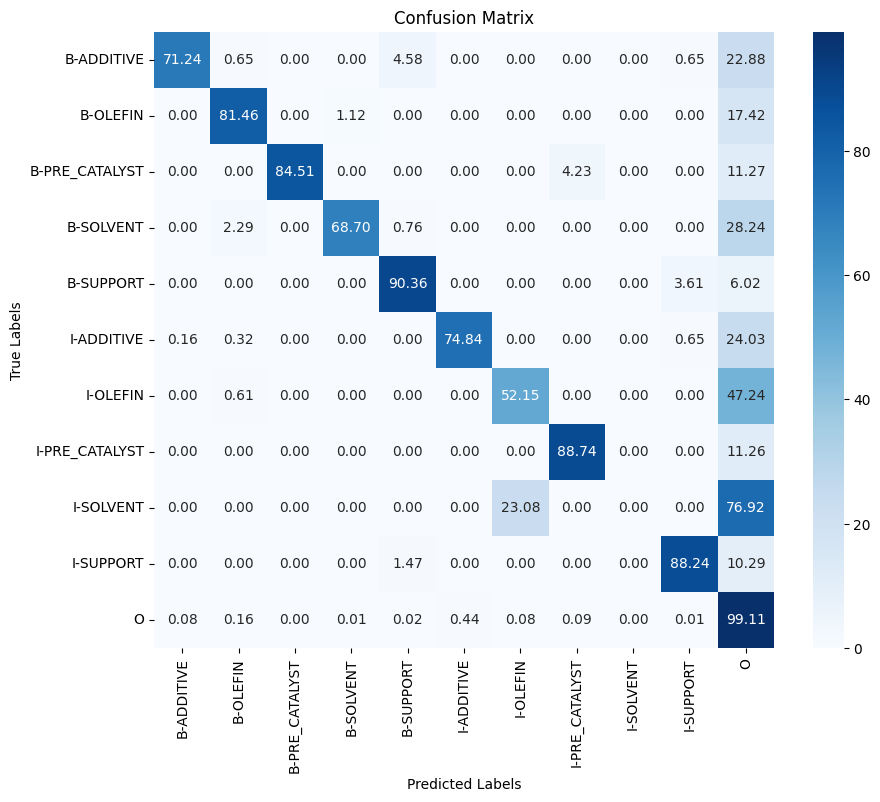

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 112s 175ms/step - loss: 0.1784 - custom_acc_orig_tokens: 0.9566 - custom_acc_orig_non_other_tokens: 0.2694 - val_loss: 0.1189 - val_custom_acc_orig_tokens: 0.9752 - val_custom_acc_orig_non_other_tokens: 0.2891 - precision: 0.9733 - recall: 0.9839 - f1: 0.9786 - accuracy: 0.9742
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0444 - custom_acc_orig_tokens: 0.9836 - custom_acc_orig_non_other_tokens: 0.5789 - val_loss: 0.0387 - val_custom_acc_orig_tokens: 0.9867 - val_custom_acc_orig_non_other_tokens: 0.5696 - precision: 0.9855 - recall: 0.9894 - f1: 0.9874 - accuracy: 0.9859
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0248 - custom_acc_orig_tokens: 0.9897 - custom_acc_orig_non_other_tokens: 0.6980 - val_loss: 0.0267 - val_custom_acc_orig_tokens: 0.9897 - val_custom_acc_orig_non_other_tokens: 0.6927 - precision: 0.9897 - recall: 0.9897 - f1: 0.9897 - accuracy: 0.9890


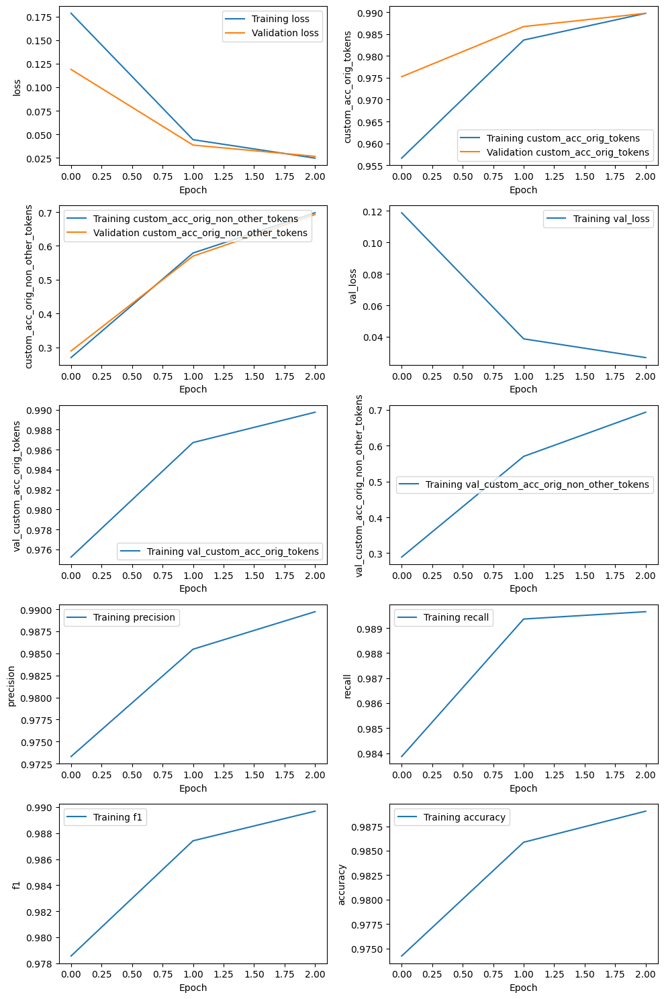

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r2_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.412,0.654,0.505,153,,
OLEFIN,0.567,0.789,0.660,356,,
PRE_CATALYST,0.674,0.817,0.739,71,,
SOLVENT,0.783,0.687,0.732,131,,
SUPPORT,0.720,0.867,0.787,83,,
OVERALL,0.578,0.757,0.655,,0.986,0.764


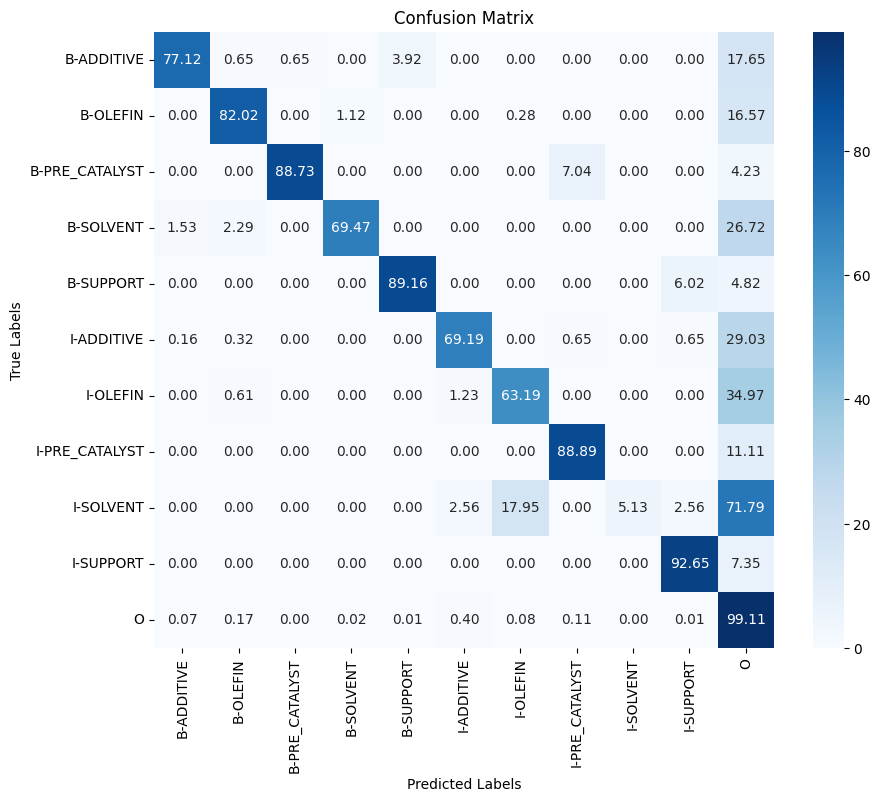

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 112s 174ms/step - loss: 0.1890 - custom_acc_orig_tokens: 0.9486 - custom_acc_orig_non_other_tokens: 0.2513 - val_loss: 0.0701 - val_custom_acc_orig_tokens: 0.9832 - val_custom_acc_orig_non_other_tokens: 0.5092 - precision: 0.9820 - recall: 0.9877 - f1: 0.9849 - accuracy: 0.9824
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0449 - custom_acc_orig_tokens: 0.9836 - custom_acc_orig_non_other_tokens: 0.5975 - val_loss: 0.0452 - val_custom_acc_orig_tokens: 0.9860 - val_custom_acc_orig_non_other_tokens: 0.5893 - precision: 0.9851 - recall: 0.9890 - f1: 0.9870 - accuracy: 0.9850
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0262 - custom_acc_orig_tokens: 0.9893 - custom_acc_orig_non_other_tokens: 0.7046 - val_loss: 0.0318 - val_custom_acc_orig_tokens: 0.9878 - val_custom_acc_orig_non_other_tokens: 0.6619 - precision: 0.9874 - recall: 0.9898 - f1: 0.9886 - accuracy: 0.9870


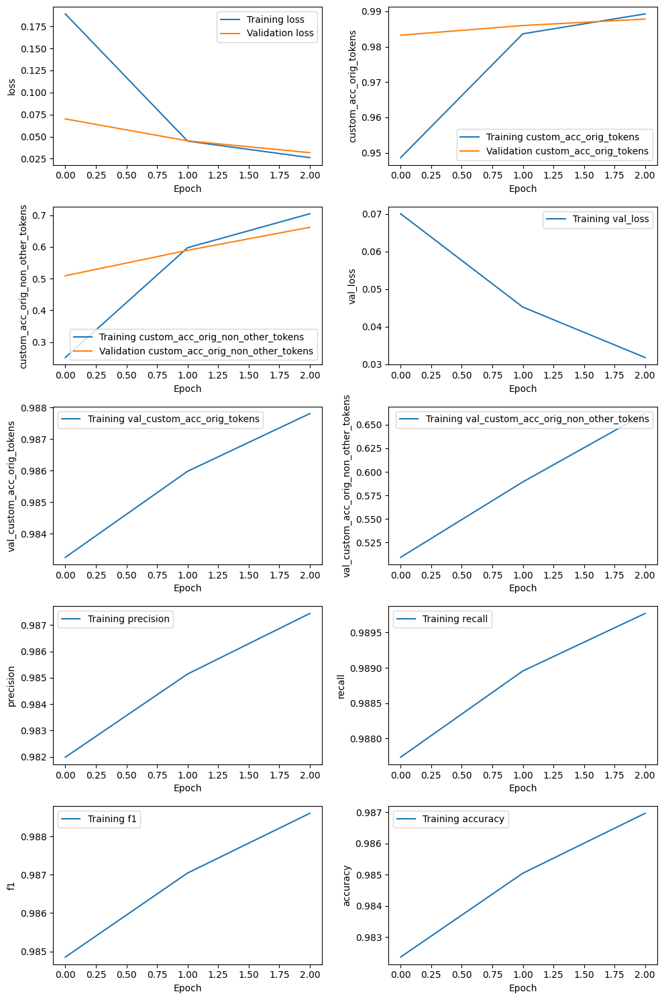

526/526 [==============================] - 33s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_16_8e-05_r3_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.446,0.654,0.531,153,,
OLEFIN,0.584,0.781,0.668,356,,
PRE_CATALYST,0.609,0.789,0.687,71,,
SOLVENT,0.764,0.641,0.697,131,,
SUPPORT,0.705,0.892,0.787,83,,
OVERALL,0.588,0.746,0.657,,0.986,0.767


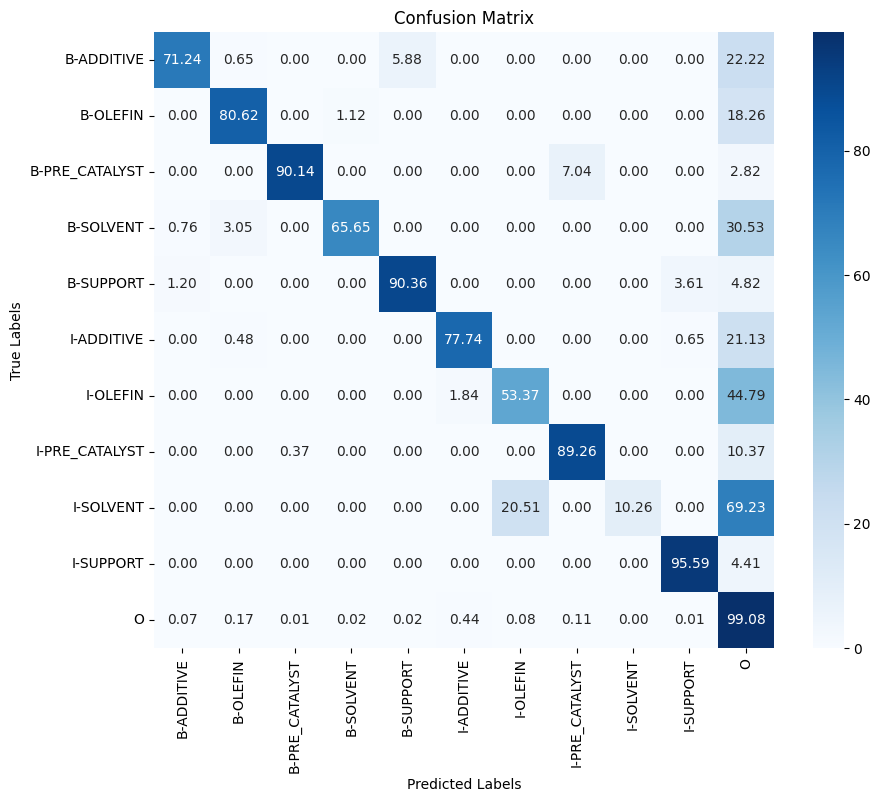

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.1874 - custom_acc_orig_tokens: 0.9644 - custom_acc_orig_non_other_tokens: 0.1983

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 111s 174ms/step - loss: 0.1874 - custom_acc_orig_tokens: 0.9644 - custom_acc_orig_non_other_tokens: 0.1983 - val_loss: 0.0669 - val_custom_acc_orig_tokens: 0.9816 - val_custom_acc_orig_non_other_tokens: 0.2475 - precision: 0.9799 - recall: 0.9861 - f1: 0.9830 - accuracy: 0.9806
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0577 - custom_acc_orig_tokens: 0.9804 - custom_acc_orig_non_other_tokens: 0.3703 - val_loss: 0.0533 - val_custom_acc_orig_tokens: 0.9830 - val_custom_acc_orig_non_other_tokens: 0.3446 - precision: 0.9823 - recall: 0.9853 - f1: 0.9838 - accuracy: 0.9820
Epoch 3/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0539 - custom_acc_orig_tokens: 0.9812 - custom_acc_orig_non_other_tokens: 0.3912 - val_loss: 0.0533 - val_custom_acc_orig_tokens: 0.9830 - val_custom_acc_orig_non_other_tokens: 0.3446 - precision: 0.9823 - recall: 0.9853 - f1: 0.9838 - accuracy: 0.9820


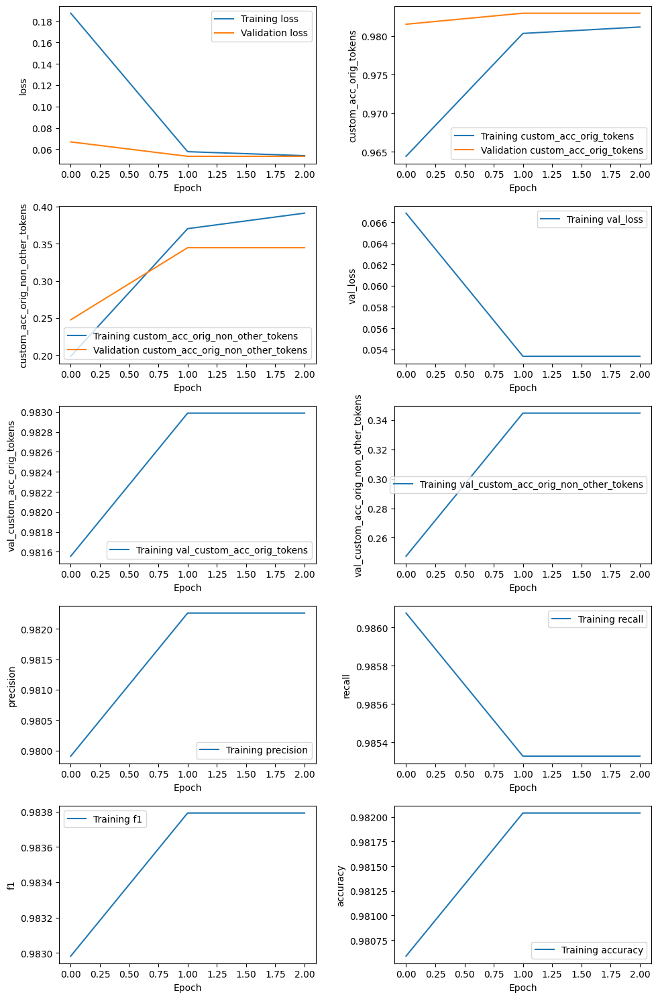

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r1_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.353,0.268,0.305,153,,
OLEFIN,0.634,0.312,0.418,356,,
PRE_CATALYST,0.156,0.211,0.180,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.428,0.210,0.282,,0.980,0.629


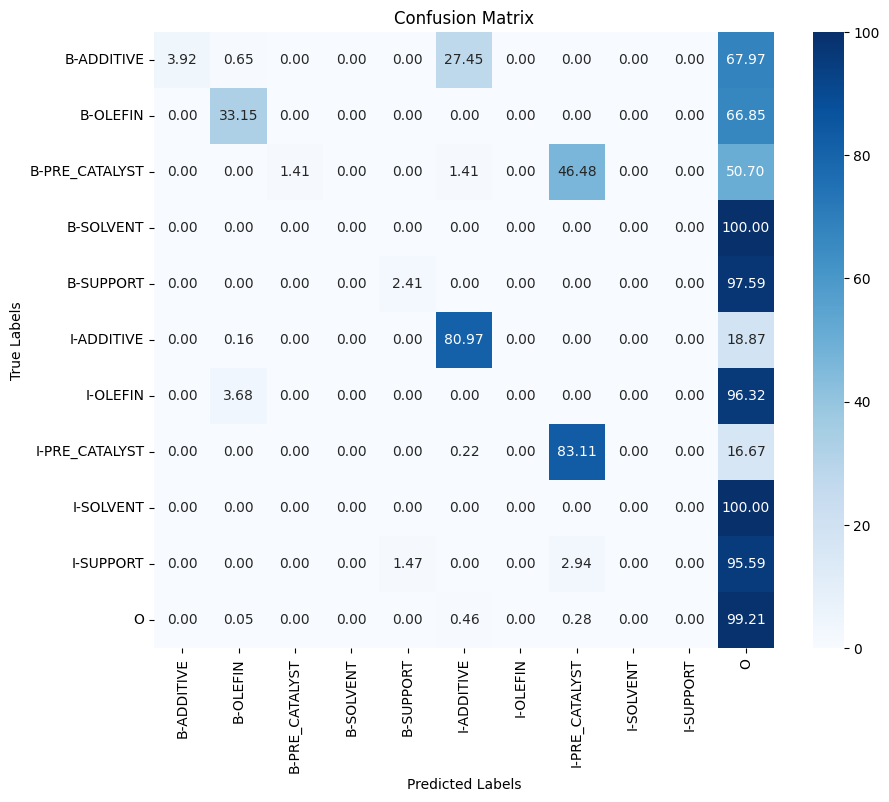

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 176ms/step - loss: 0.2140 - custom_acc_orig_tokens: 0.9506 - custom_acc_orig_non_other_tokens: 0.1909 - val_loss: 0.0707 - val_custom_acc_orig_tokens: 0.9805 - val_custom_acc_orig_non_other_tokens: 0.2412 - precision: 0.9790 - recall: 0.9860 - f1: 0.9825 - accuracy: 0.9796
Epoch 2/3
526/526 [==============================] - 82s 156ms/step - loss: 0.0613 - custom_acc_orig_tokens: 0.9796 - custom_acc_orig_non_other_tokens: 0.3642 - val_loss: 0.0560 - val_custom_acc_orig_tokens: 0.9827 - val_custom_acc_orig_non_other_tokens: 0.3390 - precision: 0.9817 - recall: 0.9848 - f1: 0.9832 - accuracy: 0.9817
Epoch 3/3
526/526 [==============================] - 82s 156ms/step - loss: 0.0571 - custom_acc_orig_tokens: 0.9812 - custom_acc_orig_non_other_tokens: 0.3875 - val_loss: 0.0560 - val_custom_acc_orig_tokens: 0.9827 - val_custom_acc_orig_non_other_tokens: 0.3390 - precision: 0.9817 - recall: 0.9848 - f1: 0.9832 - accuracy: 0.9817


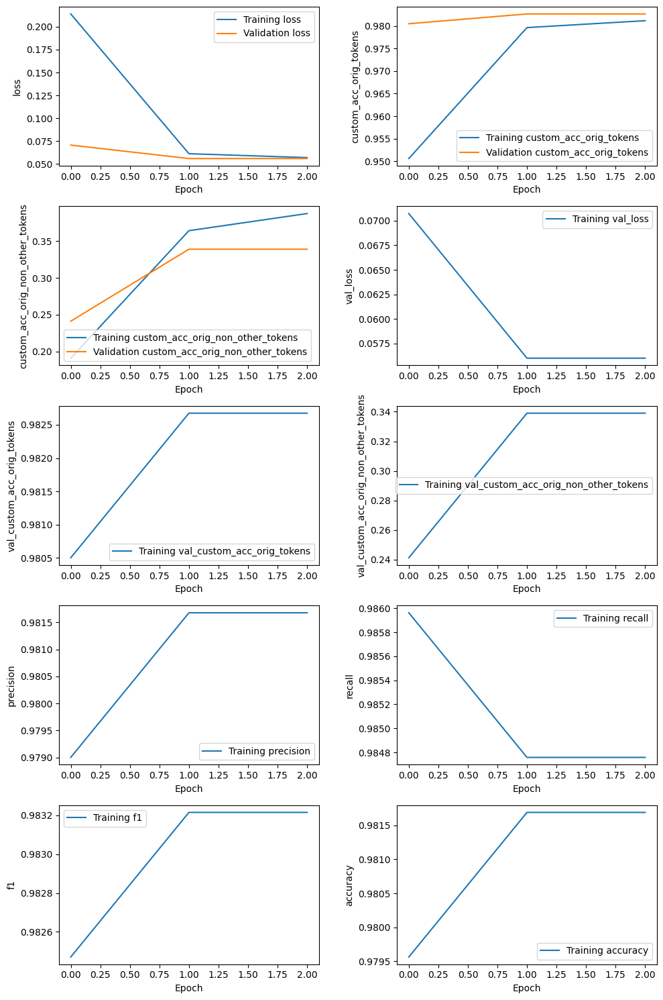

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r2_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.380,0.248,0.300,153,,
OLEFIN,0.616,0.365,0.459,356,,
PRE_CATALYST,0.287,0.380,0.327,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.400,0.024,0.045,83,,
OVERALL,0.480,0.248,0.327,,0.980,0.643


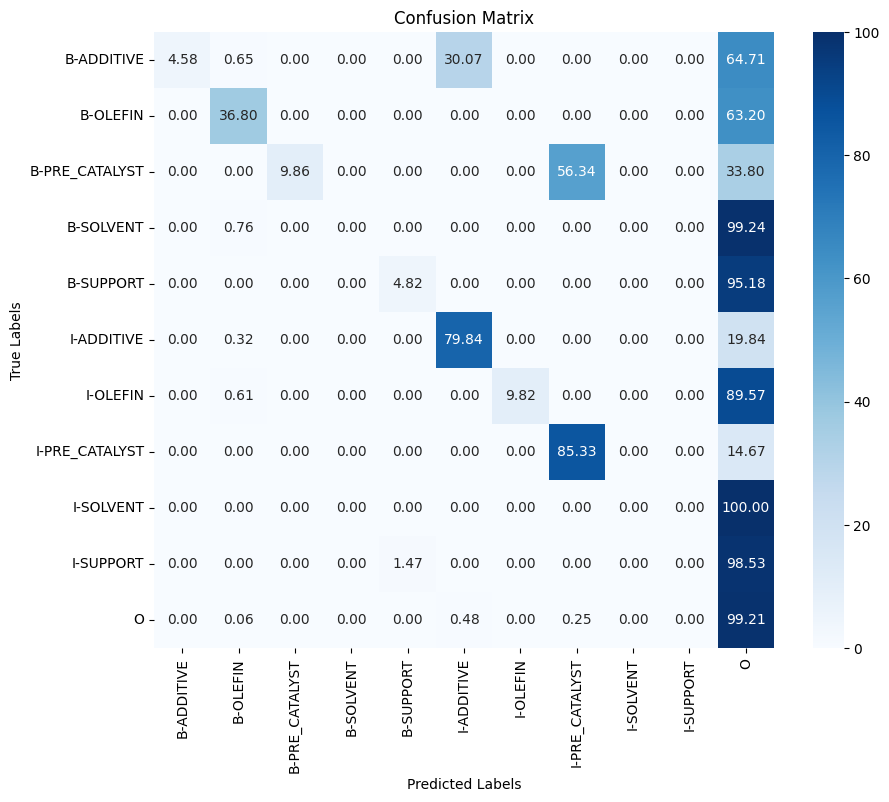

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.2255 - custom_acc_orig_tokens: 0.9393 - custom_acc_orig_non_other_tokens: 0.1848

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 111s 175ms/step - loss: 0.2255 - custom_acc_orig_tokens: 0.9393 - custom_acc_orig_non_other_tokens: 0.1848 - val_loss: 0.0667 - val_custom_acc_orig_tokens: 0.9824 - val_custom_acc_orig_non_other_tokens: 0.2964 - precision: 0.9816 - recall: 0.9857 - f1: 0.9836 - accuracy: 0.9814
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0614 - custom_acc_orig_tokens: 0.9797 - custom_acc_orig_non_other_tokens: 0.3612 - val_loss: 0.0568 - val_custom_acc_orig_tokens: 0.9818 - val_custom_acc_orig_non_other_tokens: 0.3182 - precision: 0.9811 - recall: 0.9844 - f1: 0.9827 - accuracy: 0.9808
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0572 - custom_acc_orig_tokens: 0.9807 - custom_acc_orig_non_other_tokens: 0.3749 - val_loss: 0.0568 - val_custom_acc_orig_tokens: 0.9818 - val_custom_acc_orig_non_other_tokens: 0.3182 - precision: 0.9811 - recall: 0.9844 - f1: 0.9827 - accuracy: 0.9808


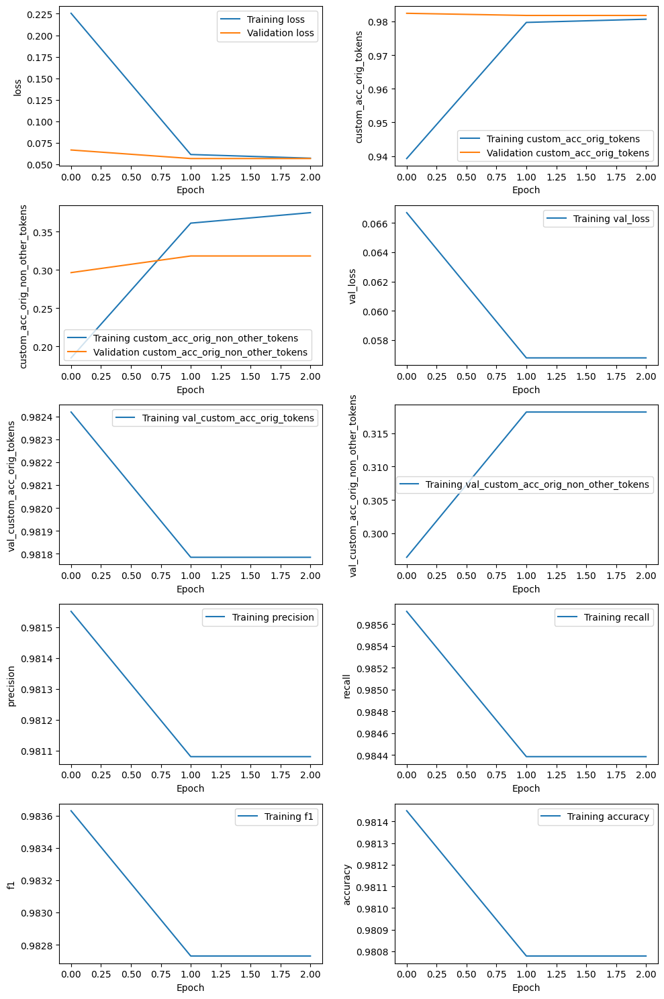

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_2e-05_r3_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.419,0.320,0.363,153,,
OLEFIN,0.653,0.317,0.427,356,,
PRE_CATALYST,0.333,0.366,0.349,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.333,0.024,0.045,83,,
OVERALL,0.508,0.239,0.325,,0.981,0.649


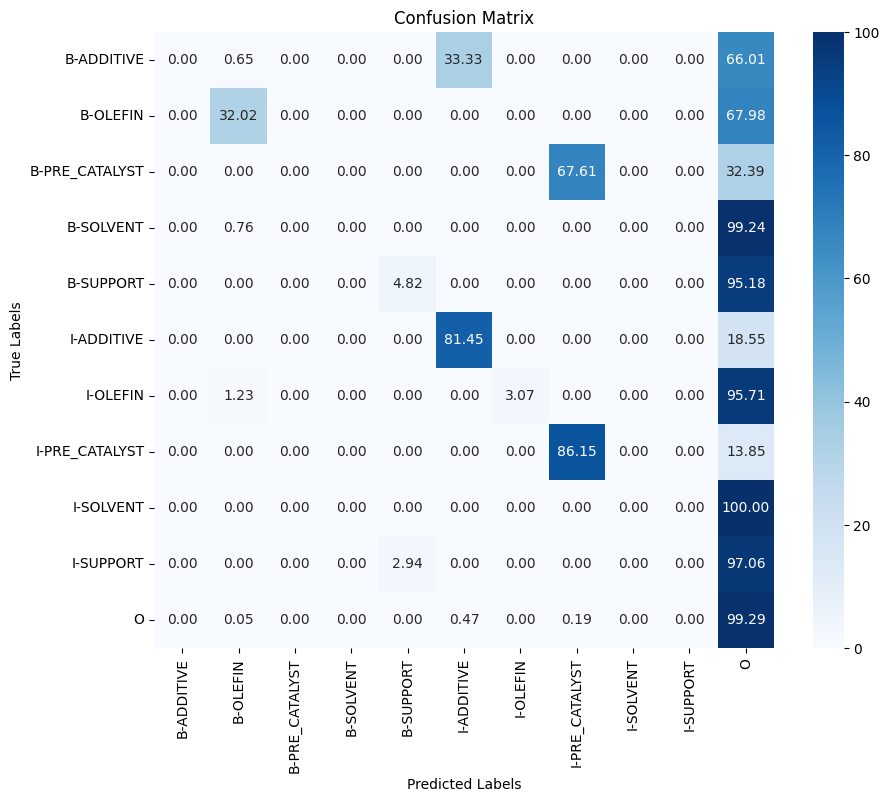

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 110s 174ms/step - loss: 0.1499 - custom_acc_orig_tokens: 0.9670 - custom_acc_orig_non_other_tokens: 0.2554 - val_loss: 0.0706 - val_custom_acc_orig_tokens: 0.9808 - val_custom_acc_orig_non_other_tokens: 0.3525 - precision: 0.9789 - recall: 0.9875 - f1: 0.9832 - accuracy: 0.9799
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0422 - custom_acc_orig_tokens: 0.9841 - custom_acc_orig_non_other_tokens: 0.5247 - val_loss: 0.0441 - val_custom_acc_orig_tokens: 0.9845 - val_custom_acc_orig_non_other_tokens: 0.5003 - precision: 0.9838 - recall: 0.9874 - f1: 0.9856 - accuracy: 0.9836
Epoch 3/3
526/526 [==============================] - 82s 156ms/step - loss: 0.0380 - custom_acc_orig_tokens: 0.9858 - custom_acc_orig_non_other_tokens: 0.5627 - val_loss: 0.0441 - val_custom_acc_orig_tokens: 0.9845 - val_custom_acc_orig_non_other_tokens: 0.5003 - precision: 0.9838 - recall: 0.9874 - f1: 0.9856 - accuracy: 0.9836


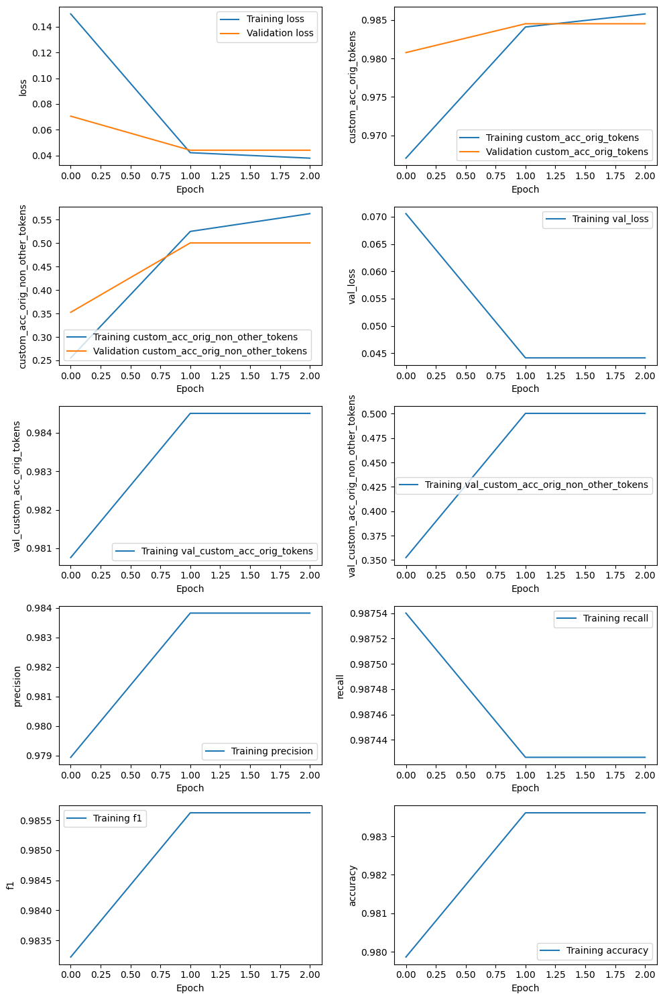

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r1_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.470,0.562,0.512,153,,
OLEFIN,0.639,0.596,0.616,356,,
PRE_CATALYST,0.520,0.718,0.604,71,,
SOLVENT,1.000,0.321,0.486,131,,
SUPPORT,0.582,0.554,0.568,83,,
OVERALL,0.595,0.550,0.572,,0.984,0.719


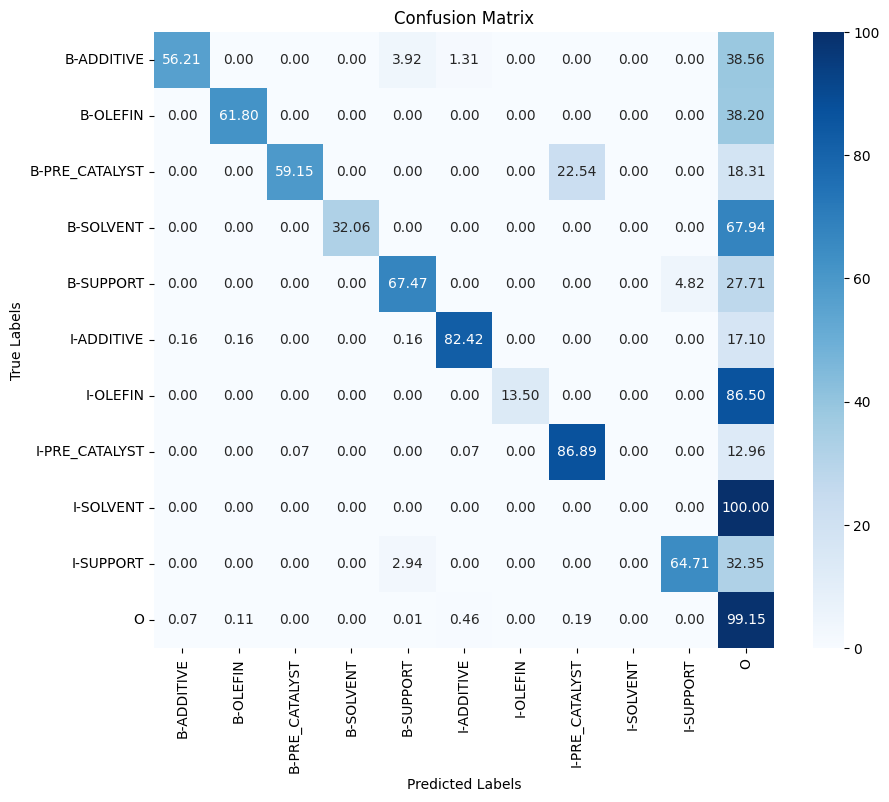

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 112s 174ms/step - loss: 0.1728 - custom_acc_orig_tokens: 0.9574 - custom_acc_orig_non_other_tokens: 0.2323 - val_loss: 0.0733 - val_custom_acc_orig_tokens: 0.9809 - val_custom_acc_orig_non_other_tokens: 0.3496 - precision: 0.9794 - recall: 0.9869 - f1: 0.9831 - accuracy: 0.9800
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0484 - custom_acc_orig_tokens: 0.9818 - custom_acc_orig_non_other_tokens: 0.4785 - val_loss: 0.0469 - val_custom_acc_orig_tokens: 0.9835 - val_custom_acc_orig_non_other_tokens: 0.4884 - precision: 0.9835 - recall: 0.9863 - f1: 0.9849 - accuracy: 0.9825
Epoch 3/3
526/526 [==============================] - 82s 155ms/step - loss: 0.0435 - custom_acc_orig_tokens: 0.9837 - custom_acc_orig_non_other_tokens: 0.5182 - val_loss: 0.0469 - val_custom_acc_orig_tokens: 0.9835 - val_custom_acc_orig_non_other_tokens: 0.4884 - precision: 0.9835 - recall: 0.9863 - f1: 0.9849 - accuracy: 0.9825


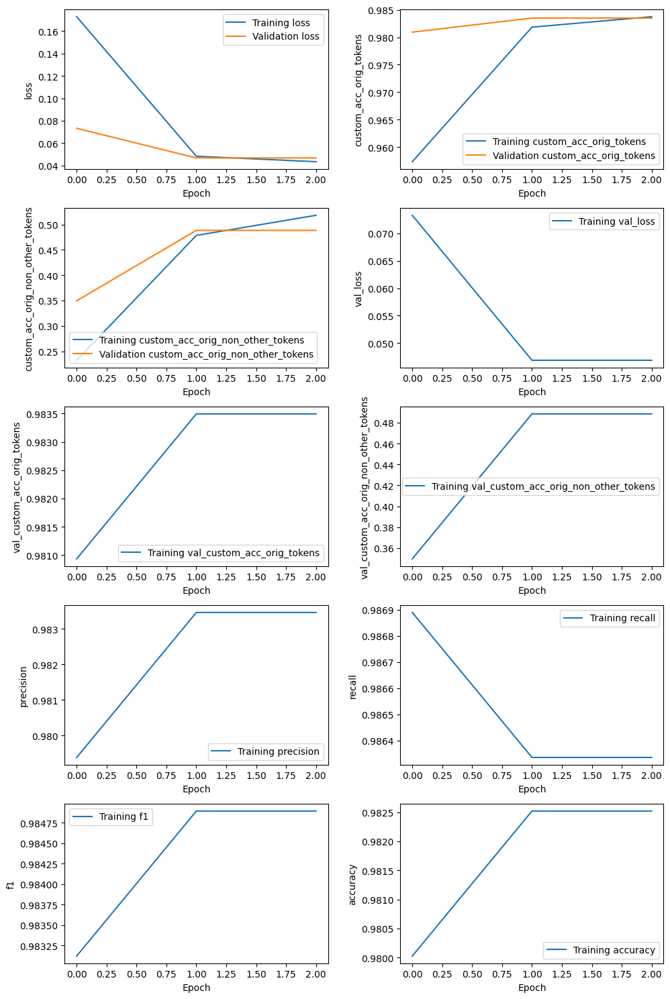

526/526 [==============================] - 34s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 9s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r2_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.457,0.451,0.454,153,,
OLEFIN,0.548,0.463,0.502,356,,
PRE_CATALYST,0.442,0.535,0.484,71,,
SOLVENT,1.000,0.282,0.440,131,,
SUPPORT,0.523,0.410,0.459,83,,
OVERALL,0.536,0.432,0.478,,0.983,0.700


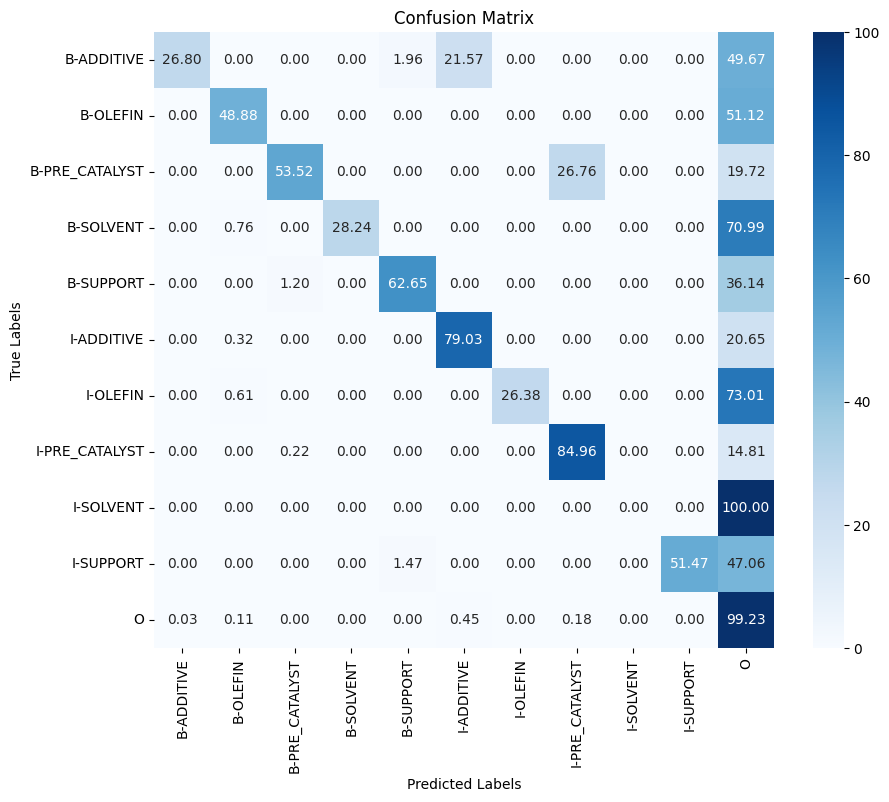

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 174ms/step - loss: 0.1849 - custom_acc_orig_tokens: 0.9499 - custom_acc_orig_non_other_tokens: 0.2201 - val_loss: 0.0716 - val_custom_acc_orig_tokens: 0.9824 - val_custom_acc_orig_non_other_tokens: 0.3797 - precision: 0.9810 - recall: 0.9870 - f1: 0.9840 - accuracy: 0.9815
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0475 - custom_acc_orig_tokens: 0.9825 - custom_acc_orig_non_other_tokens: 0.4760 - val_loss: 0.0449 - val_custom_acc_orig_tokens: 0.9841 - val_custom_acc_orig_non_other_tokens: 0.4727 - precision: 0.9841 - recall: 0.9865 - f1: 0.9853 - accuracy: 0.9832
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0421 - custom_acc_orig_tokens: 0.9843 - custom_acc_orig_non_other_tokens: 0.5126 - val_loss: 0.0449 - val_custom_acc_orig_tokens: 0.9841 - val_custom_acc_orig_non_other_tokens: 0.4727 - precision: 0.9841 - recall: 0.9865 - f1: 0.9853 - accuracy: 0.9832


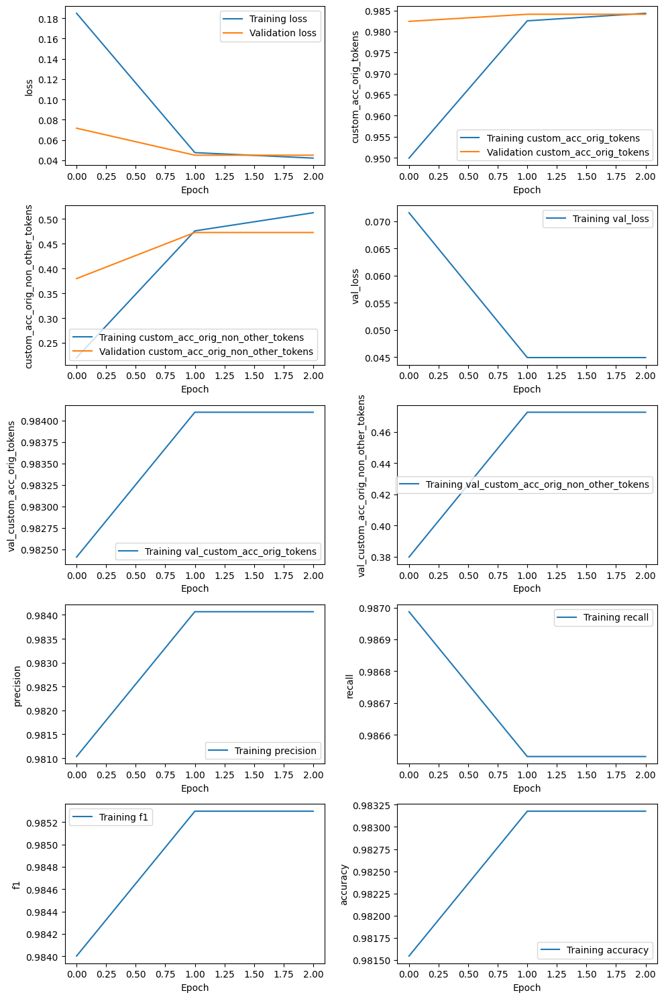

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 9s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_5e-05_r3_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.439,0.490,0.463,153,,
OLEFIN,0.580,0.480,0.525,356,,
PRE_CATALYST,0.467,0.493,0.479,71,,
SOLVENT,1.000,0.298,0.459,131,,
SUPPORT,0.500,0.398,0.443,83,,
OVERALL,0.546,0.445,0.490,,0.983,0.708


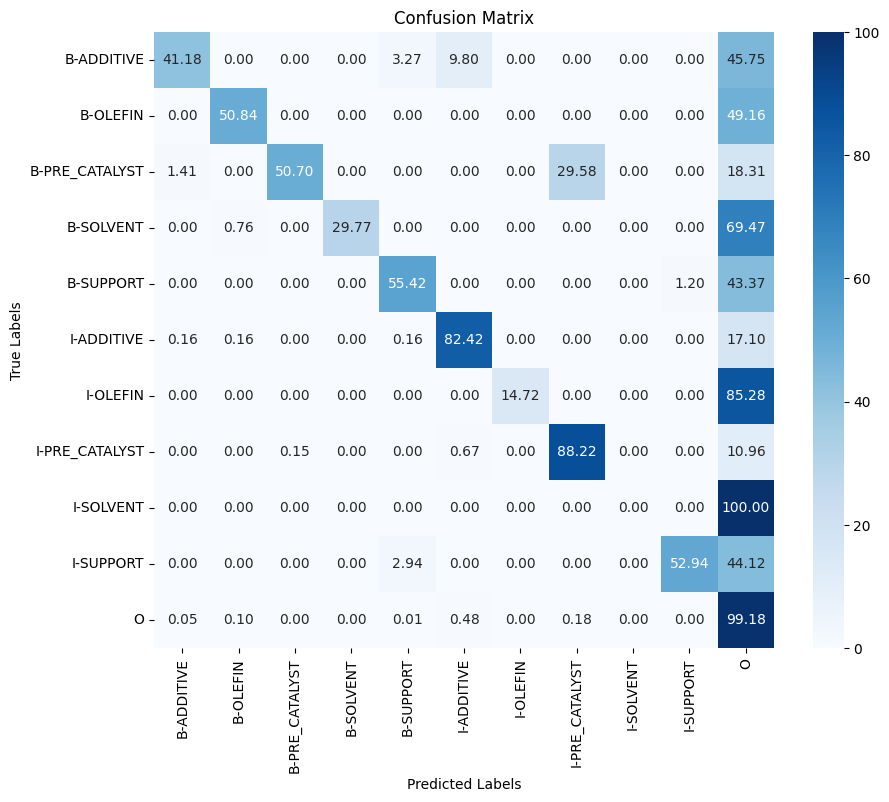

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 110s 174ms/step - loss: 0.1421 - custom_acc_orig_tokens: 0.9682 - custom_acc_orig_non_other_tokens: 0.2780 - val_loss: 0.0652 - val_custom_acc_orig_tokens: 0.9832 - val_custom_acc_orig_non_other_tokens: 0.4638 - precision: 0.9819 - recall: 0.9877 - f1: 0.9848 - accuracy: 0.9823
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0390 - custom_acc_orig_tokens: 0.9851 - custom_acc_orig_non_other_tokens: 0.5928 - val_loss: 0.0436 - val_custom_acc_orig_tokens: 0.9848 - val_custom_acc_orig_non_other_tokens: 0.5888 - precision: 0.9845 - recall: 0.9875 - f1: 0.9860 - accuracy: 0.9839
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0350 - custom_acc_orig_tokens: 0.9868 - custom_acc_orig_non_other_tokens: 0.6394 - val_loss: 0.0436 - val_custom_acc_orig_tokens: 0.9848 - val_custom_acc_orig_non_other_tokens: 0.5888 - precision: 0.9845 - recall: 0.9875 - f1: 0.9860 - accuracy: 0.9839


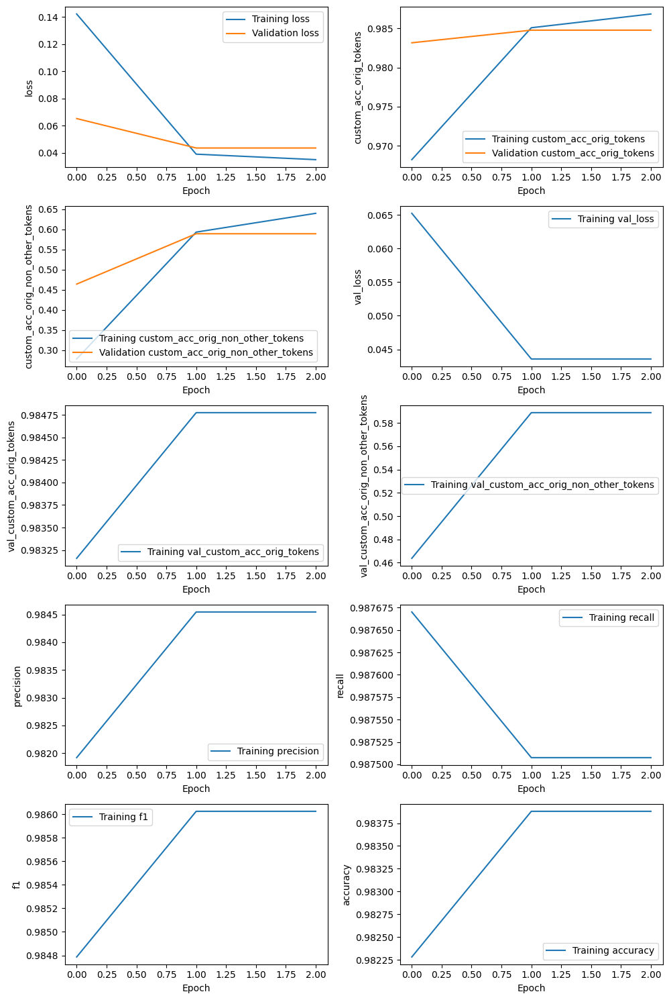

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 9s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r1_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.451,0.627,0.525,153,,
OLEFIN,0.590,0.680,0.632,356,,
PRE_CATALYST,0.527,0.690,0.598,71,,
SOLVENT,0.889,0.489,0.631,131,,
SUPPORT,0.567,0.711,0.631,83,,
OVERALL,0.572,0.642,0.605,,0.984,0.734


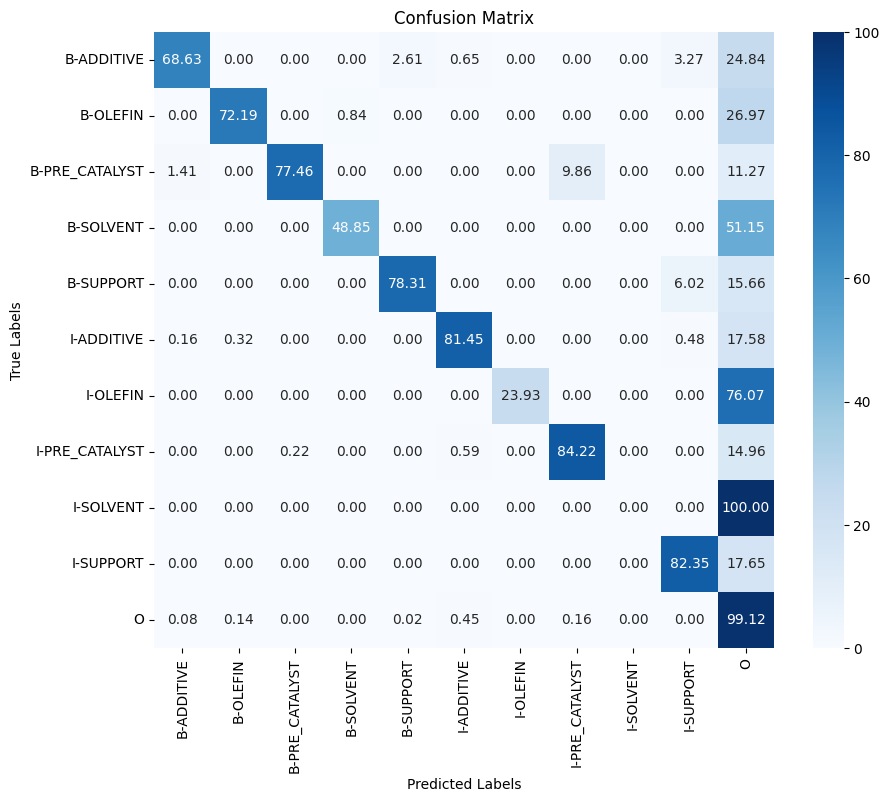

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 175ms/step - loss: 0.1584 - custom_acc_orig_tokens: 0.9598 - custom_acc_orig_non_other_tokens: 0.2693 - val_loss: 0.0767 - val_custom_acc_orig_tokens: 0.9802 - val_custom_acc_orig_non_other_tokens: 0.3910 - precision: 0.9784 - recall: 0.9882 - f1: 0.9833 - accuracy: 0.9793
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0407 - custom_acc_orig_tokens: 0.9843 - custom_acc_orig_non_other_tokens: 0.5705 - val_loss: 0.0407 - val_custom_acc_orig_tokens: 0.9848 - val_custom_acc_orig_non_other_tokens: 0.5557 - precision: 0.9846 - recall: 0.9876 - f1: 0.9861 - accuracy: 0.9840
Epoch 3/3
526/526 [==============================] - 82s 155ms/step - loss: 0.0357 - custom_acc_orig_tokens: 0.9862 - custom_acc_orig_non_other_tokens: 0.6110 - val_loss: 0.0407 - val_custom_acc_orig_tokens: 0.9848 - val_custom_acc_orig_non_other_tokens: 0.5557 - precision: 0.9846 - recall: 0.9876 - f1: 0.9861 - accuracy: 0.9840


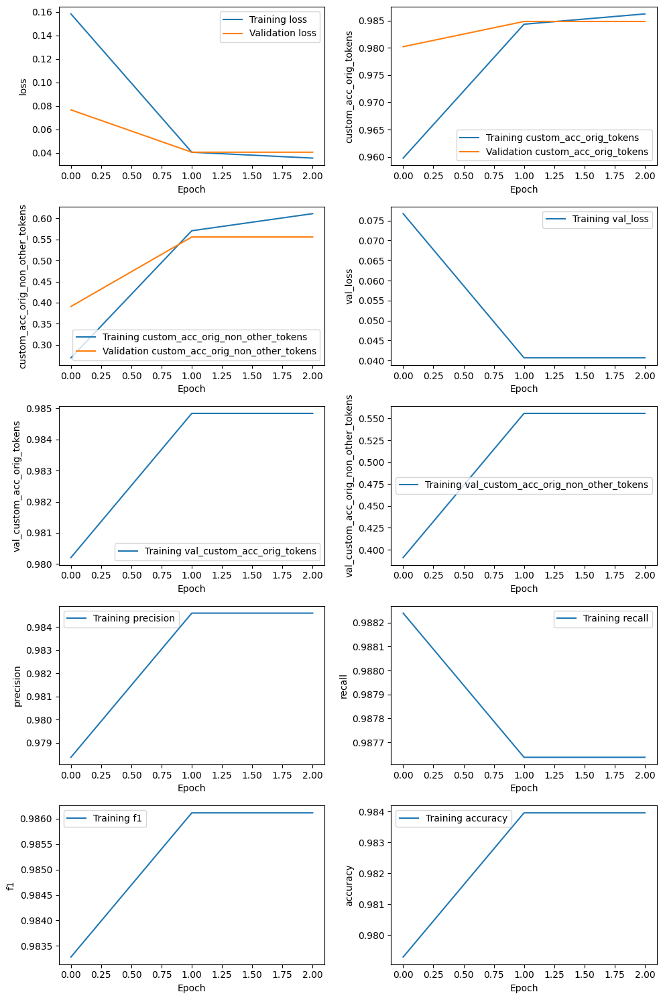

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r2_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.451,0.608,0.518,153,,
OLEFIN,0.570,0.517,0.542,356,,
PRE_CATALYST,0.553,0.732,0.630,71,,
SOLVENT,0.952,0.450,0.611,131,,
SUPPORT,0.553,0.687,0.613,83,,
OVERALL,0.565,0.560,0.563,,0.984,0.725


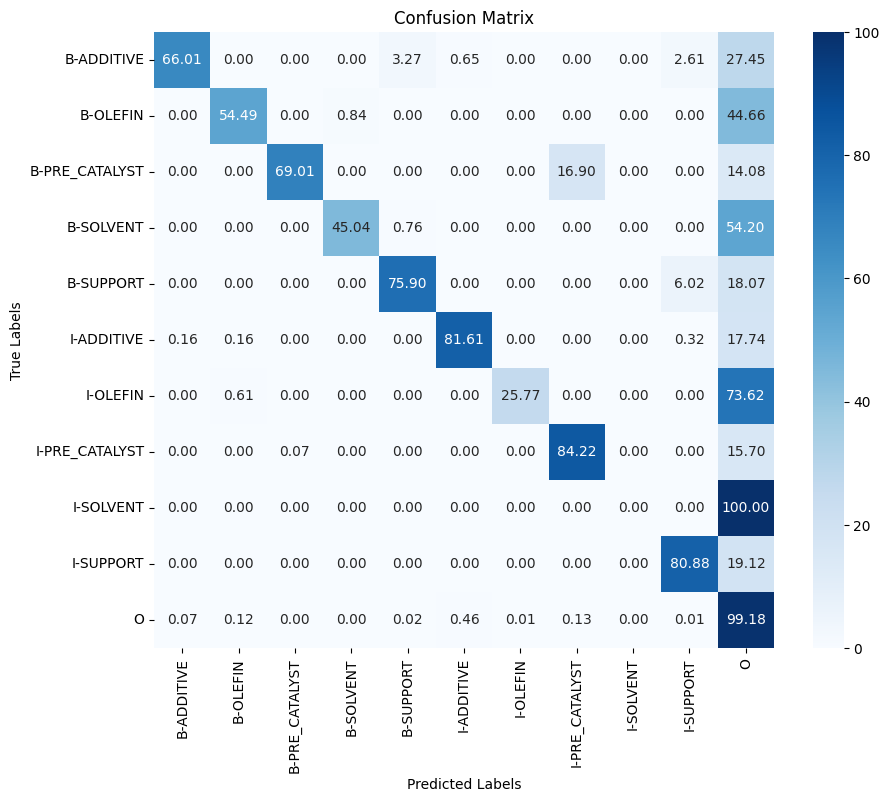

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 112s 174ms/step - loss: 0.1732 - custom_acc_orig_tokens: 0.9533 - custom_acc_orig_non_other_tokens: 0.2327 - val_loss: 0.0762 - val_custom_acc_orig_tokens: 0.9808 - val_custom_acc_orig_non_other_tokens: 0.4107 - precision: 0.9793 - recall: 0.9870 - f1: 0.9831 - accuracy: 0.9799
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0427 - custom_acc_orig_tokens: 0.9839 - custom_acc_orig_non_other_tokens: 0.5669 - val_loss: 0.0441 - val_custom_acc_orig_tokens: 0.9847 - val_custom_acc_orig_non_other_tokens: 0.5859 - precision: 0.9846 - recall: 0.9874 - f1: 0.9860 - accuracy: 0.9839
Epoch 3/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0376 - custom_acc_orig_tokens: 0.9862 - custom_acc_orig_non_other_tokens: 0.6117 - val_loss: 0.0441 - val_custom_acc_orig_tokens: 0.9847 - val_custom_acc_orig_non_other_tokens: 0.5859 - precision: 0.9846 - recall: 0.9874 - f1: 0.9860 - accuracy: 0.9839


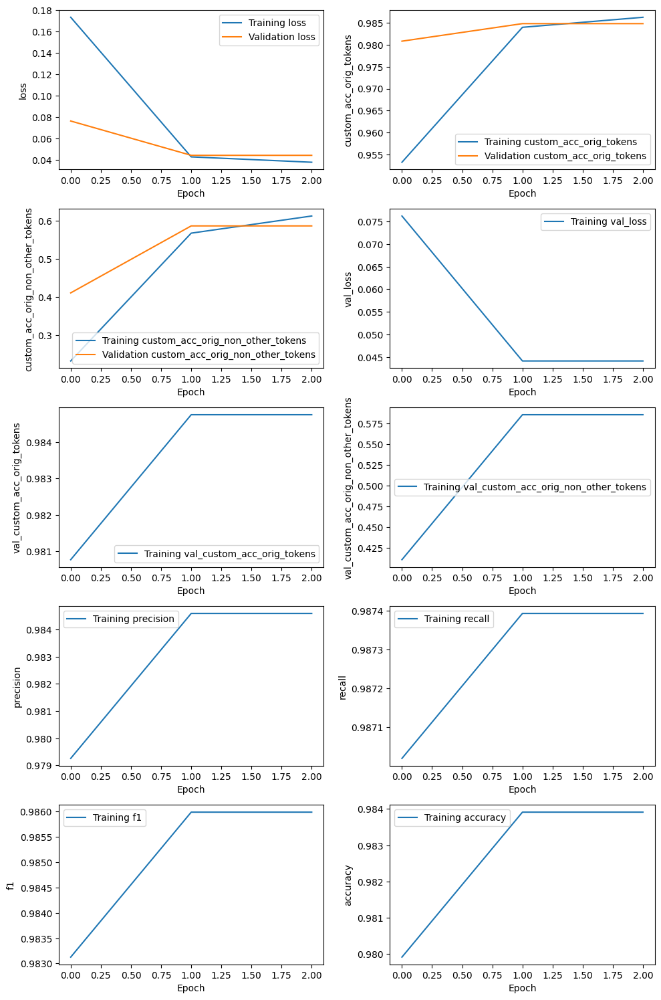

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_32_8e-05_r3_eval_predictions.json in the reposito

,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.481,0.673,0.561,153,,
OLEFIN,0.578,0.593,0.585,356,,
PRE_CATALYST,0.485,0.704,0.575,71,,
SOLVENT,0.865,0.489,0.624,131,,
SUPPORT,0.538,0.675,0.599,83,,
OVERALL,0.563,0.610,0.585,,0.984,0.738


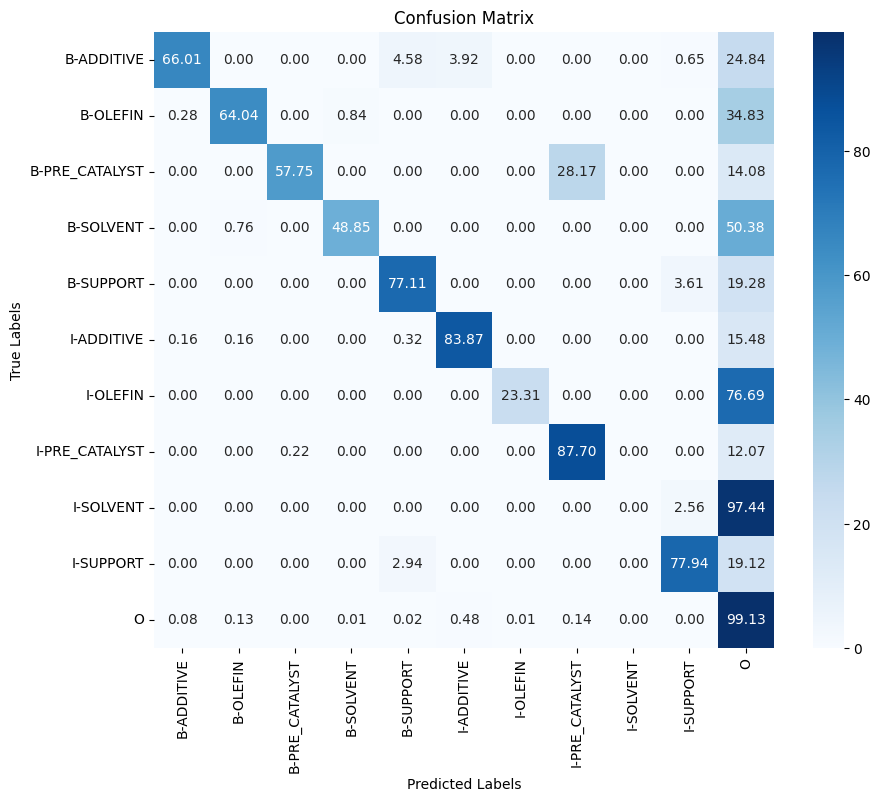

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.1722 - custom_acc_orig_tokens: 0.9662 - custom_acc_orig_non_other_tokens: 0.1930

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 110s 174ms/step - loss: 0.1722 - custom_acc_orig_tokens: 0.9662 - custom_acc_orig_non_other_tokens: 0.1930 - val_loss: 0.0766 - val_custom_acc_orig_tokens: 0.9798 - val_custom_acc_orig_non_other_tokens: 0.2539 - precision: 0.9802 - recall: 0.9833 - f1: 0.9817 - accuracy: 0.9787
Epoch 2/3
526/526 [==============================] - 82s 155ms/step - loss: 0.0890 - custom_acc_orig_tokens: 0.9764 - custom_acc_orig_non_other_tokens: 0.2737 - val_loss: 0.0766 - val_custom_acc_orig_tokens: 0.9798 - val_custom_acc_orig_non_other_tokens: 0.2539 - precision: 0.9802 - recall: 0.9833 - f1: 0.9817 - accuracy: 0.9787
Epoch 3/3
526/526 [==============================] - 82s 156ms/step - loss: 0.0889 - custom_acc_orig_tokens: 0.9763 - custom_acc_orig_non_other_tokens: 0.2733 - val_loss: 0.0766 - val_custom_acc_orig_tokens: 0.9798 - val_custom_acc_orig_non_other_tokens: 0.2539 - precision: 0.9802 - recall: 0.9833 - f1: 0.9817 - accuracy: 0.9787


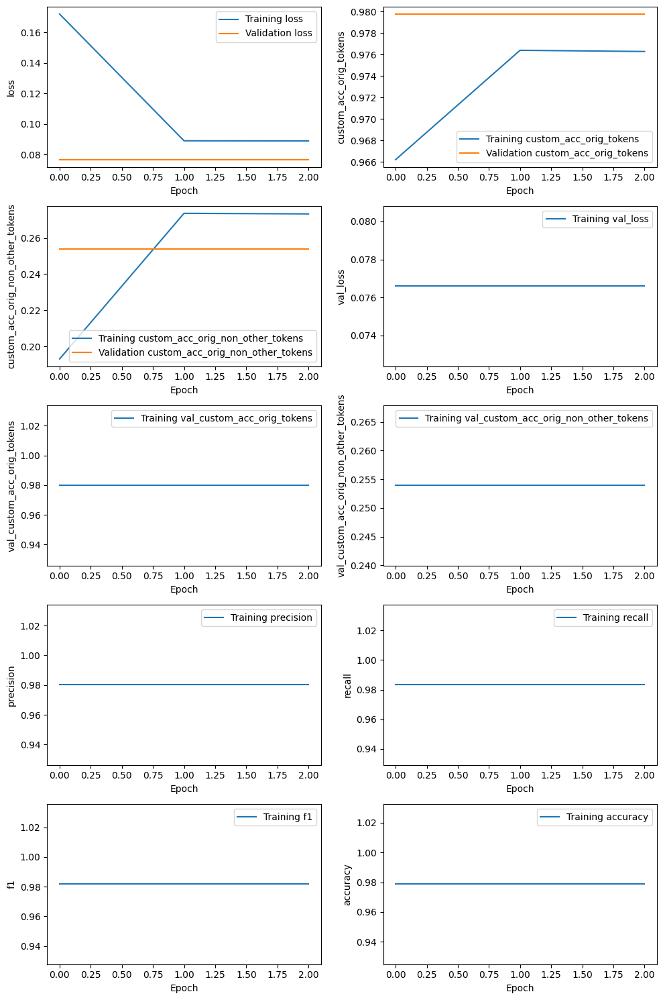

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r1_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.168,0.105,0.129,153,,
OLEFIN,0.000,0.000,0.000,356,,
PRE_CATALYST,0.028,0.042,0.033,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.093,0.024,0.038,,0.976,0.525


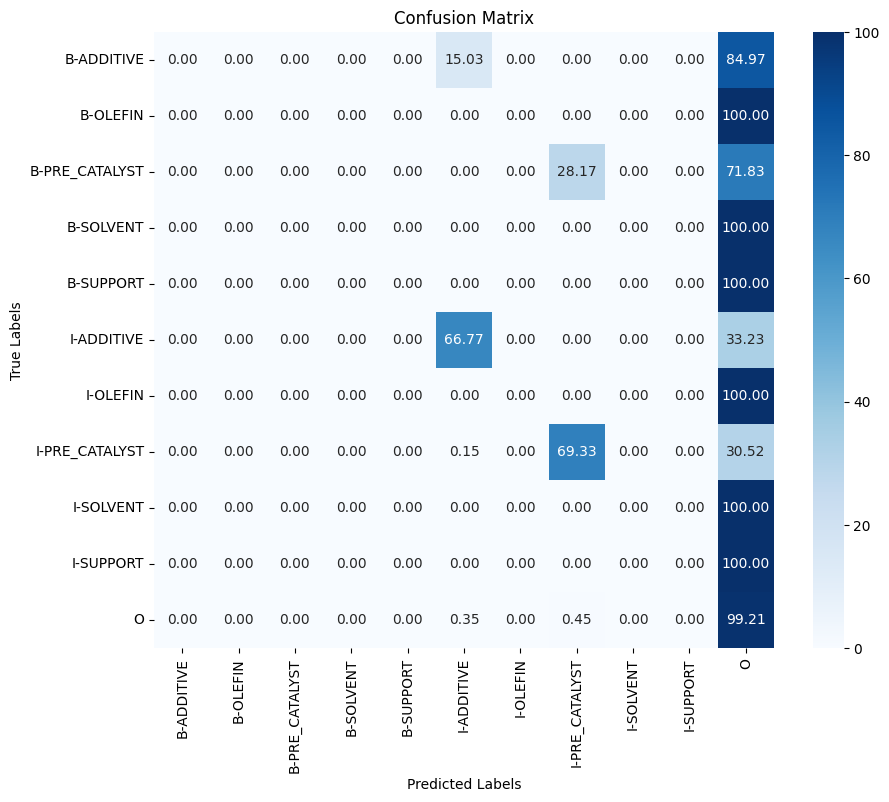

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.1958 - custom_acc_orig_tokens: 0.9549 - custom_acc_orig_non_other_tokens: 0.1786

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 112s 174ms/step - loss: 0.1958 - custom_acc_orig_tokens: 0.9549 - custom_acc_orig_non_other_tokens: 0.1786 - val_loss: 0.0813 - val_custom_acc_orig_tokens: 0.9788 - val_custom_acc_orig_non_other_tokens: 0.2454 - precision: 0.9799 - recall: 0.9821 - f1: 0.9810 - accuracy: 0.9778
Epoch 2/3
526/526 [==============================] - 82s 155ms/step - loss: 0.0961 - custom_acc_orig_tokens: 0.9754 - custom_acc_orig_non_other_tokens: 0.2687 - val_loss: 0.0813 - val_custom_acc_orig_tokens: 0.9788 - val_custom_acc_orig_non_other_tokens: 0.2454 - precision: 0.9799 - recall: 0.9821 - f1: 0.9810 - accuracy: 0.9778
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0962 - custom_acc_orig_tokens: 0.9758 - custom_acc_orig_non_other_tokens: 0.2726 - val_loss: 0.0813 - val_custom_acc_orig_tokens: 0.9788 - val_custom_acc_orig_non_other_tokens: 0.2454 - precision: 0.9799 - recall: 0.9821 - f1: 0.9810 - accuracy: 0.9778


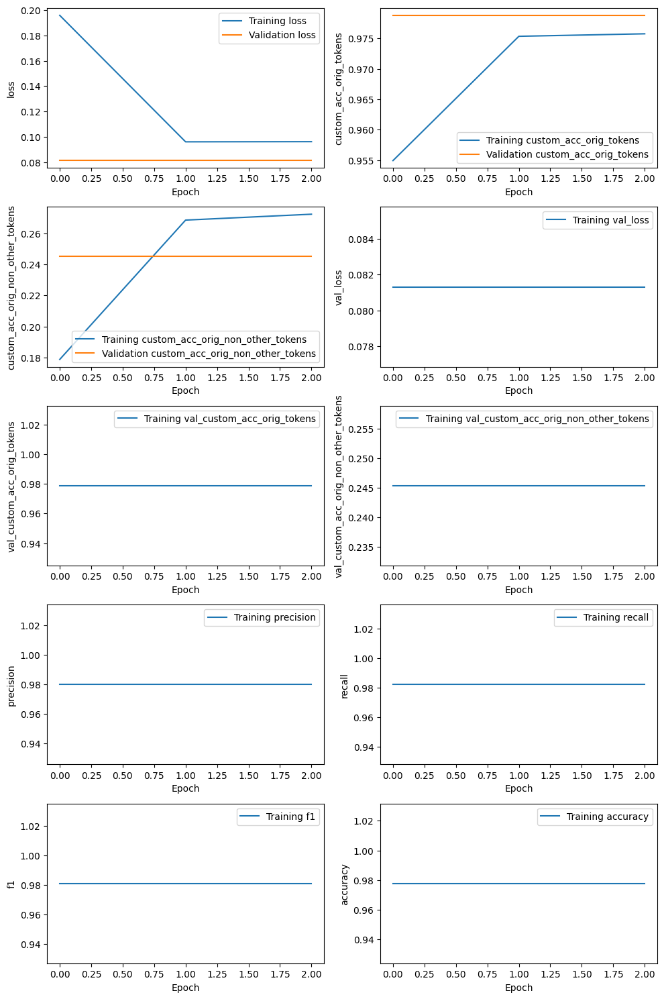

526/526 [==============================] - 34s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r2_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.269,0.137,0.182,153,,
OLEFIN,0.000,0.000,0.000,356,,
PRE_CATALYST,0.028,0.042,0.034,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.130,0.030,0.049,,0.976,0.524


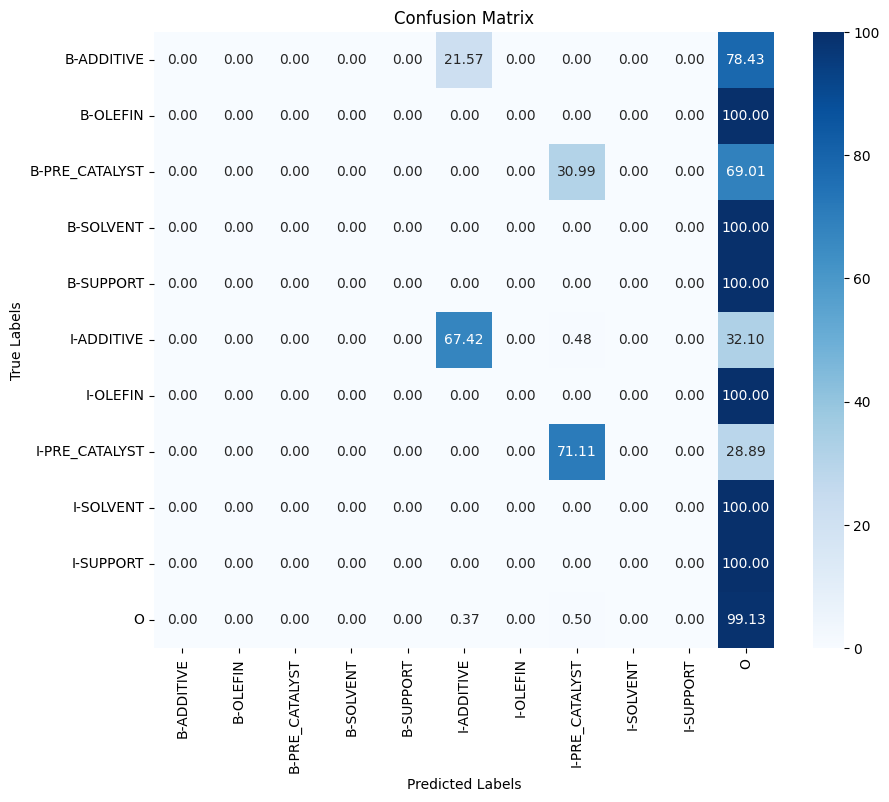

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.2022 - custom_acc_orig_tokens: 0.9476 - custom_acc_orig_non_other_tokens: 0.1716

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 111s 174ms/step - loss: 0.2022 - custom_acc_orig_tokens: 0.9476 - custom_acc_orig_non_other_tokens: 0.1716 - val_loss: 0.0788 - val_custom_acc_orig_tokens: 0.9789 - val_custom_acc_orig_non_other_tokens: 0.2230 - precision: 0.9793 - recall: 0.9827 - f1: 0.9810 - accuracy: 0.9780
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0932 - custom_acc_orig_tokens: 0.9751 - custom_acc_orig_non_other_tokens: 0.2696 - val_loss: 0.0788 - val_custom_acc_orig_tokens: 0.9789 - val_custom_acc_orig_non_other_tokens: 0.2230 - precision: 0.9793 - recall: 0.9827 - f1: 0.9810 - accuracy: 0.9780
Epoch 3/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0932 - custom_acc_orig_tokens: 0.9753 - custom_acc_orig_non_other_tokens: 0.2664 - val_loss: 0.0788 - val_custom_acc_orig_tokens: 0.9789 - val_custom_acc_orig_non_other_tokens: 0.2230 - precision: 0.9793 - recall: 0.9827 - f1: 0.9810 - accuracy: 0.9780


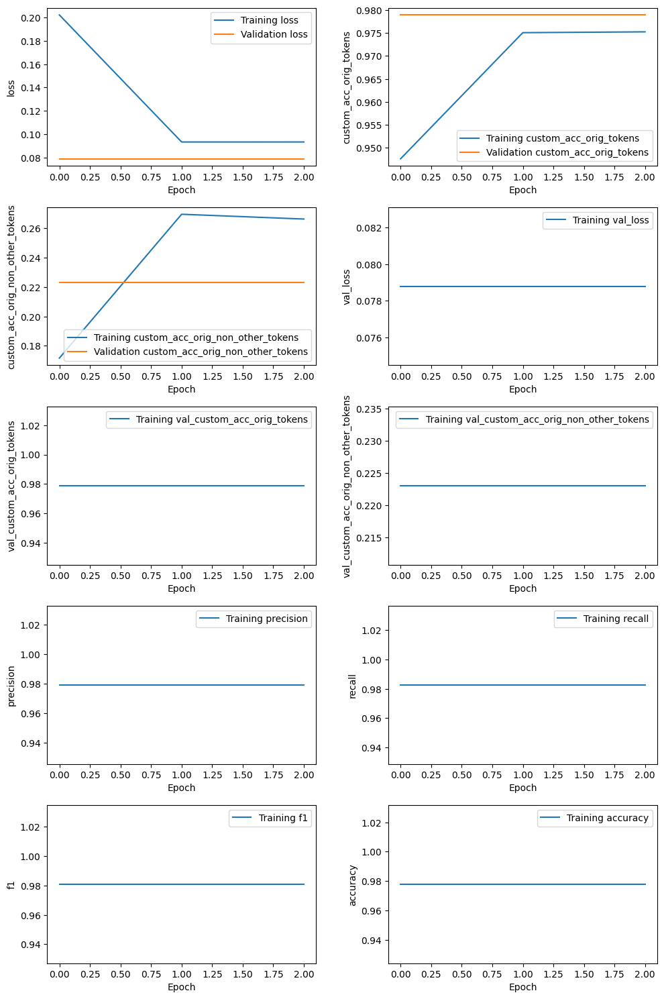

526/526 [==============================] - 34s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 9s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_2e-05_r3_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.301,0.203,0.242,153,,
OLEFIN,0.000,0.000,0.000,356,,
PRE_CATALYST,0.032,0.056,0.041,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.153,0.044,0.068,,0.975,0.519


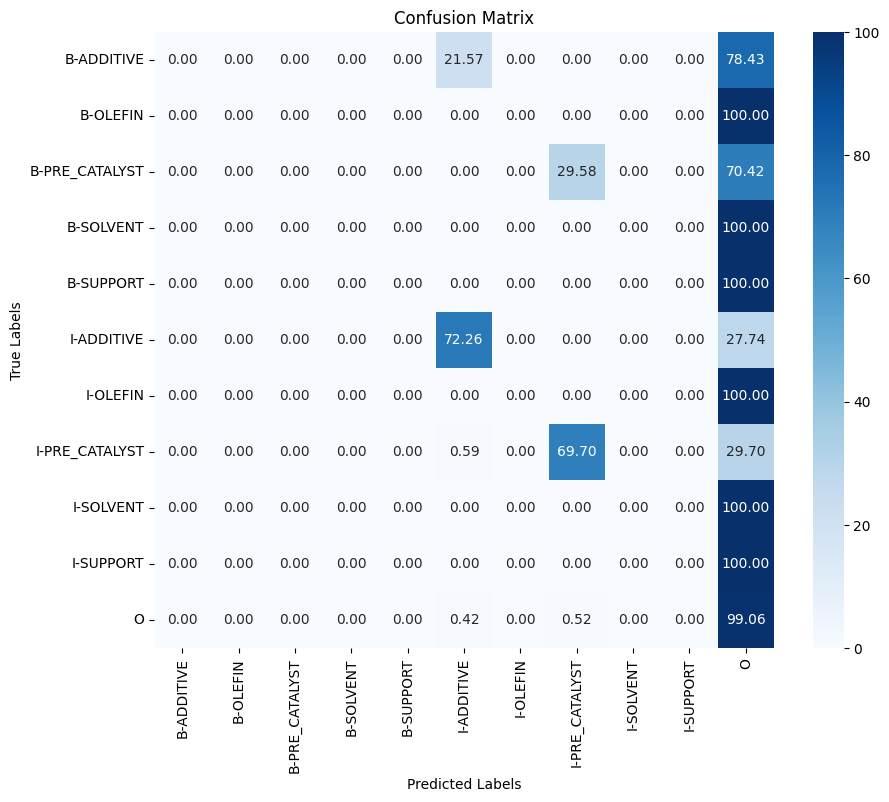

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.1428 - custom_acc_orig_tokens: 0.9679 - custom_acc_orig_non_other_tokens: 0.2124

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 110s 174ms/step - loss: 0.1428 - custom_acc_orig_tokens: 0.9679 - custom_acc_orig_non_other_tokens: 0.2124 - val_loss: 0.0630 - val_custom_acc_orig_tokens: 0.9799 - val_custom_acc_orig_non_other_tokens: 0.2857 - precision: 0.9808 - recall: 0.9830 - f1: 0.9819 - accuracy: 0.9789
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0677 - custom_acc_orig_tokens: 0.9776 - custom_acc_orig_non_other_tokens: 0.3041 - val_loss: 0.0630 - val_custom_acc_orig_tokens: 0.9799 - val_custom_acc_orig_non_other_tokens: 0.2857 - precision: 0.9808 - recall: 0.9830 - f1: 0.9819 - accuracy: 0.9789
Epoch 3/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0680 - custom_acc_orig_tokens: 0.9775 - custom_acc_orig_non_other_tokens: 0.3055 - val_loss: 0.0630 - val_custom_acc_orig_tokens: 0.9799 - val_custom_acc_orig_non_other_tokens: 0.2857 - precision: 0.9808 - recall: 0.9830 - f1: 0.9819 - accuracy: 0.9789


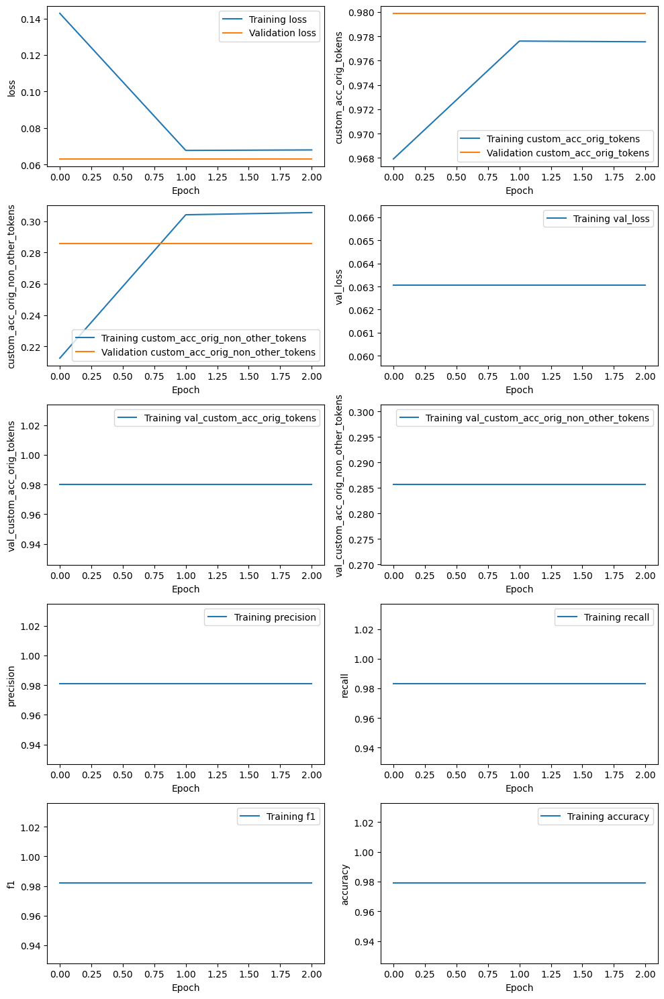

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r1_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.022,0.013,0.016,153,,
OLEFIN,0.653,0.312,0.422,356,,
PRE_CATALYST,0.124,0.197,0.152,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.340,0.160,0.217,,0.978,0.574


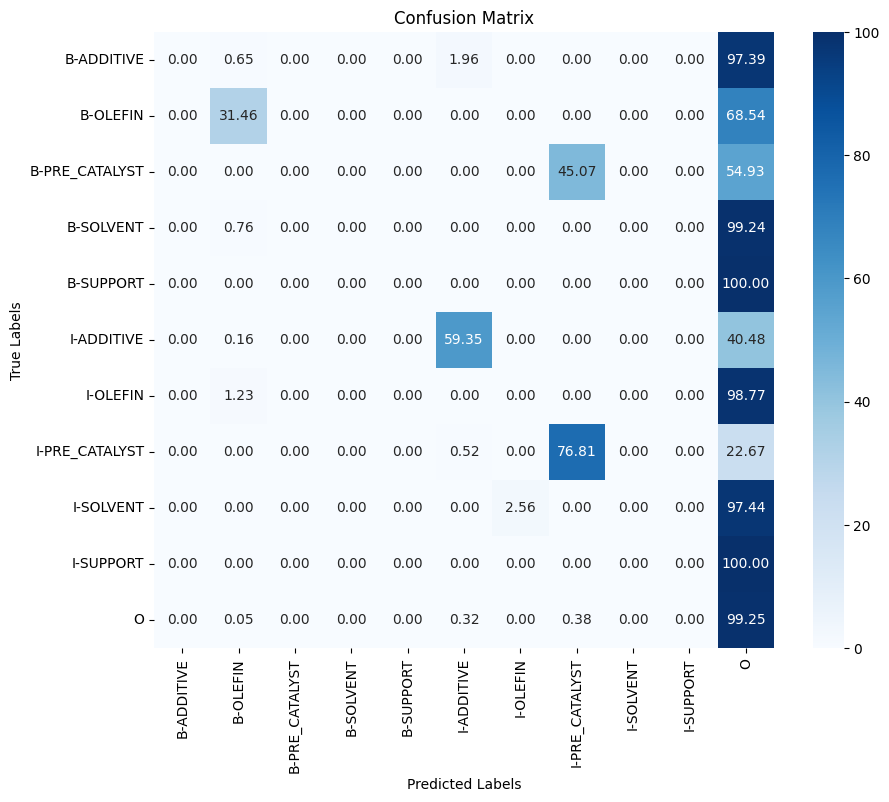

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.1632 - custom_acc_orig_tokens: 0.9603 - custom_acc_orig_non_other_tokens: 0.1986

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 110s 174ms/step - loss: 0.1632 - custom_acc_orig_tokens: 0.9603 - custom_acc_orig_non_other_tokens: 0.1986 - val_loss: 0.0677 - val_custom_acc_orig_tokens: 0.9799 - val_custom_acc_orig_non_other_tokens: 0.2648 - precision: 0.9808 - recall: 0.9833 - f1: 0.9820 - accuracy: 0.9789
Epoch 2/3
526/526 [==============================] - 82s 156ms/step - loss: 0.0758 - custom_acc_orig_tokens: 0.9768 - custom_acc_orig_non_other_tokens: 0.2870 - val_loss: 0.0677 - val_custom_acc_orig_tokens: 0.9799 - val_custom_acc_orig_non_other_tokens: 0.2648 - precision: 0.9808 - recall: 0.9833 - f1: 0.9820 - accuracy: 0.9789
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0758 - custom_acc_orig_tokens: 0.9768 - custom_acc_orig_non_other_tokens: 0.2842 - val_loss: 0.0677 - val_custom_acc_orig_tokens: 0.9799 - val_custom_acc_orig_non_other_tokens: 0.2648 - precision: 0.9808 - recall: 0.9833 - f1: 0.9820 - accuracy: 0.9789


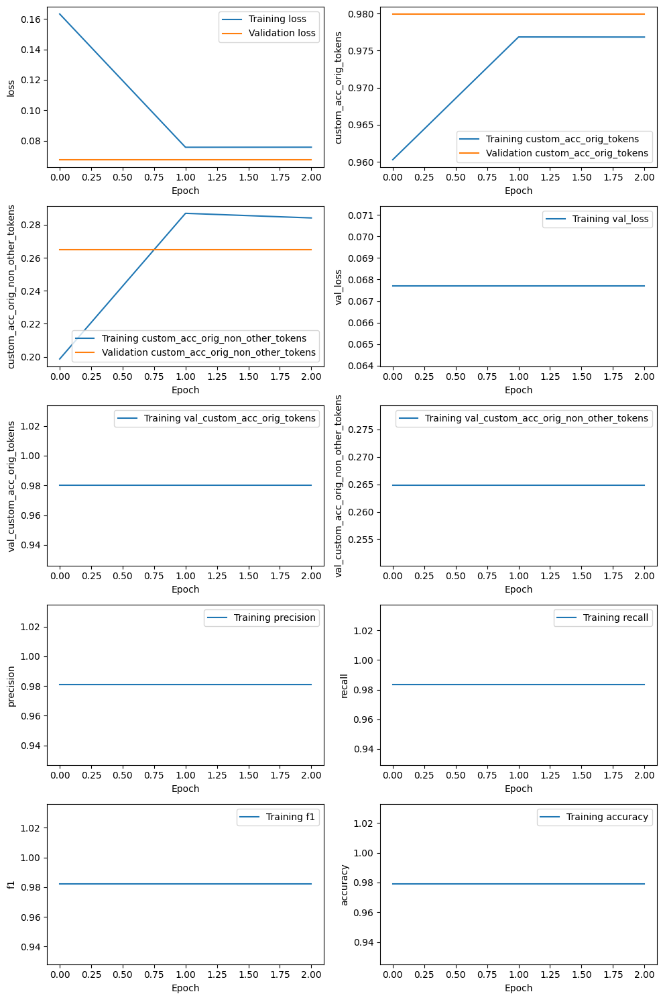

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r2_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.027,0.020,0.023,153,,
OLEFIN,0.579,0.185,0.281,356,,
PRE_CATALYST,0.067,0.085,0.075,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.237,0.094,0.135,,0.979,0.574


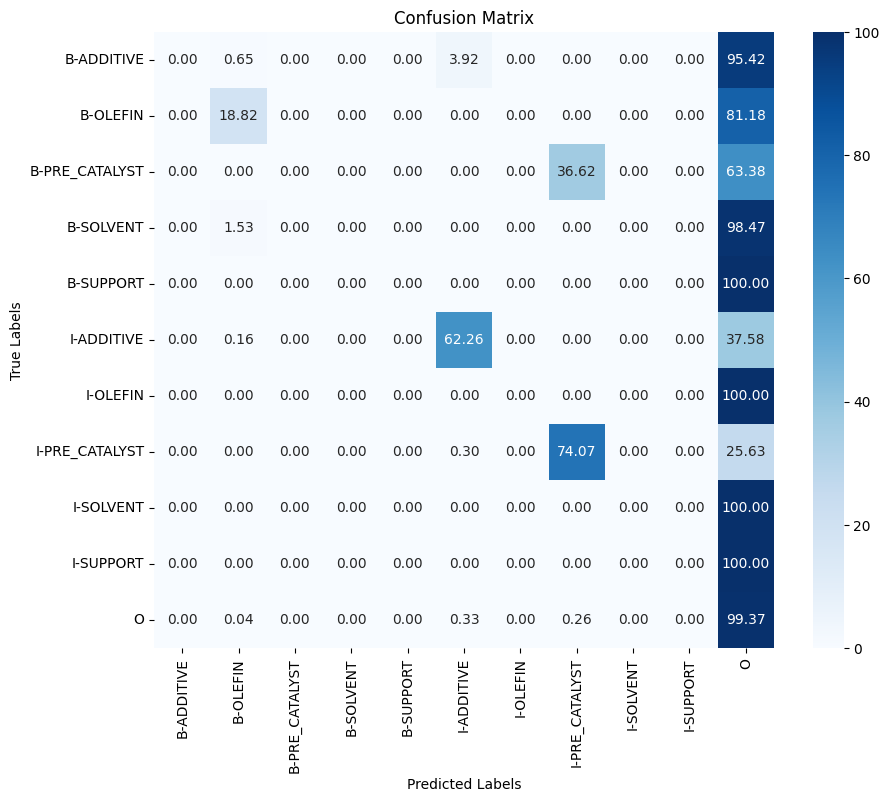

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.1744 - custom_acc_orig_tokens: 0.9547 - custom_acc_orig_non_other_tokens: 0.1900

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 112s 173ms/step - loss: 0.1744 - custom_acc_orig_tokens: 0.9547 - custom_acc_orig_non_other_tokens: 0.1900 - val_loss: 0.0713 - val_custom_acc_orig_tokens: 0.9790 - val_custom_acc_orig_non_other_tokens: 0.2537 - precision: 0.9801 - recall: 0.9822 - f1: 0.9812 - accuracy: 0.9780
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0798 - custom_acc_orig_tokens: 0.9761 - custom_acc_orig_non_other_tokens: 0.2932 - val_loss: 0.0713 - val_custom_acc_orig_tokens: 0.9790 - val_custom_acc_orig_non_other_tokens: 0.2537 - precision: 0.9801 - recall: 0.9822 - f1: 0.9812 - accuracy: 0.9780
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0797 - custom_acc_orig_tokens: 0.9765 - custom_acc_orig_non_other_tokens: 0.2928 - val_loss: 0.0713 - val_custom_acc_orig_tokens: 0.9790 - val_custom_acc_orig_non_other_tokens: 0.2537 - precision: 0.9801 - recall: 0.9822 - f1: 0.9812 - accuracy: 0.9780


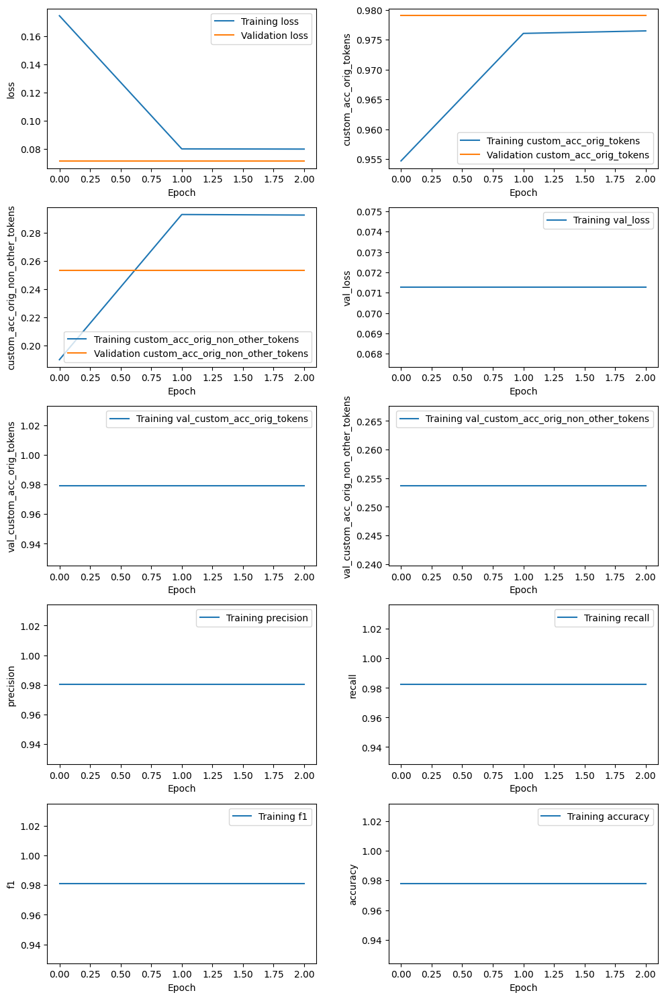

526/526 [==============================] - 34s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 8s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_5e-05_r3_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.271,0.209,0.236,153,,
OLEFIN,0.000,0.000,0.000,356,,
PRE_CATALYST,0.155,0.254,0.193,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.214,0.063,0.097,,0.976,0.532


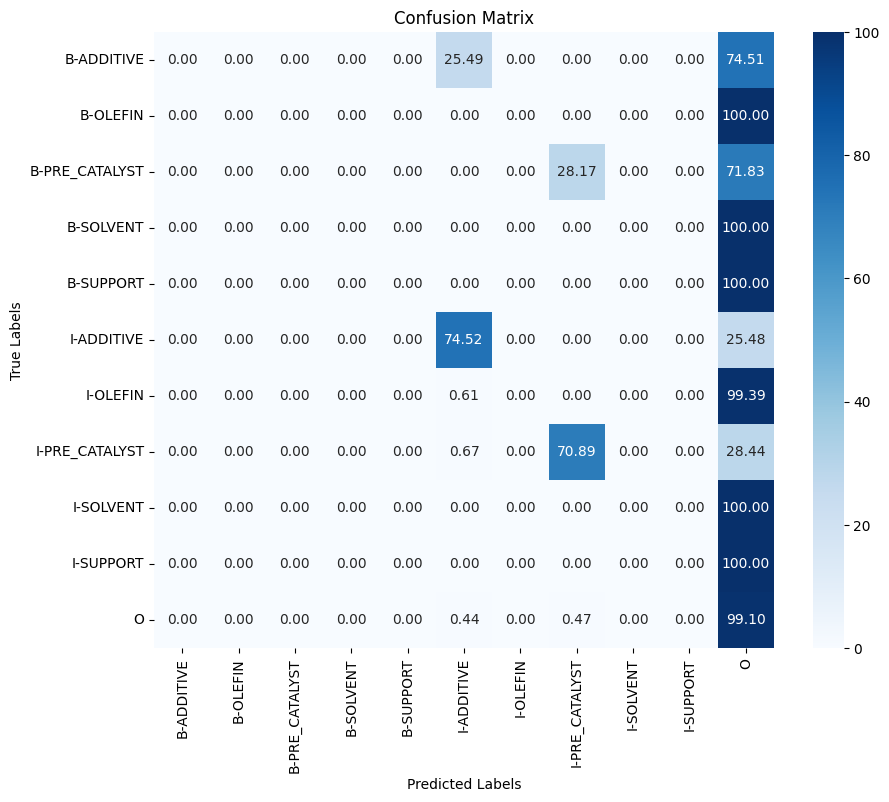

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 174ms/step - loss: 0.1324 - custom_acc_orig_tokens: 0.9686 - custom_acc_orig_non_other_tokens: 0.2410 - val_loss: 0.0566 - val_custom_acc_orig_tokens: 0.9805 - val_custom_acc_orig_non_other_tokens: 0.3056 - precision: 0.9810 - recall: 0.9837 - f1: 0.9824 - accuracy: 0.9795
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0600 - custom_acc_orig_tokens: 0.9789 - custom_acc_orig_non_other_tokens: 0.3446 - val_loss: 0.0566 - val_custom_acc_orig_tokens: 0.9805 - val_custom_acc_orig_non_other_tokens: 0.3056 - precision: 0.9810 - recall: 0.9837 - f1: 0.9824 - accuracy: 0.9795
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0603 - custom_acc_orig_tokens: 0.9788 - custom_acc_orig_non_other_tokens: 0.3451 - val_loss: 0.0566 - val_custom_acc_orig_tokens: 0.9805 - val_custom_acc_orig_non_other_tokens: 0.3056 - precision: 0.9810 - recall: 0.9837 - f1: 0.9824 - accuracy: 0.9795


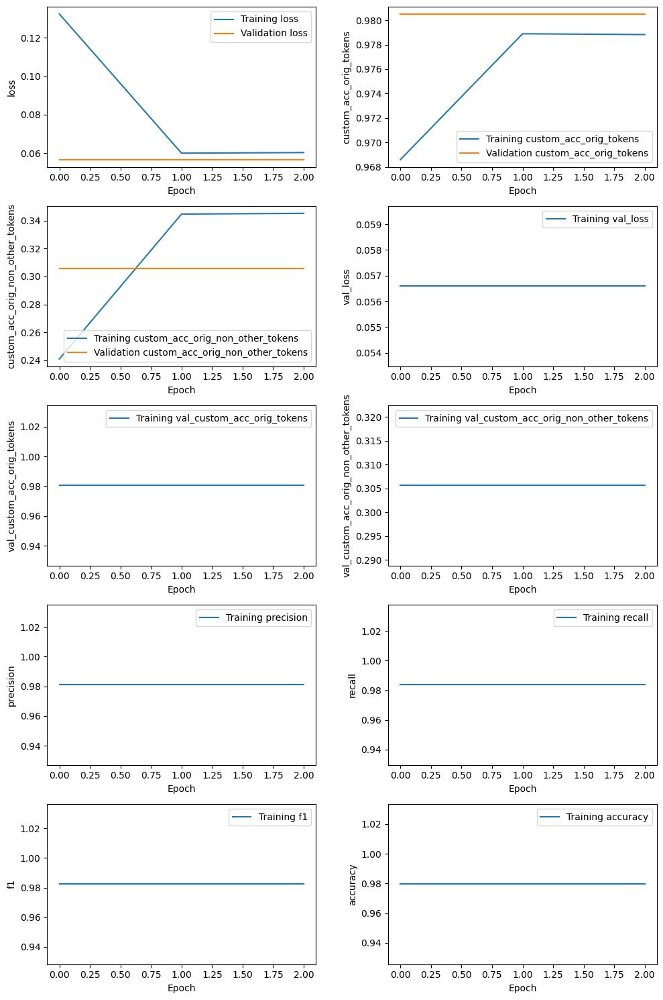

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r1_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r1_val_predictions.json in the repository.
155/155 [==============================] - 9s 56ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r1_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.029,0.020,0.023,153,,
OLEFIN,0.587,0.559,0.573,356,,
PRE_CATALYST,0.183,0.324,0.234,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.500,0.048,0.088,83,,
OVERALL,0.397,0.288,0.334,,0.979,0.612


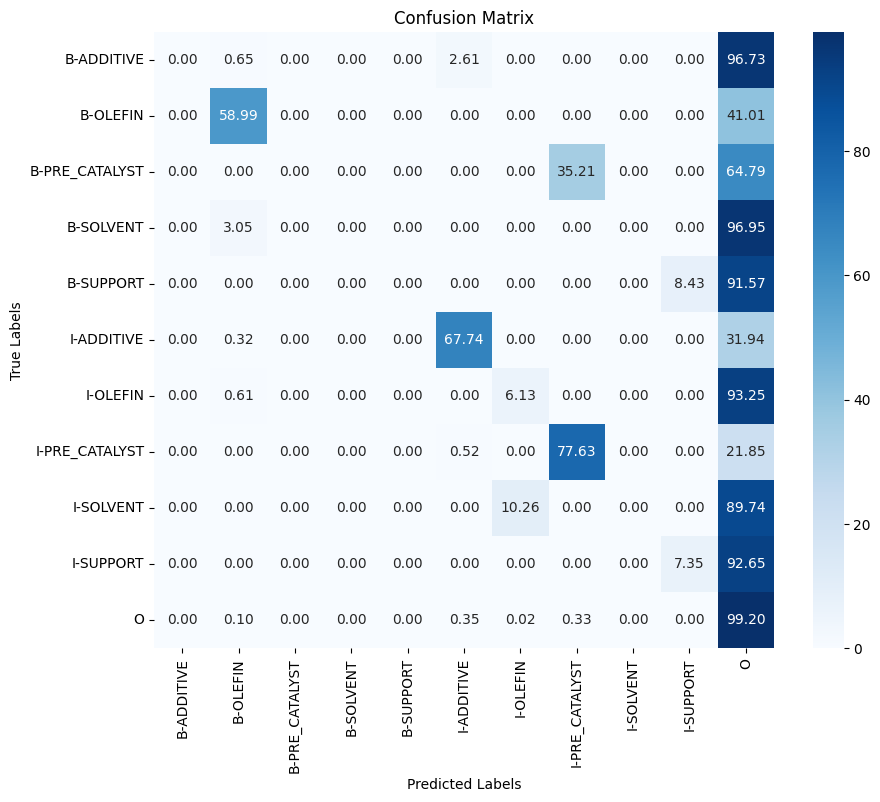

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - ETA: 0s - loss: 0.1492 - custom_acc_orig_tokens: 0.9629 - custom_acc_orig_non_other_tokens: 0.2264

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


526/526 [==============================] - 111s 174ms/step - loss: 0.1492 - custom_acc_orig_tokens: 0.9629 - custom_acc_orig_non_other_tokens: 0.2264 - val_loss: 0.0637 - val_custom_acc_orig_tokens: 0.9798 - val_custom_acc_orig_non_other_tokens: 0.3091 - precision: 0.9818 - recall: 0.9826 - f1: 0.9822 - accuracy: 0.9788
Epoch 2/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0667 - custom_acc_orig_tokens: 0.9781 - custom_acc_orig_non_other_tokens: 0.3394 - val_loss: 0.0637 - val_custom_acc_orig_tokens: 0.9798 - val_custom_acc_orig_non_other_tokens: 0.3091 - precision: 0.9818 - recall: 0.9826 - f1: 0.9822 - accuracy: 0.9788
Epoch 3/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0667 - custom_acc_orig_tokens: 0.9784 - custom_acc_orig_non_other_tokens: 0.3432 - val_loss: 0.0637 - val_custom_acc_orig_tokens: 0.9798 - val_custom_acc_orig_non_other_tokens: 0.3091 - precision: 0.9818 - recall: 0.9826 - f1: 0.9822 - accuracy: 0.9788


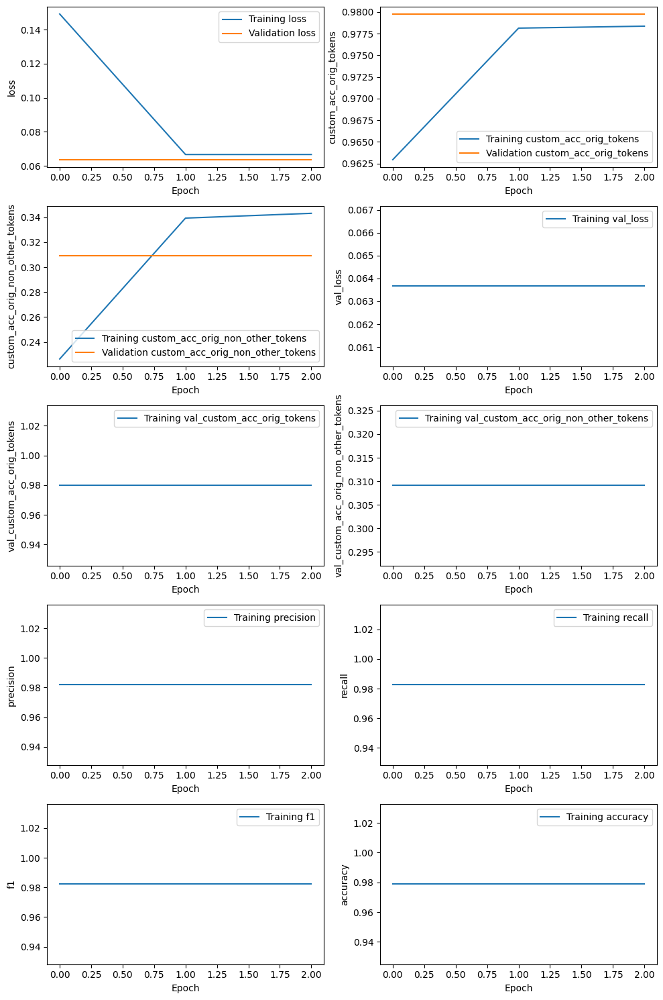

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r2_train_predictions.json in the repository.
93/93 [==============================] - 5s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r2_val_predictions.json in the repository.
155/155 [==============================] - 8s 53ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r2_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.131,0.085,0.103,153,,
OLEFIN,0.545,0.565,0.554,356,,
PRE_CATALYST,0.139,0.211,0.168,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.398,0.288,0.334,,0.978,0.599


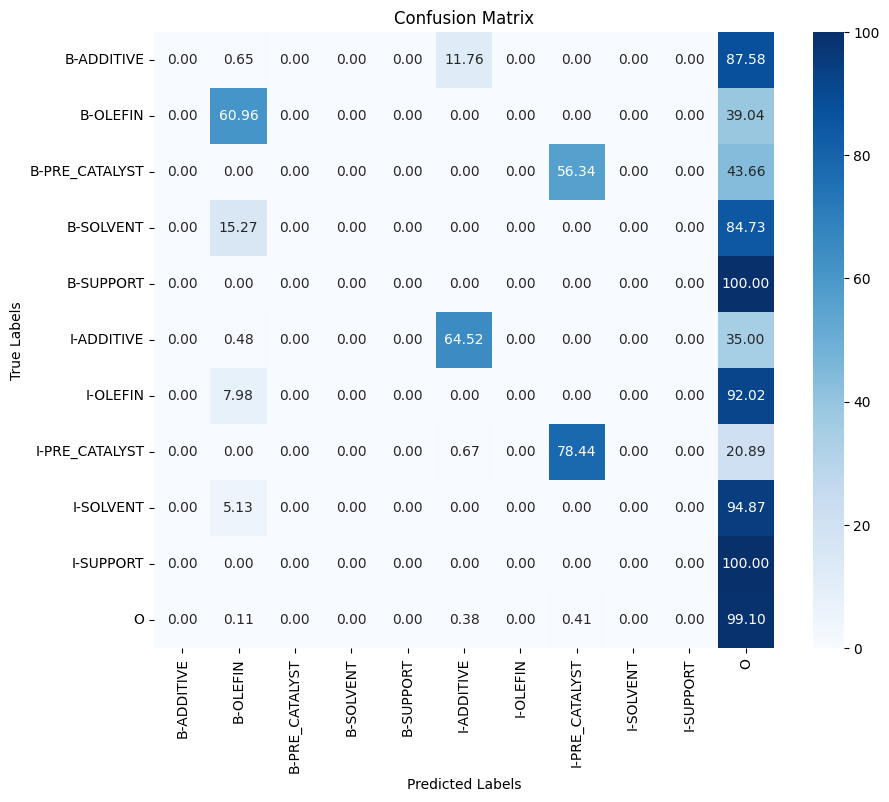

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

All PyTorch model weights were used when initializing TFBertModel.

Some weights or buffers of the TF 2.0 model TFBertModel were not initialized from the PyTorch model and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/functional.py:641: UserWarning: Input dict contained keys ['id'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


526/526 [==============================] - 111s 174ms/step - loss: 0.1583 - custom_acc_orig_tokens: 0.9571 - custom_acc_orig_non_other_tokens: 0.1889 - val_loss: 0.0647 - val_custom_acc_orig_tokens: 0.9807 - val_custom_acc_orig_non_other_tokens: 0.3053 - precision: 0.9815 - recall: 0.9829 - f1: 0.9822 - accuracy: 0.9796
Epoch 2/3
526/526 [==============================] - 81s 155ms/step - loss: 0.0692 - custom_acc_orig_tokens: 0.9764 - custom_acc_orig_non_other_tokens: 0.2993 - val_loss: 0.0647 - val_custom_acc_orig_tokens: 0.9807 - val_custom_acc_orig_non_other_tokens: 0.3053 - precision: 0.9815 - recall: 0.9829 - f1: 0.9822 - accuracy: 0.9796
Epoch 3/3
526/526 [==============================] - 81s 154ms/step - loss: 0.0694 - custom_acc_orig_tokens: 0.9765 - custom_acc_orig_non_other_tokens: 0.2963 - val_loss: 0.0647 - val_custom_acc_orig_tokens: 0.9807 - val_custom_acc_orig_non_other_tokens: 0.3053 - precision: 0.9815 - recall: 0.9829 - f1: 0.9822 - accuracy: 0.9796


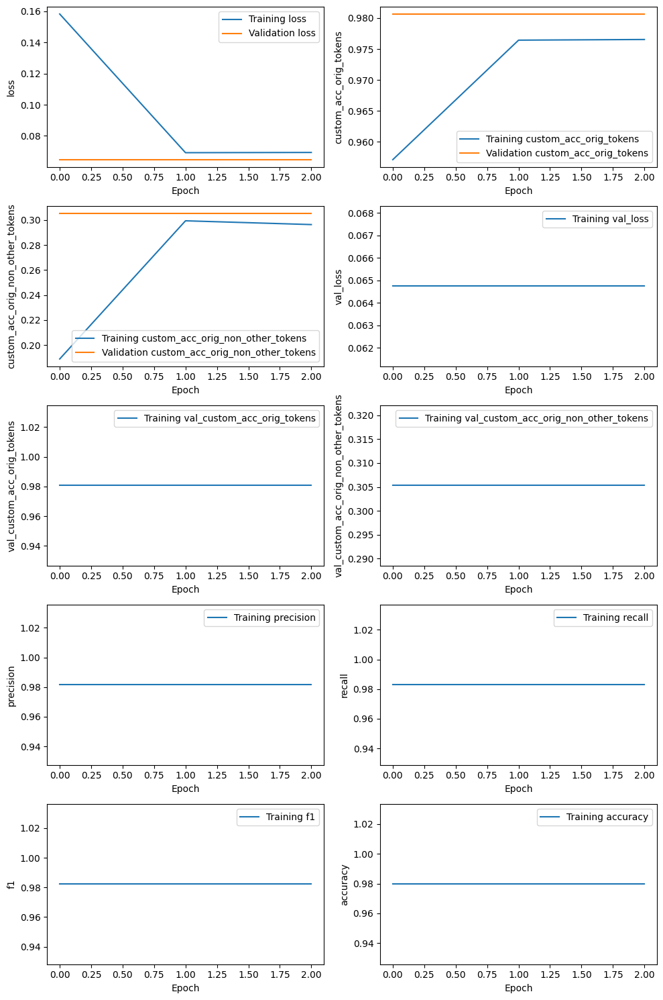

526/526 [==============================] - 32s 54ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r3_train_predictions.json in the repository.
93/93 [==============================] - 5s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r3_val_predictions.json in the repository.
155/155 [==============================] - 9s 55ms/step
File not found: 404 {"message": "Not Found", "documentation_url": "https://docs.github.com/rest/repos/contents#get-repository-content", "status": "404"}. Creating a new one.
Created data/interim/C_spanbert_catalyst_all_concat_64_8e-05_r3_eval_predictions.json in the reposito

/usr/local/lib/python3.10/dist-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Final evaluation metrics for train set

Final evaluation metrics for validation set

Final evaluation metrics for evaluation set


,Precision,Recall,F1,Support,Accuracy,MCC
Label,,,,,,
ADDITIVE,0.156,0.111,0.130,153,,
OLEFIN,0.523,0.421,0.467,356,,
PRE_CATALYST,0.186,0.380,0.250,71,,
SOLVENT,0.000,0.000,0.000,131,,
SUPPORT,0.000,0.000,0.000,83,,
OVERALL,0.359,0.244,0.291,,0.977,0.571


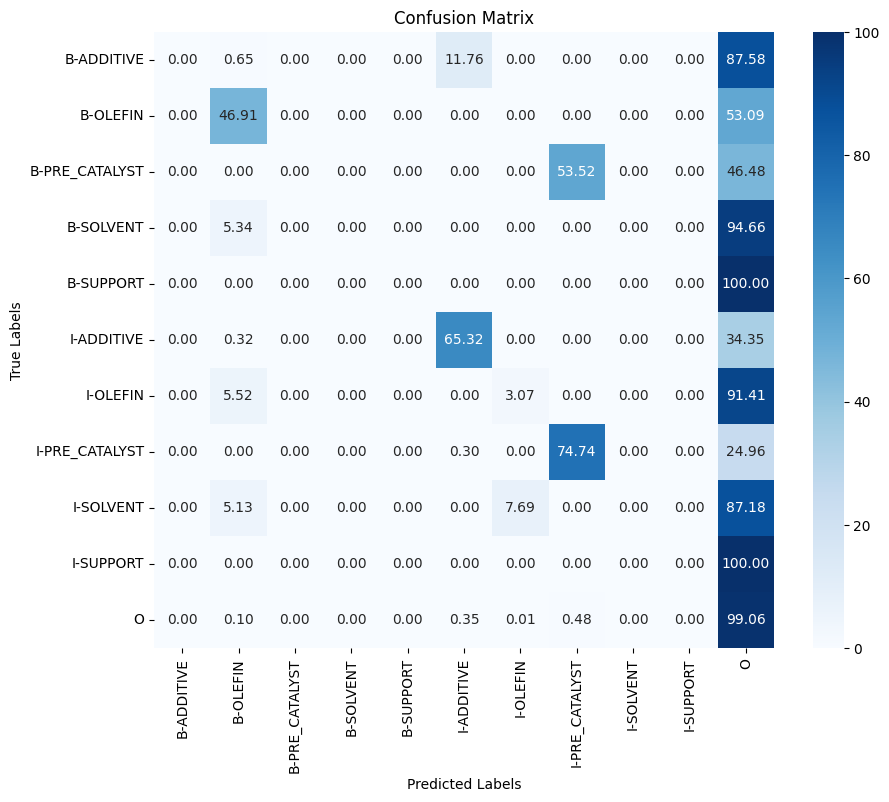

Displaying the first 5 mismatched passages:
Passage 1:
Tokens: ['2', 'Hz', ')', ',', '0', '.', '66', '(', 's', ',', '3H', ')', ',', '0', '.', '64', '(', 's', ',', '3H', ')', ',', '0', '.', '58', '(', 's', ',', '3H', ')', ',', '0', '.', '57', '(', 's', ',']
True Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
Predicted Labels: ['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']

Passage 2:
Tokens: ['and', 'BA', '?', 'to', 'BG', '?', 'except', 'substitute', 'BOMATPB', 'for', 'BOMATPBmix', '.', 'Preferred', 'monomers', 'include', 'the', 'C2', '-', '20', '?', '-', 'olefins', 'especially', 'ethylene', ',', 'propylene', ',', 'isobutylene', ',', '1', '-', 'butene', ',', '1', '-', 'pentene', ',', '1', '-', 'hexene', ',

In [ ]:
# Battery dataset -- fine-tune appraoch w/ concatenation of last 4 hidden layers (9 hyperparameter combinations)

start_time = timeit.default_timer()

scibert_models1 = run_models(
    checkpoint='SpanBERT/spanbert-base-cased',
    name_prefix='C_',
    dataset='catalyst',
    train_strategy='all', # ['none', 'some', 'all']
    retrain_layers=list(range(12)),  # []
    feedforward_strategies=['concat'],  # ['last', 'concat']
    concat_layers=[8,9,10,11],
    batch_sizes=[16,32,64], # [16,32,64]
    init_lrs=[2e-5,5e-5,8e-5]) # [2e-5,5e-5,8e-5]


elapsed = timeit.default_timer() - start_time
print(f"\n\n{elapsed} seconds")
# A100: